In [136]:
# Isaac Berez
# 17.01.23
import sys
from scipy.io import mmread
import os
import glob
import pandas as pd
import numpy as np
#from pandas_ods_reader import read_ods
from copy import deepcopy
import pprint
import json
import re
from datetime import datetime
import logging
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn import preprocessing
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import DBSCAN
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from collections import Counter
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import harmonypy as hm
from matplotlib.cm import ScalarMappable
from datetime import date
import mpld3
import hvplot.pandas
import holoviews as hv
from holoviews import opts
import panel as pn
import bokeh
from bokeh.resources import INLINE
import bbknn

import dimorph_processing as dp
import cell_comparison as cc
import sd_v_amy_tsne_harmony_comp as thc


today = str(date.today())
%matplotlib notebook
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Analyze similarity between SD dataset and Amy dataset by integrating with harmony and

1) Concat two datasets using an intersected gene list: [genesXcells]Amy [genesXcells]SD
2) Feature Selection (CV highest variable genes) on each dataset seperately and use the union, recombine
3) PCA Dimensionality Reduction, using find knee to get cutoff 
4) Harmony Integration, with vars_use = dataset (?), iterate until convergence
5) Tsne with harmony as input
5) Run Tsne on each, visulize, color each cell by dataset, color each cell in the SD dataset by the match cell type in the FC dataset

Load data

In [2]:
IEG_list = []
with open('/bigdata/isaac/IEG_cluster.txt', 'r') as fh:
    for g in fh:
        IEG_list.append(g[:-1])

In [3]:
sex_gene_list = []
with open('/bigdata/isaac/sex_gene_list.txt', 'r') as fh:
    for g in fh:
        sex_gene_list.append(g[:-1])

In [5]:
amy_df_orig = pd.read_csv('/bigdata/isaac/amy_fc_data/Amy_FC_allcells_with_metadata_31-Jul-2022.txt', encoding='utf-8', delimiter='\t') 



/tmp/ipykernel_3116087/2145579833.py:1: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,2

In [38]:
amy_df_orig

,cellID,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
0,celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
1,sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
2,FC time,2,2,2,2,2,2,2,2,0,...,2,2,2,2,2,2,2,2,2,2
3,batch,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
4,Xkr4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27997,AC168977.1,0,0,0,3,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27998,PISD,9,0,0,3,8,0,0,4,4,...,17,0,0,9,0,0,8,10,9,8
27999,DHRSX,0,0,0,0,0,0,0,4,0,...,0,0,6,0,6,0,0,0,4,8
28000,Vmn2r122,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [200]:
amy_metadata_df = amy_df_orig.iloc[:4,:]
amy_metadata_df = amy_metadata_df.set_index('cellID')

In [201]:
amy_metadata_df

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3


In [84]:
_, idx = np.unique(amy_metadata_df.loc['celltype'], return_index=True)
amy_celltype = np.array(amy_metadata_df.loc['celltype'][np.sort(idx)])
list(amy_celltype)

/tmp/ipykernel_2519638/1349414274.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_celltype = np.array(amy_metadata_df.loc['celltype'][np.sort(idx)])


['GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-30-Prlr-Calcr',
 'GABA-50-Chat-Vip',
 'GABA-43-Crabp1-Etv1',
 'GABA-13-Adora2a-Crh',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-48-Reln-Crim1',
 'GABA-18-Isl1-Tac1',
 'GABA-15-Drd1-Ebf1',
 'GABA-14-Drd1-Scn4b',
 'GABA-19-Isl1-Aldoc',
 'GABA-55-Sncg-Vip',
 'GABA-31-Prlr-Cbln1',
 'GABA-34-Prlr-Satb1',
 'GABA-1-Foxp2_Fmod',
 'GABA-22-Gal-Avp',
 'GABA-25-Lhx8-Th',
 'GABA-20-Gpr101-Gabre',
 'GABA-42-Moxd1-Vwc2',
 'GABA-41-Moxd1-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-4-Foxp2_Htr1f',
 'GABA-54-Scng-Kcnc2',
 'GABA-29-Prlr-Greb1',
 'GABA-46-Lamp5-Kit',
 'GABA-56-Sncg-Krt73',
 'GABA-27-Lhx6-Nxph2',
 'GABA-23-Fign-Lrpprc',
 'GABA-28-Cbln4-Luzp2',
 'GABA-49-Npnt-Calca',
 'GABA-8-Prkcd-Oprk1',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-3-Foxp2_Col6a1',
 'GABA-10-Prkcd-Adora2a',
 'GABA-9-Prkcd-Ezr',
 'GABA-16-Prkcd-Nts',
 'GABA-52-Calb2-Rgs12',
 'GABA-47-Reln-Ndnf',
 'GABA-53-Htr3a-Kcnc2',
 'GABA-40-Rpb4-Sst',
 'GABA-2-Foxp2_Adra2a',
 'GABA-26-Cbln4-

In [202]:

cls = [x.split('-')[0] for x in np.array(amy_metadata_df.loc['celltype'])]
amy_metadata_df.loc['cell_class'] = cls
markers = [re.split(r"-|_",x)[2:4] for x in np.array(amy_metadata_df.loc['celltype'])]
amy_metadata_df.loc['markers'] = markers


In [203]:
amy_metadata_df

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]


In [204]:
#get dendrogram order
amy_celltype_subset = amy_celltype[:-14]

In [205]:
amy_celltype[-14:]

array(['Astro', 'Astro_SC', 'Astro_agt', 'COP', 'EC', 'Epend', 'OL',
       'OPC', 'OPC_cycling', 'Peri', 'VLMC', 'VSM', 'microglia', 'pvm'],
      dtype=object)

In [ ]:
amy_gabas = [x for x in amy_celltype_subset if x[:4]=='GABA']
amy_gabas_sorted = sorted(amy_gabas, key=lambda x: int(x.split('-')[1]))
amy_vglut1s = [x for x in amy_celltype_subset if x[:6]=='VGLUT1']
amy_vglut1s_sorted = sorted(amy_vglut1s, key=lambda x: int(x.split('-')[1]))
amy_vglut2s = [x for x in amy_celltype_subset if x[:6]=='VGLUT2']
amy_vglut2s_sorted = sorted(amy_vglut2s, key=lambda x: int(x.split('-')[1]))

In [207]:
amy_dd_order = np.concatenate((amy_gabas_sorted,amy_vglut1s_sorted,amy_vglut2s_sorted, amy_celltype[-14:]))

In [208]:
amy_dd_order

array(['GABA-1-Foxp2_Fmod', 'GABA-2-Foxp2_Adra2a', 'GABA-3-Foxp2_Col6a1',
       'GABA-4-Foxp2_Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [ ]:
#use '-' consistently instead of occasional '_' in marker names
#amy_dd_order = [x.replace("_", "-") for x in amy_dd_order]

In [ ]:
amy_df = amy_df_orig.set_index('cellID')
amy_df = amy_df.iloc[4:,:]

In [ ]:
#load in all SD filtered metadata with subclass labels
with open('/bigdata/isaac/combined_metadatadf_plis_filtered_markers_full_name_id.json') as json_data:
    sd_metadata = json.load(json_data)
sd_metadata = pd.DataFrame.from_dict(sd_metadata, orient='columns')
sd_df = pd.read_feather('/bigdata/isaac/df_orig.feather')
sd_df = sd_df.reindex(columns=sd_metadata.columns)

In [17]:
sd_metadata

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Serial_Number,64.0,97.0,64.0,63.0,68.0,97.0,69.0,97.0,64.0,98.0,...,66.0,63.0,67.0,65.0,66.0,68.0,64.0,67.0,64.0,67.0
Date_Captured,2019-11-20,05/31/20,2019-11-20,2019-11-20,2019-11-25,05/31/20,2019-12-01,05/31/20,2019-11-20,05/31/20,...,2019-11-24,2019-11-20,2019-11-25,2019-11-24,2019-11-24,2019-11-25,2019-11-20,2019-11-25,2019-11-20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,,,C57Bl/6,,C57Bl/6,,C57Bl/6,...,,,,,,,,,,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-F,Breeder-F,Naïve-F,Naïve-F,Naïve-M,Breeder-F,Naïve-F,Breeder-F,Naïve-F,Breeder-F,...,Naïve-M,Naïve-F,Naïve-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Naïve-M
ChipID,10X35,10X51,10X35,10X35,10X37,10X51,10X38,10X51,10X35,10X51,...,10X36,10X35,10X37,10X36,10X36,10X37,10X35,10X37,10X35,10X37
SampleID,10X35_2,10X51_1,10X35_2,10X35_1,10X37_2,10X51_1,10X38_1,10X51_1,10X35_2,10X51_2,...,10X36_2,10X35_1,10X37_1,10X36_1,10X36_2,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1
DonorID,"DI1,DI2",DI-B1-F,"DI1,DI2","DI1,DI2","DI4,DI5",DI-B1-F,DI6,DI-B1-F,"DI1,DI2",DI-B1-F,...,DI3,"DI1,DI2","DI4,DI5",DI3,DI3,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5"


In [ ]:
amy_gaba = dp.gene_remover(IEG_list,amy_df)

removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


In [ ]:
amy_df = dp.gene_remover(sex_gene_list,amy_df)

removing  6  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']


In [20]:
sd_df = dp.gene_remover(IEG_list,sd_df)

removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


In [21]:
sd_df = dp.gene_remover(sex_gene_list,sd_df)

removing  6  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']


In [ ]:
amy_df.shape

(27939, 55514)

In [23]:
sd_df.shape

(27874, 26824)

In [24]:
sd_metadata.shape

(32, 26824)

1) Concat two datasets using an intersected gene list: [genesXcells]Amy [genesXcells]SD

In [ ]:
intersected_gene_ind = amy_gaba.index.intersection(sd_df.index)

In [26]:
intersected_gene_ind

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'AC125149.1', 'AC125149.2', 'AC125149.4', 'AC234645.1', 'AC168977.2',
       'AC168977.1', 'PISD', 'DHRSX', 'Vmn2r122', 'CAAA01147332.1'],
      dtype='object', length=27874)

In [ ]:
amy_df.duplicated()

cellID
Xkr4              False
Gm1992            False
Gm37381           False
Rp1               False
Rp1                True
                  ...  
AC168977.1        False
PISD              False
DHRSX             False
Vmn2r122           True
CAAA01147332.1    False
Length: 27939, dtype: bool

In [ ]:
#remove duplicate gene indices
amy_df = amy_df[~amy_df.index.duplicated(keep='first')]

In [29]:
amy_df.shape

(27874, 55514)

In [ ]:
amy_df = amy_df.reindex(index = intersected_gene_ind)
sd_df = sd_df.reindex(index = intersected_gene_ind)

In [ ]:
amy_df.head()

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
Xkr4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [32]:
sd_df.head()

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Xkr4,0,0,2,1,1,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
amy_sd_df = pd.concat([amy_gaba,sd_df],axis=1)

In [34]:
amy_sd_df.head()

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Xkr4,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [209]:
amy_metadata_df

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]


In [197]:
list(np.unique(amy_metadata_df.loc['celltype',:]))

['Astro',
 'Astro_SC',
 'Astro_agt',
 'COP',
 'EC',
 'Epend',
 'GABA-1-Foxp2-Fmod',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-2-Foxp2-Adra2a',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-3-Foxp2-Col6a1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-4-Foxp2-Htr1f',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-46-Lamp5-Kit',
 'GAB

In [194]:
gv_ct_subset = pd.concat([amy_metadata_df.loc['celltype',amy_metadata_df.loc['cell_class']=='GABA'],amy_metadata_df.loc['celltype',amy_metadata_df.loc['cell_class']=='VGLUT1'],amy_metadata_df.loc['celltype',amy_metadata_df.loc['cell_class']=='VGLUT2']],axis = 0)

In [195]:
gv_ct_subset.values

array(['GABA-11-Adora2a-Id4', 'GABA-11-Adora2a-Id4',
       'GABA-11-Adora2a-Id4', ..., 'VGLUT2-20-Zic5_Serpinb1b',
       'VGLUT2-20-Zic5_Serpinb1b', 'VGLUT2-20-Zic5_Serpinb1b'],
      dtype=object)

In [196]:
list(np.unique(gv_ct_subset))

['GABA-1-Foxp2-Fmod',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-2-Foxp2-Adra2a',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-3-Foxp2-Col6a1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-4-Foxp2-Htr1f',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-46-Lamp5-Kit',
 'GABA-47-Reln-Ndnf',
 'GABA-48-Reln-Crim1',
 'GABA-49-Npnt-Calca',

In [ ]:
#fix inconsistent - and _ in cell type
#tmp = [x.replace("_", "-") for x in gv_ct_subset]
#amy_metadata_df.loc['full_name',:]= np.array(tmp)

In [162]:
list(np.unique(tmp))

['GABA-1-Foxp2-Fmod',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-2-Foxp2-Adra2a',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-3-Foxp2-Col6a1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-4-Foxp2-Htr1f',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-46-Lamp5-Kit',
 'GABA-47-Reln-Ndnf',
 'GABA-48-Reln-Crim1',
 'GABA-49-Npnt-Calca',

In [176]:
gv_ct_subset[:] = tmp

In [188]:
list(gv_ct_subset.values)

['GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2

In [191]:
amy_metadata_df.loc['celltype',gv_ct_subset.index]

GGGTATTTCTCGCGTT-1_10-1         GABA-11-Adora2a-Id4
GGTAACTAGACATCCT-1_18-1         GABA-11-Adora2a-Id4
GGTAATCGTGGACTAG-1_18-1         GABA-11-Adora2a-Id4
TTCCGGTAGTGGTGGT-1_18-1         GABA-11-Adora2a-Id4
AGGGTGAAGTACAACA-1_19-1         GABA-11-Adora2a-Id4
                                     ...           
TGGGATTTCCCTGTTG-1_75-1    VGLUT2-20-Zic5_Serpinb1b
GTTGTAGTCACTGGTA-1_75-3    VGLUT2-20-Zic5_Serpinb1b
ATCGTAGTCCCGAGGT-1_76-1    VGLUT2-20-Zic5_Serpinb1b
GGTGATTAGGCACAAC-1_76-1    VGLUT2-20-Zic5_Serpinb1b
TCACACCCACGCGTCA-1_76-1    VGLUT2-20-Zic5_Serpinb1b
Name: celltype, Length: 30184, dtype: object

In [210]:
#amy_metadata_df.loc['full_name',gv_ct_subset.index] = gv_ct_subset.values

In [192]:
for i,x in enumerate(gv_ct_subset.values):
    if type(x)!= str:
        print (type(x))

In [198]:
amy_metadata_df.shape

(7, 55514)

In [109]:
amy_dd_order[0]

'GABA-1-Foxp2_Fmod'

In [832]:
list(amy_dd_order)

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [213]:
amy_metadata_df.loc[:,amy_metadata_df.loc['celltype',:]=='GABA-1-Foxp2_Fmod']

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,CCACTTGAGATTGAGT-1_76-2,CTCAGGGGTCAGTCCG-1_76-2,CTTGATTGTCTCAAGT-1_76-2,GCTTTCGCAGCGGTCT-1_76-2,GTCGTTCCAGGACTTT-1_76-2,TAGACCACATTCCTCG-1_76-2,TCTCACGGTGCAGTGA-1_76-2,TGAATCGTCCGAAATC-1_76-2,TGATTCTTCACAGAGG-1_76-2,TGTAACGAGAAGTGTT-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,2,2,2,2,2,2,2,2,2,2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
markers,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]",...,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]"


In [314]:
amy_metadata_df_dd_order = pd.DataFrame(index=amy_metadata_df.index)
amy_metadata_df_dd_order

""
cellID
celltype
sample
FC time
batch
cell_class
markers


In [315]:
#use amy_dd_order to resort amy_metadata_df
for n in list(amy_dd_order):
    #print (n)
    tmp = amy_metadata_df.loc[:,amy_metadata_df.loc['celltype']==n]
    #print (tmp)
    amy_metadata_df_dd_order = pd.concat([amy_metadata_df_dd_order,tmp],axis=1)


In [316]:
amy_metadata_df_dd_order

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]",...,[],[],[],[],[],[],[],[],[],[]


In [317]:
amy_metadata_df_dd_order.loc['markers',:] = amy_metadata_df_dd_order.loc['markers'].apply(lambda x: '-'.join(x))

In [318]:
amy_metadata_df_dd_order

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,


In [224]:
amy_metadata_df_dd_order.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_dd_order.json')

In [839]:
amy_metadata_df_subset = amy_metadata_df_dd_order.loc[['cell_class','markers','celltype'],:]

In [840]:
amy_metadata_df_subset = amy_metadata_df_subset.rename(index={'celltype': 'full_name'})

In [841]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm


In [209]:
#load amy_metadata_df_subset
with open('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset.json') as json_data:
    amy_metadata_df_subset = json.load(json_data)
amy_metadata_df_subset = pd.DataFrame.from_dict(amy_metadata_df_subset, orient='columns')

In [210]:
amy_metadata_df_subset_gaba_glut = amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['cell_class',:]!='Nonneuronal']

In [211]:
amy_metadata_df_subset_gaba_glut

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,ACTATTCTCAAGAGTA-1_76-2,AGTAACCGTAAGTTGA-1_76-2,ATTTACCGTTTCCAAG-1_76-2,GAAGTAAGTTCACCGG-1_76-2,GGTTAACCACAGAAGC-1_76-2,GTGATGTAGGTTTACC-1_76-2,TCATTCAGTGTTAAAG-1_76-2,TCCACGTCACTTCATT-1_76-2,TTACCGCGTCACAATC-1_76-2,TTTATGCCAGTATTCG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [35]:
amy_metadata_df_subset_gaba_glut.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v3_updated_sd_celltypes/amy_metadata_df_subset_gaba_glut.json')

In [212]:
#load sd_metadata_df
#load amy_metadata_df_subset
with open('/bigdata/isaac/gaba_glut_combined_metadata_full_name.json') as json_data:
    sd_metadata_df = json.load(json_data)
sd_metadata_df = pd.DataFrame.from_dict(sd_metadata_df, orient='columns')

In [213]:
sd_metadata_df.tail()

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
Sample_Index,F12,E12,E12,F12,A2,D12,A2,D9,A9,C9,...,A2,A2,B2,B9,B9,D12,G8,G1,H8,D12
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
cluster_label,1,1,1,1,1,1,1,1,1,1,...,17,17,17,17,17,17,17,17,17,17
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp


In [214]:
sd_metadata_df_subset = sd_metadata_df.loc[['cell_class','markers','full_name']]

In [215]:
sd_metadata_df_subset

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp


In [ ]:
#add 'amy' label row

In [842]:
l = ['amy']*amy_metadata_df_subset.shape[1]
l = np.reshape(l,(1,len(l)))
amy_label = pd.DataFrame(l, columns = amy_metadata_df_subset.columns, index = ['dataset'])
amy_metadata_df_subset = pd.concat([amy_metadata_df_subset,amy_label])
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [ ]:
#add 'sd' label row

In [216]:
l = ['sd']*sd_metadata_df_subset.shape[1]
l = np.reshape(l,(1,len(l)))
sd_label = pd.DataFrame(l, columns = sd_metadata_df_subset.columns, index = ['dataset'])
sd_metadata_df_subset = pd.concat([sd_metadata_df_subset,sd_label])
sd_metadata_df_subset

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [217]:
sd_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v3_updated_sd_celltypes/sd_metadata_df_subset.json')

In [843]:
#fix nonneuronal formatting in amy metadata
main_classes = ['GABA','VGLUT1','VGLUT2']
updated_amy_cls_vector = []
for x in np.array(amy_metadata_df_subset.loc['cell_class']):
    if x not in main_classes:
        x = 'Nonneuronal'
        updated_amy_cls_vector.append(x)
    else:
        updated_amy_cls_vector.append(x)
amy_metadata_df_subset.loc['cell_class'] = updated_amy_cls_vector
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [324]:
amy_md_nn = amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['cell_class']=='Nonneuronal']

In [325]:
amy_md_nn.loc['markers'] = amy_md_nn.loc['full_name']

/tmp/ipykernel_2519638/4045327983.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  amy_md_nn.loc['markers'] = amy_md_nn.loc['full_name']


In [326]:
amy_md_nn

,AAACGCTCAGCCTTCT-1_08-1,AAAGGTATCATGGGAG-1_08-1,AAATGGAGTAACTGCT-1_08-1,AACCTGAAGACGGTCA-1_08-1,AACCTGAGTGAAAGTT-1_08-1,AAGAACAAGAAGGGAT-1_08-1,AATAGAGTCATCACTT-1_08-1,AATCGTGGTCGAATTC-1_08-1,AATGGCTCACGGTGAA-1_08-1,ACAGCCGTCCCAAGTA-1_08-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [327]:
m_row = amy_md_nn.loc['markers']
ind = []
cnt = 1
for i in range(len(m_row)):
    if i ==0:
        ind.append(cnt)
    elif m_row[i] != m_row[i-1]:
        cnt+=1
        ind.append(cnt)
    else:
        ind.append(cnt)

/tmp/ipykernel_2519638/113866916.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  elif m_row[i] != m_row[i-1]:


In [328]:
len(ind)

25330

In [329]:
amy_md_nn.loc['cluster_label'] = ind

/tmp/ipykernel_2519638/2246945248.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  amy_md_nn.loc['cluster_label'] = ind


In [330]:
amy_md_nn

,AAACGCTCAGCCTTCT-1_08-1,AAAGGTATCATGGGAG-1_08-1,AAATGGAGTAACTGCT-1_08-1,AACCTGAAGACGGTCA-1_08-1,AACCTGAGTGAAAGTT-1_08-1,AAGAACAAGAAGGGAT-1_08-1,AATAGAGTCATCACTT-1_08-1,AATCGTGGTCGAATTC-1_08-1,AATGGCTCACGGTGAA-1_08-1,ACAGCCGTCCCAAGTA-1_08-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy
cluster_label,1,1,1,1,1,1,1,1,1,1,...,14,14,14,14,14,14,14,14,14,14


In [331]:
amy_md_nn.loc['full_name'] = amy_md_nn.loc['cell_class'] + '-' + amy_md_nn.loc['cluster_label'].astype(str) + '-' + amy_md_nn.loc['markers']

/tmp/ipykernel_2519638/3951501003.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  amy_md_nn.loc['full_name'] = amy_md_nn.loc['cell_class'] + '-' + amy_md_nn.loc['cluster_label'].astype(str) + '-' + amy_md_nn.loc['markers']


In [332]:
amy_md_nn = amy_md_nn.drop(index='cluster_label')

In [333]:
amy_md_nn

,AAACGCTCAGCCTTCT-1_08-1,AAAGGTATCATGGGAG-1_08-1,AAATGGAGTAACTGCT-1_08-1,AACCTGAAGACGGTCA-1_08-1,AACCTGAGTGAAAGTT-1_08-1,AAGAACAAGAAGGGAT-1_08-1,AATAGAGTCATCACTT-1_08-1,AATCGTGGTCGAATTC-1_08-1,AATGGCTCACGGTGAA-1_08-1,ACAGCCGTCCCAAGTA-1_08-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [845]:
amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['cell_class']=='Nonneuronal'] = amy_md_nn

In [846]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [ ]:
#WTF? index for Pappa2 but shows Papp2?
amy_metadata_df_subset.loc['full_name',amy_metadata_df_subset.loc['markers',:]=='Cd34-Pappa2']

ACTCCCACAGCGTAGA-1_08-1    VGLUT2-3-Cd34_Papp2
AGATGCTCACAGCGCT-1_08-1    VGLUT2-3-Cd34_Papp2
TCGGTCTCAGCTGTTA-1_08-1    VGLUT2-3-Cd34_Papp2
TGATTCTGTACCGCGT-1_08-1    VGLUT2-3-Cd34_Papp2
AAACGCTTCACCATAG-1_10-1    VGLUT2-3-Cd34_Papp2
                                  ...         
CATACAGGTCCGAAAG-1_76-2    VGLUT2-3-Cd34_Papp2
GTCACTCCACTGTGTA-1_76-2    VGLUT2-3-Cd34_Papp2
GTCTAGAGTATGAGCG-1_76-2    VGLUT2-3-Cd34_Papp2
GTTGCTCAGTCTCGTA-1_76-2    VGLUT2-3-Cd34_Papp2
TTGGTTTCAGAGTGAC-1_76-2    VGLUT2-3-Cd34_Papp2
Name: full_name, Length: 186, dtype: object

In [849]:
#fix typos in amy data
amy_metadata_df_subset.loc['markers',amy_metadata_df_subset.loc['markers',:]=='Cd34-Papp2'] = 'Cd34-Pappa2'
amy_metadata_df_subset.loc['full_name',amy_metadata_df_subset.loc['markers',:]=='Cd34-Papp2'] = 'VGLUT2-3-Cd34_Pappa2'

amy_metadata_df_subset.loc['markers',amy_metadata_df_subset.loc['markers',:]=='Papp2-Cdh23'] = 'Pappa2-Cd34'
amy_metadata_df_subset.loc['full_name',amy_metadata_df_subset.loc['markers',:]=='Papp2-Cdh23'] = 'VGLUT2-18-Pappa2_Cdh23'


In [850]:
amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['markers',:]=='Cd34-Pappa2']

,ACTCCCACAGCGTAGA-1_08-1,AGATGCTCACAGCGCT-1_08-1,TCGGTCTCAGCTGTTA-1_08-1,TGATTCTGTACCGCGT-1_08-1,AAACGCTTCACCATAG-1_10-1,ATTTCTGCAACAAGTA-1_10-1,CCGAACGTCCATTTGT-1_10-1,CGAATTGGTGCTCGTG-1_10-1,GAAGGGTTCCTCTCTT-1_10-1,GCTGGGTCACGGCGTT-1_10-1,...,GTGGCGTAGTAGATCA-1_76-1,TAACGACAGCATTTGC-1_76-1,TCGACCTGTAGTACGG-1_76-1,TTCGGTCAGATACTGA-1_76-1,CAGCACGGTACCTATG-1_76-2,CATACAGGTCCGAAAG-1_76-2,GTCACTCCACTGTGTA-1_76-2,GTCTAGAGTATGAGCG-1_76-2,GTTGCTCAGTCTCGTA-1_76-2,TTGGTTTCAGAGTGAC-1_76-2
cell_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,...,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2
full_name,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,...,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [854]:
amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['markers',:]=='Pappa2-Cd34']

,GAGGCCTCACTAGGTT-1_08-1,TGTGCGGGTGAGAACC-1_08-1,CTCCAACAGTAAGCAT-1_10-1,GAGACCCGTACAGTTC-1_10-1,TGTGAGTTCCGGTAGC-1_10-1,AGATCCAAGGATTTGA-1_18-1,CTCCACAAGGGAACAA-1_18-1,GAGTGTTTCCGACAGC-1_18-1,GTATTGGGTCTGTGTA-1_18-1,ACCCTCACACGCACCA-1_19-1,...,AGGAGGTGTTGCCTAA-1_75-3,CCGTGAGTCTCCCTAG-1_75-3,CTTCCGAAGGGCTAAC-1_75-3,GAGTGAGTCCGCGAGT-1_75-3,TAATCTCCAAAGCTCT-1_75-3,TACTTACTCAGTGATC-1_75-3,TGCGACGTCAGTGGGA-1_75-3,AGCTTCCAGAAGCGGG-1_76-1,TCTACATTCTCCTGAC-1_76-1,CTACTATAGATGCCGA-1_76-2
cell_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,...,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34
full_name,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,...,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [855]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [339]:
#### reindex amy_df using sorted amy_metadata_df_subset
amy_df = amy_df.reindex(columns=amy_metadata_df_subset.columns)

In [342]:
amy_df.head()

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
Xkr4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [341]:
amy_df.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_df_dd_order.feather')

In [39]:
#load amy df
amy_df = pd.read_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_df_dd_order.feather')

In [218]:
amy_df_gaba_glut = amy_df.reindex(columns = amy_metadata_df_subset_gaba_glut.columns)
np.all(amy_df_gaba_glut.columns == amy_metadata_df_subset_gaba_glut.columns)

True

In [41]:
amy_df_gaba_glut.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v3_updated_sd_celltypes/amy_df_gaba_glut.feather')

In [856]:
amy_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset.json')

In [219]:
#load and shuffle sd_df according to sd_metadata_df_subset
sd_df = pd.read_feather('/bigdata/isaac/df_orig.feather')
sd_df_gaba_glut = sd_df.reindex(columns=sd_metadata_df_subset.columns)
np.all(sd_df_gaba_glut.columns == sd_metadata_df_subset.columns)

True

In [220]:
sd_df_gaba_glut.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v3_updated_sd_celltypes/sd_df_gaba_glut.feather')

In [221]:
sd_df_gaba_glut.shape

(27933, 24308)

In [289]:
sd_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_metadata_df_subset.json')

In [222]:
sd_metadata_df_subset

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [223]:
amy_sd_metadata = pd.concat([amy_metadata_df_subset_gaba_glut,sd_metadata_df_subset],axis=1)
amy_sd_metadata

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


2) Feature Selection (CV highest variable genes) on each dataset seperately and use the union, recombine

In [224]:
amy_df_gaba_glut.shape

(27874, 30184)

Total cells reduced from 30184 to 30184
Total genes reduced from 27874 to 15552


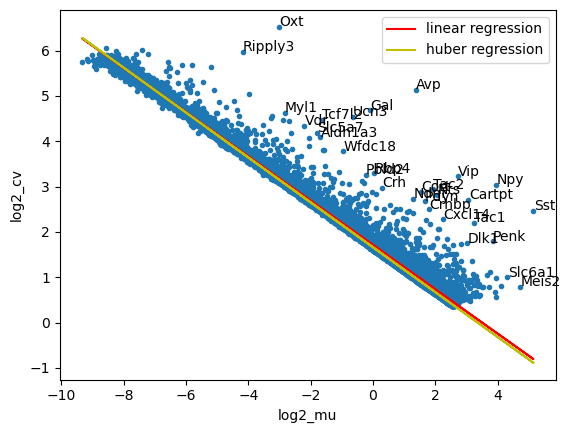

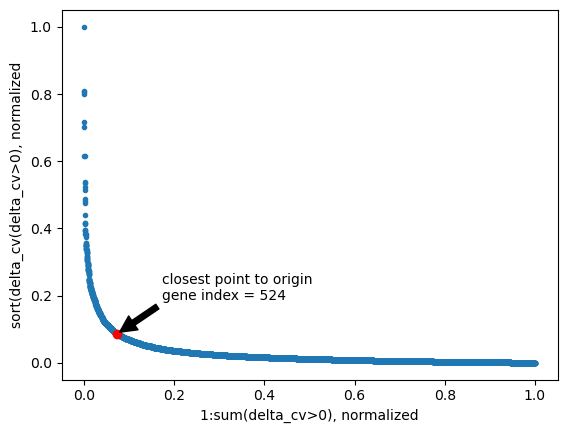

column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


In [49]:
%matplotlib inline
amy_df_gaba_glut = amy_df_gaba_glut.astype('int')
#process using standard workflow/functions from dimorph_processing.py
amy_df_gaba_glut_bool = amy_df_gaba_glut.mask(amy_df_gaba_glut>0, other = 1)
status_df = dp.intialize_status_df()
amy_df_gaba_glut_ce, amy_df_gaba_glut_bool, amy_metadata_df_subset_gaba_glut, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = amy_metadata_df_subset_gaba_glut,
                                                      df_bool = amy_df_gaba_glut_bool,
                                                      df = amy_df_gaba_glut,
                                                      status_df = status_df)
amy_df_gaba_glut_ce_ge, amy_df_gaba_glut_bool, amy_metadata_df_subset_gaba_glut, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=amy_df_gaba_glut_bool,
                                                 df = amy_df_gaba_glut_ce,
                                                 meta_data_df = amy_metadata_df_subset_gaba_glut,
                                                 status_df = status_df)

amy_cv_df = dp.analyze_cv(df = amy_df_gaba_glut_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
amy_gene_index, amy_df_gaba_glut_ce_ge_cv, status_df = dp.get_top_cv_genes(df = amy_df_gaba_glut_ce_ge, cv_df=amy_cv_df, plot_flag=1, status_df=status_df)
amy_cv_ls_arr,status_df = dp.log_and_standerdize_df(amy_df_gaba_glut_ce_ge_cv,status_df)
amy_df_gaba_glut_ce_ge_cv_ls = pd.DataFrame(data=amy_cv_ls_arr.T, index=amy_df_gaba_glut_ce_ge_cv.index, columns=amy_df_gaba_glut_ce_ge_cv.columns)


In [50]:
amy_df_gaba_glut_ce_ge_cv_ls.shape

(524, 30184)

In [52]:
amy_metadata_df_subset_gaba_glut.shape

(4, 30184)

Total cells reduced from 24308 to 24308
(27933, 24308)
Total genes reduced from 27933 to 15732
(15732, 24308)


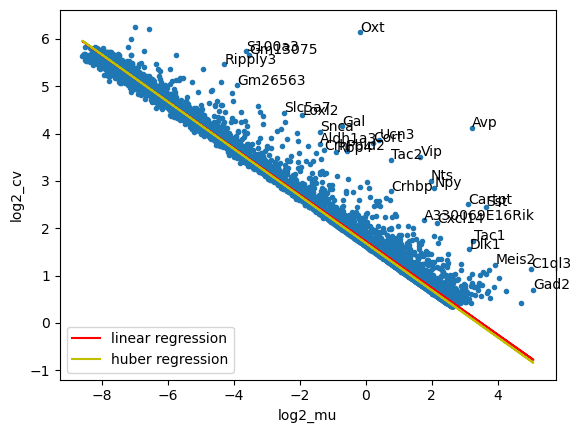

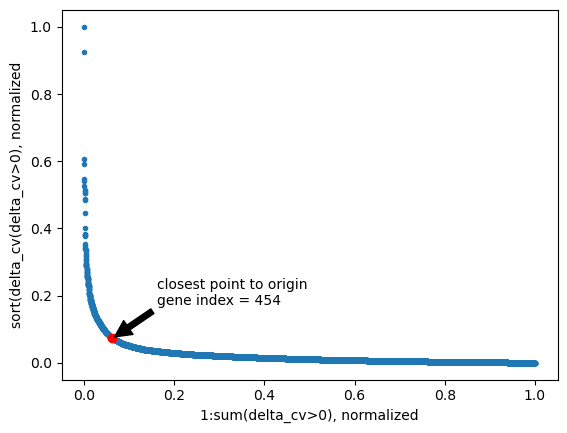

(454, 24308)
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


In [225]:
sd_df_gaba_glut = sd_df_gaba_glut.astype('int')
#process using standard workflow/functions from dimorph_processing.py
sd_df_gaba_glut_bool = sd_df_gaba_glut.mask(sd_df_gaba_glut>0, other = 1)
status_df = dp.intialize_status_df()
sd_df_gaba_glut_ce, df_bool, sd_metadata_df_subset, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = sd_metadata_df_subset,
                                                      df_bool = sd_df_gaba_glut_bool,
                                                      df = sd_df_gaba_glut,
                                                      status_df = status_df)
print (sd_df_gaba_glut_ce.shape)
sd_df_gaba_glut_ce_ge, sd_df_gaba_glut_bool, sd_metadata_df_subset, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=sd_df_gaba_glut_bool,
                                                 df = sd_df_gaba_glut_ce,
                                                 meta_data_df = sd_metadata_df_subset,
                                                 status_df = status_df)
print (sd_df_gaba_glut_ce_ge.shape)
sd_cv_df = dp.analyze_cv(df = sd_df_gaba_glut_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
sd_gene_index, sd_df_gaba_glut_ce_ge_cv, status_df = dp.get_top_cv_genes(df = sd_df_gaba_glut_ce_ge, cv_df=sd_cv_df, plot_flag=1, status_df=status_df)
print (sd_df_gaba_glut_ce_ge_cv.shape)
sd_cv_ls_arr,status_df = dp.log_and_standerdize_df(sd_df_gaba_glut_ce_ge_cv,status_df)
sd_df_gaba_glut_ce_ge_cv_ls = pd.DataFrame(data=sd_cv_ls_arr.T, index=sd_df_gaba_glut_ce_ge_cv.index, columns=sd_df_gaba_glut_ce_ge_cv.columns)

In [226]:
sd_df_gaba_glut_ce_ge_cv_ls.shape

(454, 24308)

In [227]:
sd_metadata_df_subset.shape

(4, 24308)

In [ ]:
#store intermediate results

In [348]:
amy_df_ce_ge_cv.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_df_ce_ge_cv.feather')
amy_df_ce_ge_cv_ls.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_df_ce_ge_cv_ls.feather')
amy_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset_fs.json')

sd_df_ce_ge_cv.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_df_ce_ge_cv.feather')
sd_df_ce_ge_cv_ls.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_df_ce_ge_cv_ls.feather')
sd_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_metadata_df_subset_fs.json')


In [153]:
#recombine using intersected genes

In [228]:
intersected_gene_ind_cv = amy_df_gaba_glut_ce_ge_cv_ls.index.intersection(sd_df_gaba_glut_ce_ge_cv_ls.index)

In [229]:
intersected_gene_ind_cv

Index(['Avp', 'Oxt', 'Sst', 'Npy', 'Gal', 'Vip', 'Cartpt', 'Ucn3', 'Ripply3',
       'Tac2',
       ...
       'Arhgdib', 'Pdlim1', 'Clic4', 'Fezf2', 'Cntn5', 'Endou', 'Pou3f3',
       'Cdkn1c', 'Pcdh20', 'Tmem91'],
      dtype='object', length=331)

In [230]:
sd_cv_ls_arr.shape

(24308, 454)

In [161]:
sd_cv_ls_arr.T

array([[-0.09801688, -0.09801688, -0.09801688, ..., -0.09801688,
        -0.09801688, -0.09801688],
       [-0.1765032 , -0.1765032 , -0.1765032 , ..., -0.1765032 ,
        -0.1765032 , -0.1765032 ],
       [ 0.60671206, -0.41379637,  1.20367123, ..., 10.34742874,
        10.29934994, 10.39207619],
       ...,
       [-0.29287611, -0.29287611, -0.29287611, ..., -0.29287611,
        -0.29287611, -0.29287611],
       [-0.11846363, -0.11846363, -0.11846363, ..., -0.11846363,
        -0.11846363, -0.11846363],
       [-0.26256462, -0.26256462, -0.26256462, ..., -0.26256462,
        -0.26256462, -0.26256462]])

In [160]:
sd_df_ce_ge_cv_ls.values

array([[-0.09801688, -0.09801688, -0.09801688, ..., -0.09801688,
        -0.09801688, -0.09801688],
       [-0.1765032 , -0.1765032 , -0.1765032 , ..., -0.1765032 ,
        -0.1765032 , -0.1765032 ],
       [ 0.60671206, -0.41379637,  1.20367123, ..., 10.34742874,
        10.29934994, 10.39207619],
       ...,
       [-0.29287611, -0.29287611, -0.29287611, ..., -0.29287611,
        -0.29287611, -0.29287611],
       [-0.11846363, -0.11846363, -0.11846363, ..., -0.11846363,
        -0.11846363, -0.11846363],
       [-0.26256462, -0.26256462, -0.26256462, ..., -0.26256462,
        -0.26256462, -0.26256462]])

In [231]:
amy_df_ce_ge_cv_ls = amy_df_gaba_glut_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)
sd_df_ce_ge_cv_ls = sd_df_gaba_glut_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)

In [232]:
amy_df_ce_ge_cv_ls.shape

(331, 30184)

In [233]:
sd_df_ce_ge_cv_ls.shape

(331, 24308)

In [ ]:
#concat values to single array


In [234]:
amy_sd_df_ce_ge_cv_ls = pd.concat([amy_df_ce_ge_cv_ls,sd_df_ce_ge_cv_ls], axis = 1)

In [235]:
amy_sd_df_ce_ge_cv_ls.shape

(331, 54492)

In [356]:
amy_sd_metadata.shape

(4, 82338)

In [ ]:
#concat metadata to single df

In [236]:
amy_metadata_df_subset_gaba_glut

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,ACTATTCTCAAGAGTA-1_76-2,AGTAACCGTAAGTTGA-1_76-2,ATTTACCGTTTCCAAG-1_76-2,GAAGTAAGTTCACCGG-1_76-2,GGTTAACCACAGAAGC-1_76-2,GTGATGTAGGTTTACC-1_76-2,TCATTCAGTGTTAAAG-1_76-2,TCCACGTCACTTCATT-1_76-2,TTACCGCGTCACAATC-1_76-2,TTTATGCCAGTATTCG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [237]:
sd_metadata_df_subset

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [238]:
amy_sd_metadata_df_ce_ge_cv_ls = pd.concat([amy_metadata_df_subset_gaba_glut,sd_metadata_df_subset],axis=1)
amy_sd_metadata_df_ce_ge_cv_ls.shape

(4, 54492)

In [239]:
np.all(amy_sd_metadata_df_ce_ge_cv_ls.columns == amy_sd_df_ce_ge_cv_ls.columns)

True

In [240]:
log_std_arr = amy_sd_df_ce_ge_cv_ls.values.T

3) PCA Dimensionality Reduction, using find knee to get cutoff 

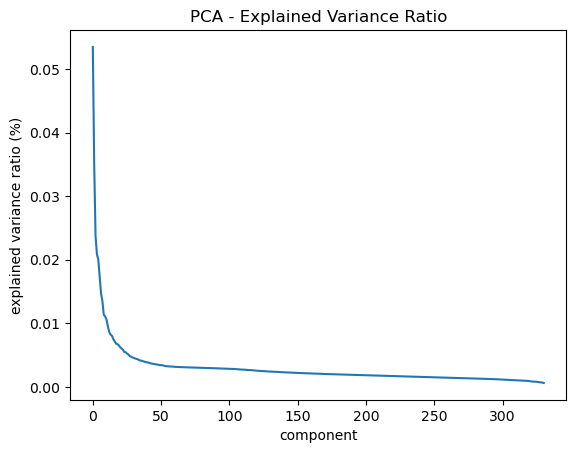

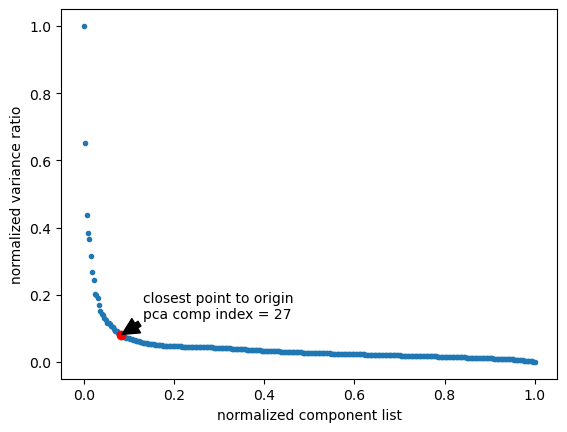

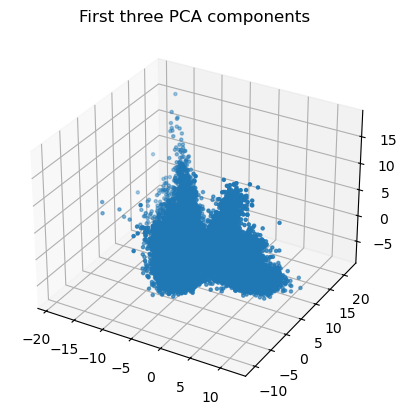

In [241]:
pca_index, arr_pca, status_df = dp.analyze_pca(arr = log_std_arr, #log_std_arr
                                               n_components=log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

In [242]:
arr_pca.shape

(54492, 27)

In [243]:
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/v3_updated_sd_celltypes/arr_pca.npy',arr_pca)

In [244]:
amy_sd_metadata_df_ce_ge_cv_ls.index

Index(['cell_class', 'markers', 'full_name', 'dataset'], dtype='object')

In [245]:
meta_data_df_pca = amy_sd_metadata_df_ce_ge_cv_ls.T.copy()

In [246]:
meta_data_df_pca.shape

(54492, 4)

In [247]:
meta_data_df_pca

,cell_class,markers,full_name,dataset
TGGGAAGGTCGAGTGA-1_08-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
AAAGTCCAGTACCATC-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
ATATCCTCAAAGGATT-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
CGAGTTACATCCTTCG-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
GGACGTCCACCCATAA-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
...,...,...,...,...
TCCCATGGTTTACGAC-1_10X52_1,Vglut2,Otp-Avp,Vglut2-17-Otp-Avp,sd
TGGATGTCAATTTCTC-1_10X35_2,Vglut2,Otp-Avp,Vglut2-17-Otp-Avp,sd
TGGTACACATGTTACG-1_10X51_1,Vglut2,Otp-Avp,Vglut2-17-Otp-Avp,sd
CTTCCGAAGGTGCCAA-1_10X36_1,Vglut2,Otp-Avp,Vglut2-17-Otp-Avp,sd


4) Harmony Integration, with vars_use = dataset, iterate until convergence

In [248]:
vars_use = ['dataset']
ho = hm.run_harmony(arr_pca,meta_data_df_pca,vars_use,max_iter_harmony=20)

2024-12-15 12:48:49,890 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-15 12:48:53,410 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-15 12:48:53,717 - harmonypy - INFO - Iteration 1 of 20
2024-12-15 12:49:07,539 - harmonypy - INFO - Iteration 2 of 20
2024-12-15 12:49:21,333 - harmonypy - INFO - Iteration 3 of 20
2024-12-15 12:49:35,019 - harmonypy - INFO - Iteration 4 of 20
2024-12-15 12:49:48,253 - harmonypy - INFO - Iteration 5 of 20
2024-12-15 12:49:58,191 - harmonypy - INFO - Iteration 6 of 20
2024-12-15 12:50:08,598 - harmonypy - INFO - Iteration 7 of 20
2024-12-15 12:50:22,389 - harmonypy - INFO - Iteration 8 of 20
2024-12-15 12:50:28,232 - harmonypy - INFO - Iteration 9 of 20
2024-12-15 12:50:34,029 - harmonypy - INFO - Iteration 10 of 20
2024-12-15 12:50:38,578 - harmonypy - INFO - Converged after 10 iterations


5) Run Tsne 

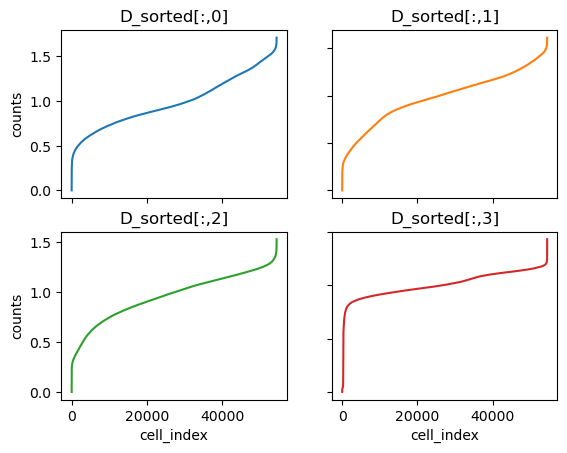

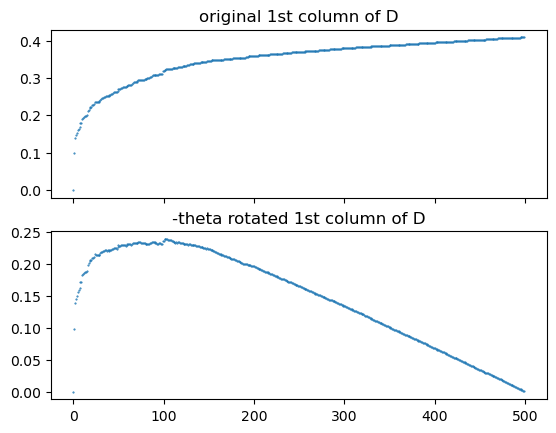

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 51.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


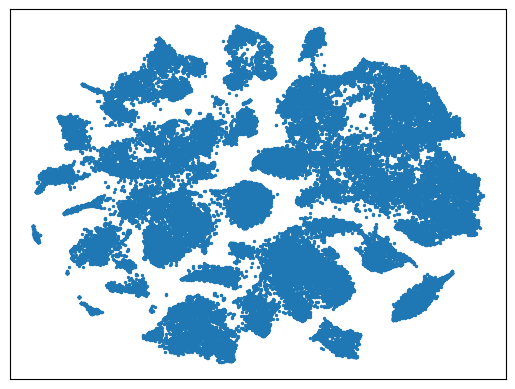

In [249]:
amy_sd_hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = amy_sd_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

amy_sd_arr_tsne,status_df = dp.do_tsne(arr = amy_sd_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

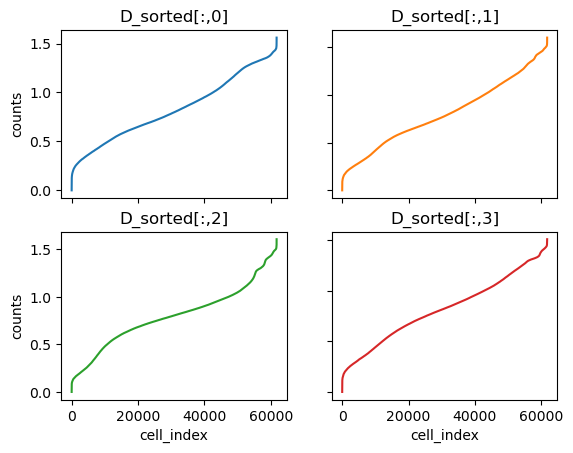

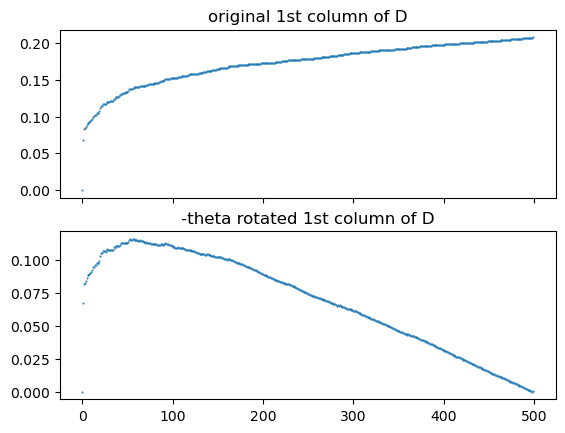

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 59.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


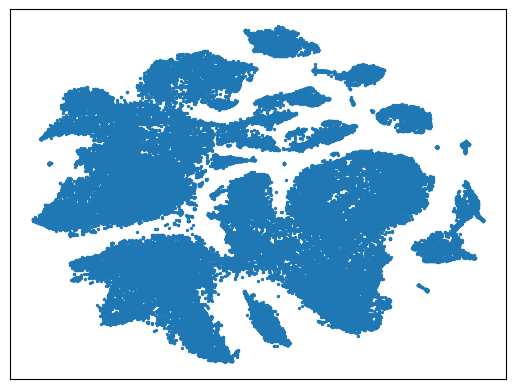

In [369]:
amy_sd_hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = amy_sd_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

amy_sd_arr_tsne,status_df = dp.do_tsne(arr = amy_sd_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

In [370]:
meta_data_df_pca.shape

(61739, 4)

In [371]:
amy_sd_hm_arr.shape

(61739, 20)

In [372]:
amy_sd_arr_tsne.shape

(61739, 2)

In [250]:
out_folder = '/bigdata/isaac/sd_amy_tsne_harmony_comp/v3_updated_sd_celltypes/'

In [251]:
#save intermediate results
np.save(out_folder + 'amy_sd_arr_tsne.npy',amy_sd_arr_tsne)
meta_data_df_pca.to_json(out_folder +'meta_data_df_pca.json')

In [252]:
amy_sd_df_ce_ge_cv_ls.to_feather(out_folder + 'amy_sd_df_ce_ge_cv_ls.feather')
amy_sd_metadata_df_ce_ge_cv_ls.to_json(out_folder + 'amy_sd_metadata_df_ce_ge_cv_ls.json')

color each cell by dataset

In [ ]:
out_folder = '/bigdata/isaac/sd_amy_tsne_harmony_comp/v3_updated_sd_celltypes/'

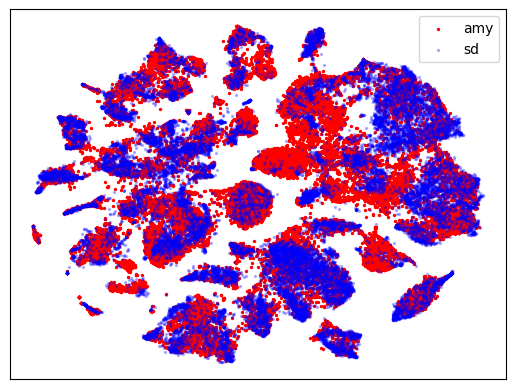

In [253]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#ax.scatter(x,y,s=2)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=1)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=0.25)


ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig(out_folder + 'tsne_overlay_sd_on_amy.pdf')
plt.show()

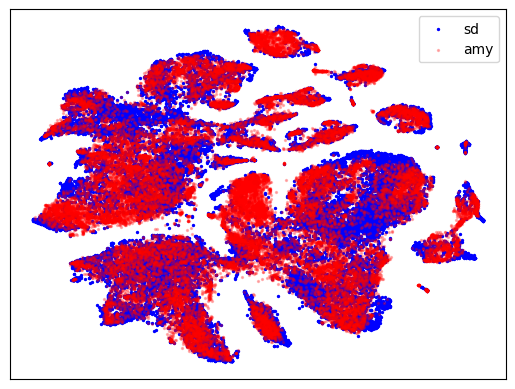

In [381]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#ax.scatter(x,y,s=2)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=1)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)

ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/tsne_overlay_amy_on_sd.pdf')
plt.show()

In [382]:
amy_sd_metadata_df_ce_ge_cv_ls

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


compare tsne overlay of non harmonized verison

In [383]:
amy_sd_hm_arr.shape

(61739, 20)

In [384]:
arr_pca.shape

(61739, 20)

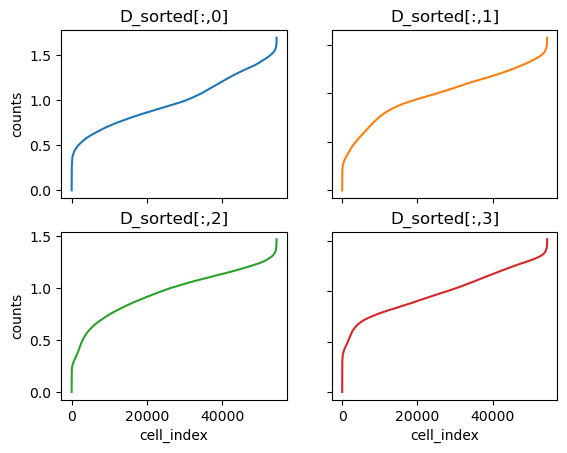

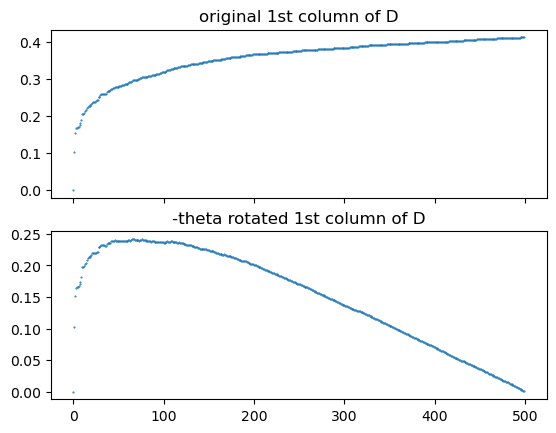

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 52.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


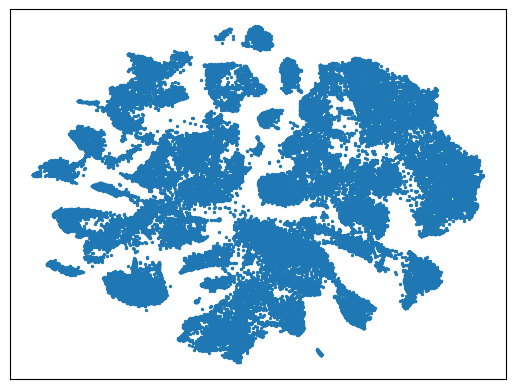

In [254]:
perplexity,status_df = dp.get_perplexity(pca_arr = arr_pca, cutoff=500, plot_flag=1, status_df = status_df)

amy_sd_arr_tsne_pca_input,status_df = dp.do_tsne(arr = arr_pca, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

In [255]:
np.save(out_folder + 'amy_sd_arr_tsne_pca_input.npy',amy_sd_arr_tsne_pca_input)

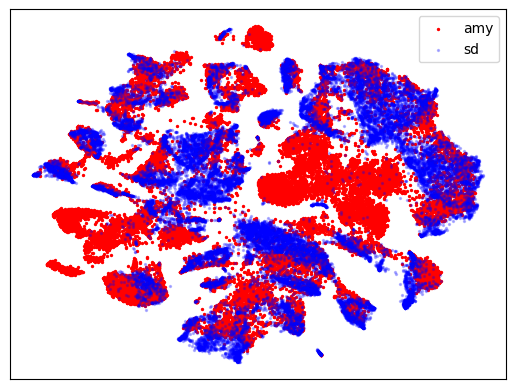

In [256]:
%matplotlib inline
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne_pca_input[:,0]
y = amy_sd_arr_tsne_pca_input[:,1]
#ax.scatter(x,y,s=2)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=1)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=0.25)


ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig(out_folder + 'tsne_overlay_sd_on_amy_no_harmony.pdf')
plt.show()

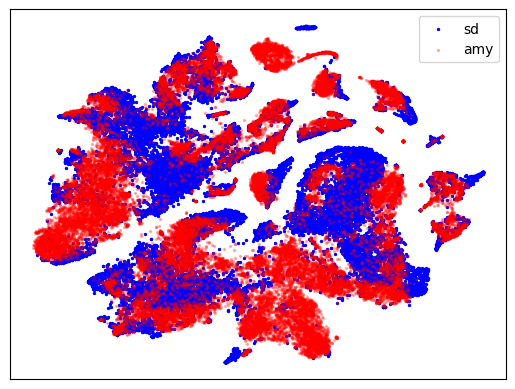

In [388]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne_pca_input[:,0]
y = amy_sd_arr_tsne_pca_input[:,1]
#ax.scatter(x,y,s=2)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=1)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)

ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/tsne_overlay_amy_on_sd_no_harmony.pdf')
plt.show()

color each cell in the SD dataset by the match cell type in the FC dataset

In [389]:
updated_amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))
updated_amy_classes

['GABA', 'Nonneuronal', 'VGLUT1', 'VGLUT2']

In [390]:
amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))
amy_classes

['GABA', 'Nonneuronal', 'VGLUT1', 'VGLUT2']

In [257]:
amy_metadata_df_subset = amy_metadata_df_subset_gaba_glut.copy()

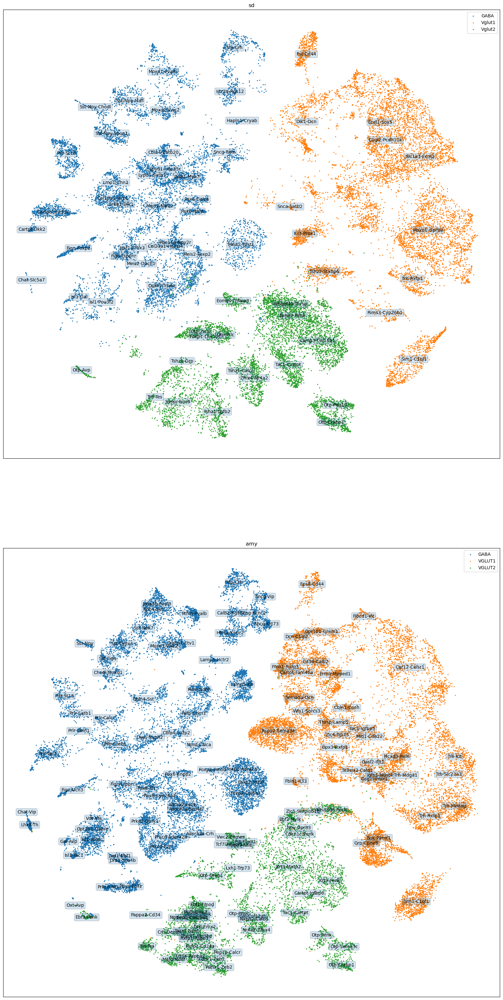

In [258]:
#get cell type labels for each dataset 
sd_labels = list(np.unique(sd_metadata_df_subset.loc['markers']))
amy_labels = list(np.unique(amy_metadata_df_subset.loc['markers']))

#get class labels for each dataset
sd_classes = list(np.unique(sd_metadata_df_subset.loc['cell_class']))
updated_amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))

###############################################
fig,ax = plt.subplots(2,1, figsize = (20,40))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
##############################################
#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
#ax[0].scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=.25)
for sd_cls in sd_classes:
    ax[0].scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls))

#combine into 2D array
arr_xy_sd = np.vstack([x_sd,y_sd])
for sd_ct in sd_labels:
    #print (arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct])
    cluster_median = np.median(arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct],axis = 0)
    ax[0].annotate(text = sd_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title('sd')
ax[0].legend()
###############################################
#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
#ax[1].scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)
for amy_cls in updated_amy_classes:
    ax[1].scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls))

#combine into 2D array
arr_xy_amy = np.vstack([x_amy,y_amy])
for amy_ct in amy_labels:
    #print (arr_xy_amy.T[amy_metadata_df_subset.T['markers']==amy_ct])
    cluster_median = np.median(arr_xy_amy.T[amy_metadata_df_subset.T['markers']==amy_ct],axis = 0)
    ax[1].annotate(text = amy_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].legend()
ax[1].set_title('amy')

plt.savefig(out_folder + 'ctype_cclass_sd_amy_comparison.pdf')
plt.show()

In [352]:
#individual versions

In [259]:
amy_metadata_df_subset.loc['full_name']

TGGGAAGGTCGAGTGA-1_08-1       GABA-1-Foxp2_Fmod
AAAGTCCAGTACCATC-1_10-1       GABA-1-Foxp2_Fmod
ATATCCTCAAAGGATT-1_10-1       GABA-1-Foxp2_Fmod
CGAGTTACATCCTTCG-1_10-1       GABA-1-Foxp2_Fmod
GGACGTCCACCCATAA-1_10-1       GABA-1-Foxp2_Fmod
                                   ...         
GTGATGTAGGTTTACC-1_76-2    VGLUT2-42-Otp_Sema3c
TCATTCAGTGTTAAAG-1_76-2    VGLUT2-42-Otp_Sema3c
TCCACGTCACTTCATT-1_76-2    VGLUT2-42-Otp_Sema3c
TTACCGCGTCACAATC-1_76-2    VGLUT2-42-Otp_Sema3c
TTTATGCCAGTATTCG-1_76-2    VGLUT2-42-Otp_Sema3c
Name: full_name, Length: 30184, dtype: object

In [260]:
amy_labels = list(np.unique(amy_metadata_df_subset.loc['full_name']))
amy_labels

['GABA-1-Foxp2_Fmod',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-2-Foxp2_Adra2a',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-3-Foxp2_Col6a1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-4-Foxp2_Htr1f',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-46-Lamp5-Kit',
 'GABA-47-Reln-Ndnf',
 'GABA-48-Reln-Crim1',
 'GABA-49-Npnt-Calca',

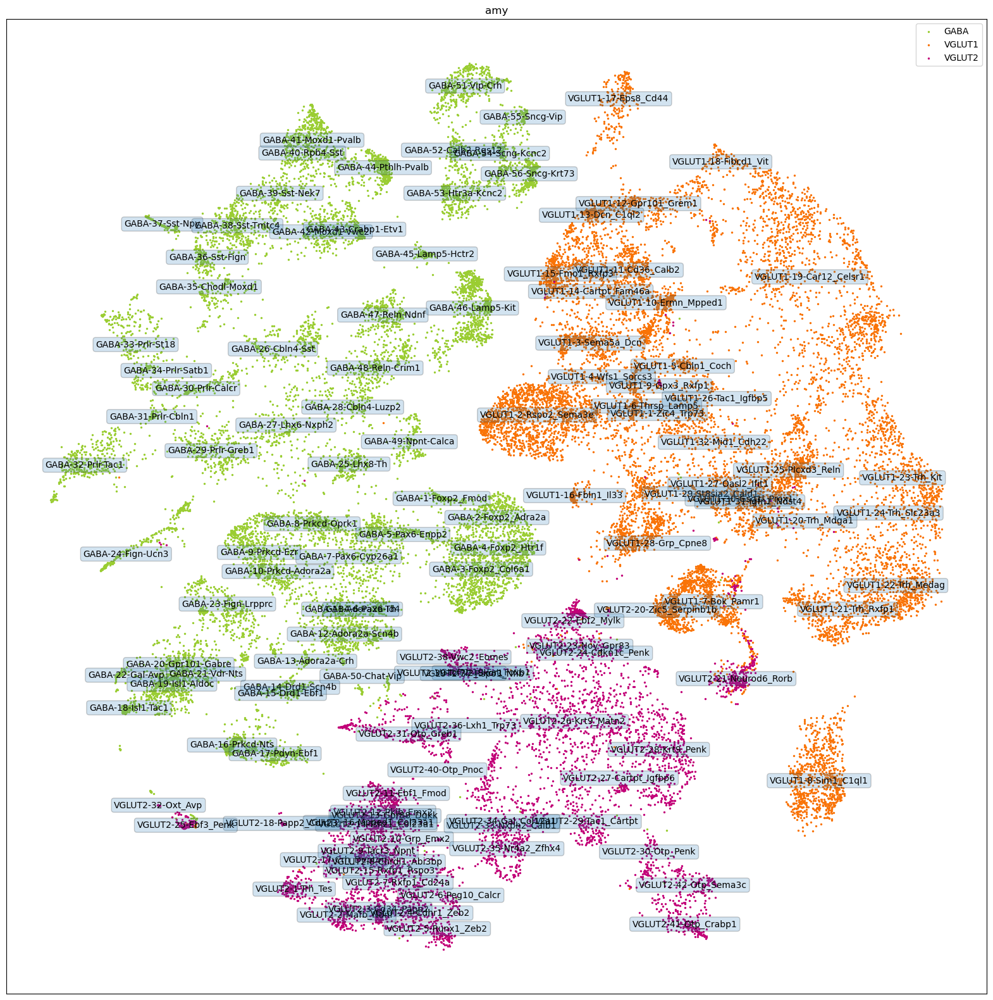

In [89]:
%matplotlib inline
#get cell type labels
amy_labels = list(np.unique(amy_metadata_df_subset.loc['full_name']))

#get class labels
updated_amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))

fig,ax = plt.subplots(figsize = (20,20))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
#ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)
for amy_cls in updated_amy_classes:
    #ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls))
    if amy_cls == 'GABA':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#9ACD32')
    if amy_cls == 'VGLUT1':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#F97306')
    if amy_cls == 'VGLUT2':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#C20078')
    if amy_cls == 'Nonneuronal':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#0000FF')

    
#combine into 2D array
arr_xy_amy = np.vstack([x_amy,y_amy])
for amy_ct in amy_labels:
    #print (arr_xy_amy.T[amy_metadata_df_subset.T['markers']==amy_ct])
    cluster_median = np.median(arr_xy_amy.T[amy_metadata_df_subset.T['full_name']==amy_ct],axis = 0)
    ax.annotate(text = amy_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax.set_xticks([])
ax.set_yticks([])
ax.legend()
ax.set_title('amy')

plt.savefig(out_folder + 'ctype_cclass_amy_full_names.pdf')
plt.show()

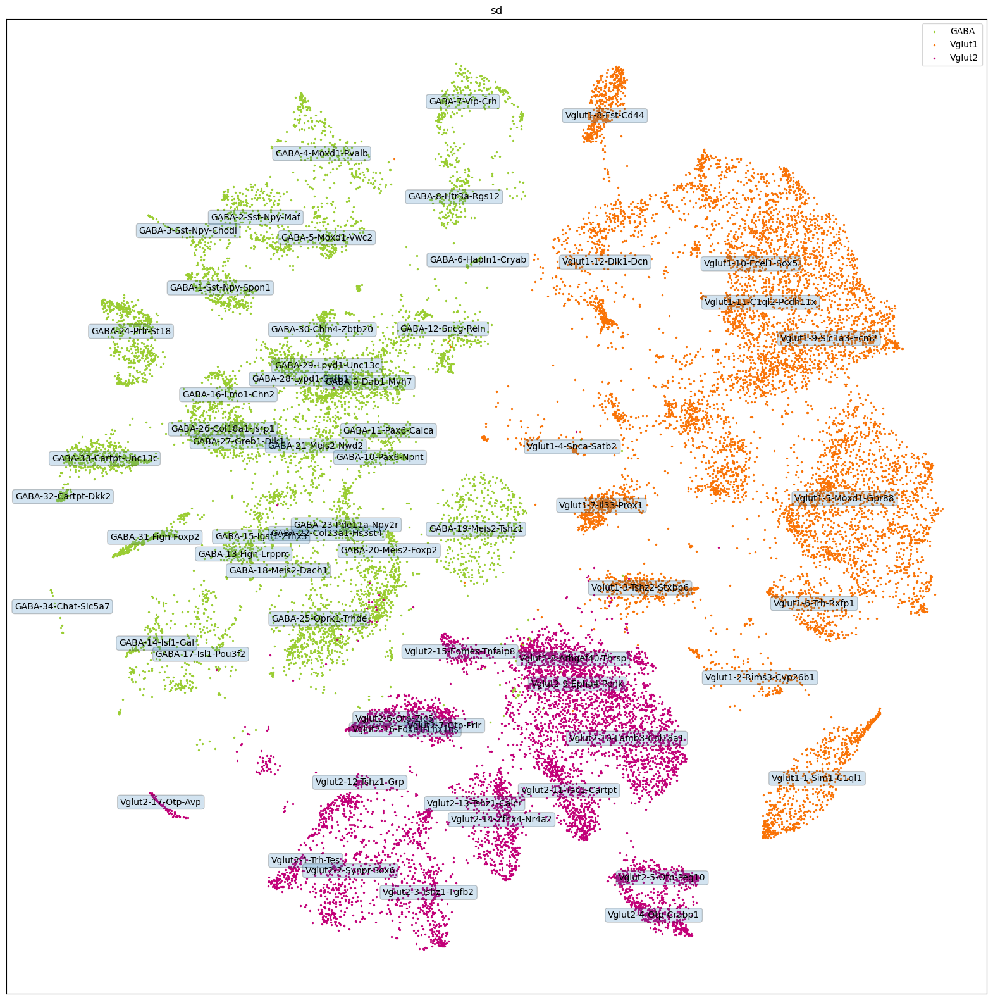

In [261]:
#get cell type labels
sd_labels = list(np.unique(sd_metadata_df_subset.loc['full_name']))

#get class labels
sd_classes = list(np.unique(sd_metadata_df_subset.loc['cell_class']))
#print (sd_classes)
fig,ax = plt.subplots(figsize = (20,20))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
#ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=.25)
for sd_cls in sd_classes:
    #ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls))
    if sd_cls == 'GABA':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#9ACD32')
    if sd_cls == 'Vglut1':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#F97306')
    if sd_cls == 'Vglut2':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#C20078')
    if sd_cls == 'Nonneuronal':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#0000FF')

#combine into 2D array
arr_xy_sd = np.vstack([x_sd,y_sd])
for sd_ct in sd_labels:
    #print (arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct])
    cluster_median = np.median(arr_xy_sd.T[sd_metadata_df_subset.T['full_name']==sd_ct],axis = 0)
    ax.annotate(text = sd_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('sd')
ax.legend()

plt.savefig(out_folder + 'ctype_cclass_sd_full_names.pdf')
plt.show()

## Majority vote to get cell types of SD using Amy cell types

In [91]:
arr_xy_amy

array([[ -5.3908453 ,  -5.620687  ,  -5.5763927 , ...,  11.888598  ,
          8.928012  ,  12.396046  ],
       [  0.8738084 ,   0.89418834,   0.47429782, ..., -28.623848  ,
        -25.650993  , -26.405224  ]], dtype=float32)

In [92]:
arr_xy_sd

array([[-18.17731 , -18.088228, -18.164827, ..., -22.976864, -23.740902,
        -22.804508],
       [ 15.100441,  14.705311,  15.076318, ..., -21.251072, -20.78612 ,
        -21.468023]], dtype=float32)

In [93]:
sd_metadata_df_subset

,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,AGGAGGTTCATTTGGG-1_10X35_1,CGCATGGAGATGAACT-1_10X52_1,AGTAGTCGTATCTTCT-1_10X51_4,GTTGTCCGTTCTCCAC-1_10X51_4,AGATGCTAGATTACCC-1_10X51_2,TCGGATAGTCTCCTGT-1_10X51_3,GTTCCGTCACGATAGG-1_10X36_2,CGGACACGTATACCCA-1_10X52_4,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [262]:
#prepare label transferred version of sd_metadata_df
sd_metadata_df_subset_w_amc = sd_metadata_df_subset.copy()
amy_markers = pd.DataFrame(index = ['amy_markers'], columns = sd_metadata_df_subset_w_amc.columns)
amy_class = pd.DataFrame(index = ['amy_class'], columns = sd_metadata_df_subset_w_amc.columns)
amy_full_name = pd.DataFrame(index = ['amy_full_name'], columns = sd_metadata_df_subset_w_amc.columns)

sd_metadata_df_subset_w_amc = pd.concat([sd_metadata_df_subset_w_amc,amy_class])
sd_metadata_df_subset_w_amc = pd.concat([sd_metadata_df_subset_w_amc,amy_markers])
sd_metadata_df_subset_w_amc = pd.concat([sd_metadata_df_subset_w_amc,amy_full_name])


sd_metadata_df_subset_w_amc

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_markers,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [858]:
sd_metadata_df_subset_w_amc_tmp = sd_metadata_df_subset.copy()
amy_markers = pd.DataFrame(index = ['amy_markers'], columns = sd_metadata_df_subset_w_amc_tmp.columns)
amy_class = pd.DataFrame(index = ['amy_class'], columns = sd_metadata_df_subset_w_amc_tmp.columns)

In [95]:
def cluster_transfer_majority_vote(arr_xy_sd,arr_xy_amy,distance_threshold,sd_metadata_df_subset,amy_metadata_df_subset):
    '''takes 2, 2D tsne x/y arrays, iterates through each point of arr1, finds all neighbors within distance_threshold. If more than
    10 neighbors, uses first 10. For each pts with at least 5 neighbors, uses index to count representation of cell types in metadata_df, 
    and performs majority voting to assign cell type and cell class.'''
    
    # Convert to shape (n_points, 2) for easier iteration
    arr_xy_sd_points = np.column_stack((arr_xy_sd[0], arr_xy_sd[1]))
    arr_xy_amy_points = np.column_stack((arr_xy_amy[0], arr_xy_amy[1]))
    
    # Dictionary to store closest points for each point in arr_xy_sd
    closest_points = {}
    
    # Iterate through each point in arr_xy_sd
    for idx, point1 in enumerate(arr_xy_sd_points):
        # Calculate distances to all points in arr_xy_amy
        distances = np.sqrt((arr_xy_amy_points[:, 0] - point1[0])**2 + (arr_xy_amy_points[:, 1] - point1[1])**2)
        
        # Find indices where distances are within the threshold
        within_threshold_indices = np.where(distances <= distance_threshold)[0]
        
        # If more than 10 points meet the threshold, keep only the first 10
        if len(within_threshold_indices) > 10:
            within_threshold_indices = within_threshold_indices[:10]
        
        # Store the points within threshold distance
        closest_points[idx] = arr_xy_amy_points[within_threshold_indices]
    
        #only consider points with at least 5 neighbors
        if len (within_threshold_indices)>=5:
            #print (dict(Counter(list(amy_metadata_df_subset_tmp.iloc[1,within_threshold_indices]))))
            #create dict counting instances of each unique cell type
            amy_marker_count_dict = dict(Counter(list(amy_metadata_df_subset.iloc[1,within_threshold_indices])))
            amy_marker_count_dict_sorted = dict(sorted(amy_marker_count_dict.items(), key=lambda item: item[1], reverse=True))
            
            #create dict counting intances of each unique class, use _c class corrected version
            #amy_class_count_dict = dict(Counter(list(amy_metadata_df_subset.iloc[0,within_threshold_indices])))
            #amy_class_count_dict_sorted = dict(sorted(amy_class_count_dict.items(), key=lambda item: item[1], reverse=True))
            
            #print (idx)
            #print (amy_marker_count_dict_sorted)
            #print (amy_class_count_dict_sorted)
        #print (list(amy_marker_count_dict_sorted.values())[0])
        
            #simplest case, all points from same amy cell type that's not blank, mark as amy cell type
            if len(list(amy_marker_count_dict_sorted.values()))==1 and len(list(amy_marker_count_dict_sorted.keys())[0])>0: 
                #print ('here')
                #print (len(list(amy_marker_count_dict_sorted.keys())[0]))
                #print (list(amy_marker_count_dict_sorted.keys())[0])
                
                sd_metadata_df_subset.iloc[5,idx] = list(amy_marker_count_dict_sorted.keys())[0]
                
                #sd_metadata_df_subset.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                    
            #in case of more than one cell type,
            elif len(list(amy_marker_count_dict_sorted.values()))>1:
                # with equal represenation in top 2 cell types, mark as 'no-majority'
                if list(amy_marker_count_dict_sorted.values())[0] == list(amy_marker_count_dict_sorted.values())[1]:
                    #print ('no majority')
                    sd_metadata_df_subset.iloc[5,idx] = 'no majority ct'
                    sd_metadata_df_subset.iloc[4,idx] = 'no majority ct'
                
                #case with multiple cell types but first is blank, just use original sd type (NN subclass)
                #elif len(list(amy_marker_count_dict_sorted.keys())[0])==0:
                    #sd_metadata_df_subset.iloc[5,idx] = sd_metadata_df_subset.iloc[1,idx]
                    
                    #sd_metadata_df_subset.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                #use majority voting, i.e. grab first key with highest representation
                else:
                    sd_metadata_df_subset.iloc[5,idx] = list(amy_marker_count_dict_sorted.keys())[0]
                    
                    #sd_metadata_df_subset.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                    
            #amy nononerual missing cell types (show as blank), so just use the original sd cell type (NN)
            #elif len(list(amy_marker_count_dict_sorted.keys())[0])==0: 
                #print ('nn here')
                #sd_metadata_df_subset.iloc[3,idx] = sd_metadata_df_subset.iloc[1,idx]
                #sd_metadata_df_subset.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
        
        #in case where no neighbors found, mark as 'no neighbors'
        else:
            #print ('here')
            sd_metadata_df_subset.iloc[5,idx] = 'no neighbors'
            sd_metadata_df_subset.iloc[4,idx] = 'no neighbors'
        
    return sd_metadata_df_subset
    

In [96]:
distance_threshold = 1

In [263]:
sd_metadata_df_subset_w_amc = cluster_transfer_majority_vote(arr_xy_sd,arr_xy_amy,distance_threshold,sd_metadata_df_subset_w_amc,amy_metadata_df_subset)
sd_metadata_df_subset_w_amc

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_markers,Prlr-St18,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,...,Pax6-Th,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Pax6-Th,Ebf3-Penk,Otp-Greb1,Pax6-Th
amy_full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [99]:
_, idx = np.unique(amy_metadata_df_subset.loc['markers'], return_index=True)
am = np.array(amy_metadata_df_subset.loc['markers'][np.sort(idx)])
list(am)

/tmp/ipykernel_3116087/2492650180.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  am = np.array(amy_metadata_df_subset.loc['markers'][np.sort(idx)])


['Foxp2-Fmod',
 'Foxp2-Adra2a',
 'Foxp2-Col6a1',
 'Foxp2-Htr1f',
 'Pax6-Enpp2',
 'Pax6-Th',
 'Pax6-Cyp26a1',
 'Prkcd-Oprk1',
 'Prkcd-Ezr',
 'Prkcd-Adora2a',
 'Adora2a-Id4',
 'Adora2a-Scn4b',
 'Adora2a-Crh',
 'Drd1-Scn4b',
 'Drd1-Ebf1',
 'Prkcd-Nts',
 'Pdyn-Ebf1',
 'Isl1-Tac1',
 'Isl1-Aldoc',
 'Gpr101-Gabre',
 'Vdr-Nts',
 'Gal-Avp',
 'Fign-Lrpprc',
 'Fign-Ucn3',
 'Lhx8-Th',
 'Cbln4-Sst',
 'Lhx6-Nxph2',
 'Cbln4-Luzp2',
 'Prlr-Greb1',
 'Prlr-Calcr',
 'Prlr-Cbln1',
 'Prlr-Tac1',
 'Prlr-St18',
 'Prlr-Satb1',
 'Chodl-Moxd1',
 'Sst-Fign',
 'Sst-Npy',
 'Sst-Tmtc4',
 'Sst-Nek7',
 'Rpb4-Sst',
 'Moxd1-Pvalb',
 'Moxd1-Vwc2',
 'Crabp1-Etv1',
 'Pthlh-Pvalb',
 'Lamp5-Hctr2',
 'Lamp5-Kit',
 'Reln-Ndnf',
 'Reln-Crim1',
 'Npnt-Calca',
 'Chat-Vip',
 'Vip-Crh',
 'Calb2-Rgs12',
 'Htr3a-Kcnc2',
 'Scng-Kcnc2',
 'Sncg-Vip',
 'Sncg-Krt73',
 'Zic4-Trp73',
 'Rspo2-Sema3e',
 'Sema5a-Dcn',
 'Wfs1-Sorcs3',
 'Cbln1-Coch',
 'Thrsp-Lamp5',
 'Bok-Pamr1',
 'Sim1-C1ql1',
 'Gpx3-Rxfp1',
 'Ermn-Mpped1',
 'Cd36-Calb2',
 'Gp

In [100]:
len(am)

130

In [101]:
_, idx = np.unique(amy_metadata_df_subset.loc['full_name'], return_index=True)
afn = np.array(amy_metadata_df_subset.loc['full_name'][np.sort(idx)])
list(afn)

/tmp/ipykernel_3116087/708411596.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  afn = np.array(amy_metadata_df_subset.loc['full_name'][np.sort(idx)])


['GABA-1-Foxp2_Fmod',
 'GABA-2-Foxp2_Adra2a',
 'GABA-3-Foxp2_Col6a1',
 'GABA-4-Foxp2_Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [102]:
len(afn)

130

In [103]:
am_2_afn_dict = dict(zip(am,afn))

In [104]:
am_2_afn_dict

{'Foxp2-Fmod': 'GABA-1-Foxp2_Fmod',
 'Foxp2-Adra2a': 'GABA-2-Foxp2_Adra2a',
 'Foxp2-Col6a1': 'GABA-3-Foxp2_Col6a1',
 'Foxp2-Htr1f': 'GABA-4-Foxp2_Htr1f',
 'Pax6-Enpp2': 'GABA-5-Pax6-Enpp2',
 'Pax6-Th': 'GABA-6-Pax6-Th',
 'Pax6-Cyp26a1': 'GABA-7-Pax6-Cyp26a1',
 'Prkcd-Oprk1': 'GABA-8-Prkcd-Oprk1',
 'Prkcd-Ezr': 'GABA-9-Prkcd-Ezr',
 'Prkcd-Adora2a': 'GABA-10-Prkcd-Adora2a',
 'Adora2a-Id4': 'GABA-11-Adora2a-Id4',
 'Adora2a-Scn4b': 'GABA-12-Adora2a-Scn4b',
 'Adora2a-Crh': 'GABA-13-Adora2a-Crh',
 'Drd1-Scn4b': 'GABA-14-Drd1-Scn4b',
 'Drd1-Ebf1': 'GABA-15-Drd1-Ebf1',
 'Prkcd-Nts': 'GABA-16-Prkcd-Nts',
 'Pdyn-Ebf1': 'GABA-17-Pdyn-Ebf1',
 'Isl1-Tac1': 'GABA-18-Isl1-Tac1',
 'Isl1-Aldoc': 'GABA-19-Isl1-Aldoc',
 'Gpr101-Gabre': 'GABA-20-Gpr101-Gabre',
 'Vdr-Nts': 'GABA-21-Vdr-Nts',
 'Gal-Avp': 'GABA-22-Gal-Avp',
 'Fign-Lrpprc': 'GABA-23-Fign-Lrpprc',
 'Fign-Ucn3': 'GABA-24-Fign-Ucn3',
 'Lhx8-Th': 'GABA-25-Lhx8-Th',
 'Cbln4-Sst': 'GABA-26-Cbln4-Sst',
 'Lhx6-Nxph2': 'GABA-27-Lhx6-Nxph2',
 'Cbln4-Lu

In [105]:
#add case handeling for no majority or no neighbors (set full name to the same thing)
am_2_afn_dict['no majority ct'] = 'no majority ct'
am_2_afn_dict['no neighbors'] = 'no neighbors'

In [264]:
am_2_afn_dict

{'Foxp2-Fmod': 'GABA-1-Foxp2_Fmod',
 'Foxp2-Adra2a': 'GABA-2-Foxp2_Adra2a',
 'Foxp2-Col6a1': 'GABA-3-Foxp2_Col6a1',
 'Foxp2-Htr1f': 'GABA-4-Foxp2_Htr1f',
 'Pax6-Enpp2': 'GABA-5-Pax6-Enpp2',
 'Pax6-Th': 'GABA-6-Pax6-Th',
 'Pax6-Cyp26a1': 'GABA-7-Pax6-Cyp26a1',
 'Prkcd-Oprk1': 'GABA-8-Prkcd-Oprk1',
 'Prkcd-Ezr': 'GABA-9-Prkcd-Ezr',
 'Prkcd-Adora2a': 'GABA-10-Prkcd-Adora2a',
 'Adora2a-Id4': 'GABA-11-Adora2a-Id4',
 'Adora2a-Scn4b': 'GABA-12-Adora2a-Scn4b',
 'Adora2a-Crh': 'GABA-13-Adora2a-Crh',
 'Drd1-Scn4b': 'GABA-14-Drd1-Scn4b',
 'Drd1-Ebf1': 'GABA-15-Drd1-Ebf1',
 'Prkcd-Nts': 'GABA-16-Prkcd-Nts',
 'Pdyn-Ebf1': 'GABA-17-Pdyn-Ebf1',
 'Isl1-Tac1': 'GABA-18-Isl1-Tac1',
 'Isl1-Aldoc': 'GABA-19-Isl1-Aldoc',
 'Gpr101-Gabre': 'GABA-20-Gpr101-Gabre',
 'Vdr-Nts': 'GABA-21-Vdr-Nts',
 'Gal-Avp': 'GABA-22-Gal-Avp',
 'Fign-Lrpprc': 'GABA-23-Fign-Lrpprc',
 'Fign-Ucn3': 'GABA-24-Fign-Ucn3',
 'Lhx8-Th': 'GABA-25-Lhx8-Th',
 'Cbln4-Sst': 'GABA-26-Cbln4-Sst',
 'Lhx6-Nxph2': 'GABA-27-Lhx6-Nxph2',
 'Cbln4-Lu

In [107]:
_, idx = np.unique(amy_metadata_df_subset.loc['cell_class'], return_index=True)
ac = np.array(amy_metadata_df_subset.loc['cell_class'][np.sort(idx)])
list(ac)

/tmp/ipykernel_3116087/2531751343.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ac = np.array(amy_metadata_df_subset.loc['cell_class'][np.sort(idx)])


['GABA', 'VGLUT1', 'VGLUT2']

In [108]:
sd_metadata_df_subset_w_amc

,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,AGGAGGTTCATTTGGG-1_10X35_1,CGCATGGAGATGAACT-1_10X52_1,AGTAGTCGTATCTTCT-1_10X51_4,GTTGTCCGTTCTCCAC-1_10X51_4,AGATGCTAGATTACCC-1_10X51_2,TCGGATAGTCTCCTGT-1_10X51_3,GTTCCGTCACGATAGG-1_10X36_2,CGGACACGTATACCCA-1_10X52_4,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,NaN,NaN,NaN,NaN,no neighbors,no neighbors,NaN,NaN,NaN,no neighbors,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_markers,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,no neighbors,no neighbors,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,no neighbors,...,Pax6-Th,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Pax6-Th,Ebf3-Penk,Otp-Greb1,Pax6-Th
amy_full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [265]:
fn_transferred = []
for x in sd_metadata_df_subset_w_amc.loc['amy_markers']: 
    fn_transferred.append(am_2_afn_dict[x])
    #sd_metadata_df_subset_w_amc.loc['amy_full_name',:] = 
    

In [266]:
sd_metadata_df_subset_w_amc.shape

(7, 24308)

In [267]:
len(fn_transferred)

24308

In [268]:
sd_metadata_df_subset_w_amc.loc['amy_full_name'] = fn_transferred

In [269]:
#and finally, fill amy_class row using first part of amy_full_name
sd_metadata_df_subset_w_amc.loc['amy_class'] = [x.split('-')[0] for x in sd_metadata_df_subset_w_amc.loc['amy_full_name']]

In [270]:
sd_metadata_df_subset_w_amc

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,GABA,VGLUT2,VGLUT2,GABA
amy_markers,Prlr-St18,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,...,Pax6-Th,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Pax6-Th,Ebf3-Penk,Otp-Greb1,Pax6-Th
amy_full_name,GABA-33-Prlr-St18,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,...,GABA-6-Pax6-Th,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,GABA-6-Pax6-Th,VGLUT2-25-Ebf3_Penk,VGLUT2-31-Otp_Greb1,GABA-6-Pax6-Th


In [271]:
sd_metadata_df_subset_w_amc.loc[:,sd_metadata_df_subset_w_amc.loc['amy_class',:] == 'no majority ct']

,CGTTCTGTCGCGCCAA-1_10X52_4,TAAGCGTGTTAGTTCG-1_10X37_2,GCTGCAGGTCTTCTAT-1_10X52_2,TTACTGTCATGCGGTC-1_10X51_2,GCTTGGGCATCAGCAT-1_10X51_4,GTCACTCGTCGTCATA-1_10X52_2,CGGGTCAAGTACCATC-1_10X37_2,TGCTTGCGTGTGCTTA-1_10X38_1,GAATCGTTCACTACTT-1_10X36_1,TGAGGAGGTTCCGTTC-1_10X38_1,...,CGTAATGGTCATAGTC-1_10X52_2,GTTTGGATCTAAGAAG-1_10X38_1,TCGACGGGTGGCCTCA-1_10X38_2,AAGTTCGCAGATGCGA-1_10X35_2,CTGTAGACACGTTCGG-1_10X51_4,AGGGTCCCACCAGCTG-1_10X35_2,TGTTGAGTCAACCGAT-1_10X35_1,CACCAAAGTGGGACAT-1_10X35_1,ACTATCTAGACTACGG-1_10X37_1,ATGATCGAGCATGCAG-1_10X51_3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Eomes-Tnfaip8,Eomes-Tnfaip8,Eomes-Tnfaip8,Eomes-Tnfaip8,Eomes-Tnfaip8,Eomes-Tnfaip8,Eomes-Tnfaip8,Eomes-Tnfaip8,Foxb1-Lhx1os,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-15-Eomes-Tnfaip8,Vglut2-15-Eomes-Tnfaip8,Vglut2-15-Eomes-Tnfaip8,Vglut2-15-Eomes-Tnfaip8,Vglut2-15-Eomes-Tnfaip8,Vglut2-15-Eomes-Tnfaip8,Vglut2-15-Eomes-Tnfaip8,Vglut2-15-Eomes-Tnfaip8,Vglut2-16-Foxb1-Lhx1os,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,...,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct
amy_markers,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,...,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct
amy_full_name,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,...,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct


In [272]:
sd_metadata_df_subset_w_amc.loc[:,sd_metadata_df_subset_w_amc.loc['amy_class',:] == 'no neighbors']

,AGTAGTCGTATCTTCT-1_10X51_4,ACCATTTTCATACGGT-1_10X52_2,CAGGCCAGTATGGAAT-1_10X52_3,CTCATCGGTGGATCAG-1_10X35_2,CTCCTCCAGACGTCGA-1_10X52_4,TGTGATGTCAGACTGT-1_10X37_1,AATGGCTGTGACACGA-1_10X35_2,GTCTACCCACAGTCCG-1_10X36_2,CTCCTCCTCCCTCTCC-1_10X36_1,ATACTTCCAGCCCACA-1_10X51_2,...,GATTGGTTCAAAGGTA-1_10X35_1,TTTGGTTTCACATTGG-1_10X51_4,GTTAGACAGTCTCCTC-1_10X38_2,TGCAGGCTCGCATTAG-1_10X51_1,TAACTTCAGTGAGTGC-1_10X51_2,ACCCAAACAATACGCT-1_10X35_1,CGATGCGGTTATGTGC-1_10X38_1,TTTGACTGTGAGGAAA-1_10X37_2,TCATGCCCATAGATCC-1_10X51_3,TGTAAGCCAGCATGCC-1_10X51_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Maf,Sst-Npy-Maf,Sst-Npy-Maf,Sst-Npy-Maf,Sst-Npy-Maf,Sst-Npy-Maf,Sst-Npy-Maf,Sst-Npy-Maf,...,Tshz1-Calcr,Tshz1-Calcr,Tshz1-Calcr,Tshz1-Calcr,Tshz1-Calcr,Tshz1-Calcr,Tshz1-Calcr,Zfhx4-Nr4a2,Zfhx4-Nr4a2,Zfhx4-Nr4a2
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-2-Sst-Npy-Maf,GABA-2-Sst-Npy-Maf,GABA-2-Sst-Npy-Maf,GABA-2-Sst-Npy-Maf,GABA-2-Sst-Npy-Maf,GABA-2-Sst-Npy-Maf,GABA-2-Sst-Npy-Maf,GABA-2-Sst-Npy-Maf,...,Vglut2-13-Tshz1-Calcr,Vglut2-13-Tshz1-Calcr,Vglut2-13-Tshz1-Calcr,Vglut2-13-Tshz1-Calcr,Vglut2-13-Tshz1-Calcr,Vglut2-13-Tshz1-Calcr,Vglut2-13-Tshz1-Calcr,Vglut2-14-Zfhx4-Nr4a2,Vglut2-14-Zfhx4-Nr4a2,Vglut2-14-Zfhx4-Nr4a2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_markers,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_full_name,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors


In [488]:
sd_metadata_df_subset_w_amc.iloc[:,92]

cell_class                    GABA
markers                 Sncg-Htr3a
dataset                         sd
amy_markers         no majority ct
amy_class      NA - no majority ct
Name: AGGGCCTCACGCCACA-1_10X35_1, dtype: object

In [490]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == 'no majority ct')

(array([   92,   104,   140, ..., 24765, 24772, 24819]),)

In [492]:
len(np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == 'no majority ct')[0])

2121

In [518]:
len(np.where(sd_metadata_df_subset_w_amc.loc['amy_class'] == 'NA - no majority ct')[0])

2121

In [520]:
len(np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == 'no neighbors')[0])

5666

In [521]:
len(np.where(sd_metadata_df_subset_w_amc.loc['amy_class'] == 'NA - no neighbors')[0])

5666

In [494]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == '')

(array([], dtype=int64),)

In [495]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == np.NaN)

(array([], dtype=int64),)

In [516]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_class'] == '')

(array([], dtype=int64),)

In [515]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_class'] == np.NaN)

(array([], dtype=int64),)

In [514]:
sd_metadata_df_subset_w_amc.iloc[:,26704]

cell_class     Nonneuronal
markers               OL_2
dataset                 sd
amy_markers           OL_2
amy_class      Nonneuronal
Name: TCTGCCAAGCCAGTAG-1_10X52_2, dtype: object

In [522]:
sd_metadata_df_subset_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Drd1-Scn4b,Chat-Vip,Chat-Vip,Lhx8-Th,...,OL_2,OL_2,OL_2,OL_2,OL_2,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors


In [526]:
sd_classes = list(np.unique(sd_metadata_df_subset_w_amc.loc['amy_class']))
sd_classes

['GABA',
 'NA - no majority ct',
 'NA - no neighbors',
 'Nonneuronal',
 'VGLUT1',
 'VGLUT2']

In [273]:
sd_metadata_df_subset_w_amc.to_json(out_folder + 'sd_metadata_df_subset_w_amc.json')

In [462]:
distance_threshold

1

In [35]:
with open ('/bigdata/isaac/sd_amy_tsne_harmony_comp/sd_metadata_df_subset_w_amc_hex.json') as json_data:
    sd_metadata_df_subset_w_amc_hex = json.load(json_data)
sd_metadata_df_subset_w_amc_hex = pd.DataFrame.from_dict(sd_metadata_df_subset_w_amc_hex, orient='columns')

In [38]:
sd_metadata_df_subset_w_amc_hex

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Adora2a-Scn4b,Chat-Vip,Chat-Vip,Lhx8-Th,...,OL_2,OL_2,OL_2,OL_2,OL_2,no neighbors,OL_2,OL_2,OL_2,OL_2
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,NA - no neighbors,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
hexacode,064423,064423,064423,064423,064423,064423,DEDC03,064423,064423,3CAA36,...,0000FF,0000FF,0000FF,0000FF,0000FF,000000,0000FF,0000FF,0000FF,0000FF


In [ ]:
#sd_metadata_df_subset_w_amc_hex.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/sd_metadata_df_subset_w_amc_hex.json')

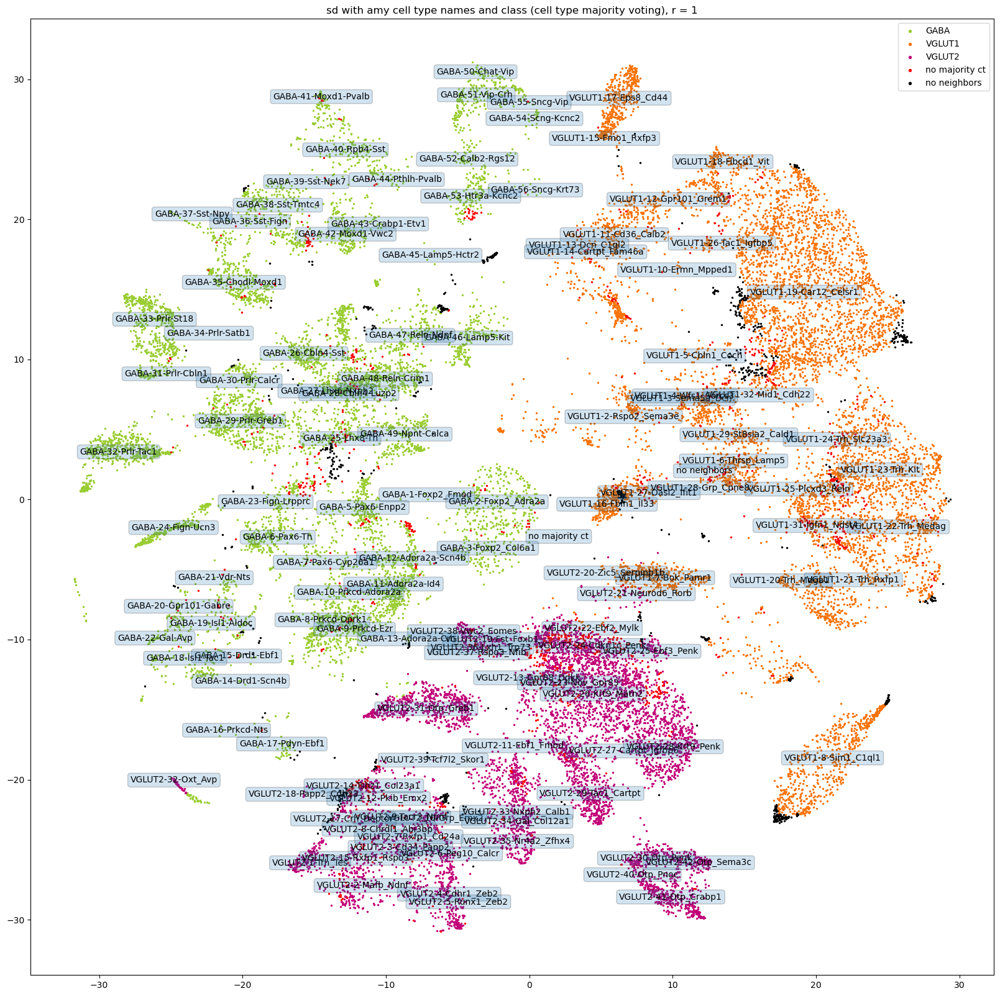

In [274]:
%matplotlib inline
thc.plot_transferred_cell_labels(sd_metadata_df_subset_w_amc,amy_sd_arr_tsne,meta_data_df_pca,
                                 1,
                                 out_folder, 
                                 'ctype_cclass_sd_w_amy_names_mv_r_1_full_name',
                                 savefig=True)

In [758]:
list(np.unique(sd_metadata_df_subset_w_amc.loc['amy_class']))

['GABA',
 'NA - no majority ct',
 'NA - no neighbors',
 'Nonneuronal',
 'VGLUT1',
 'VGLUT2']

### Use text files containing hex codes for each cluster from amy paper to match cluster colors with amy assigned clusters in SD data

In [121]:
amy_cluster_txt_files = '/bigdata/isaac/sd_amy_tsne_harmony_comp/amy_cluster_txt_files/'

In [122]:
cd '/bigdata/isaac/sd_amy_tsne_harmony_comp/amy_cluster_txt_files/'

/bigdata/isaac/sd_amy_tsne_harmony_comp/amy_cluster_txt_files


/home/isaac/anaconda3/lib/python3.11/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [123]:
ls

Clusters_info_hannah.txt  Glut1-hexa.txt  old_2_new_cluster_names.csv
GABA-hexa.txt             Glut2-hexa.txt


In [124]:
#load file to convert old names to new names
old_2_new_cluster_names = pd.read_csv(amy_cluster_txt_files + 'old_2_new_cluster_names.csv')
old_2_new_cluster_names.head()

,old,new
0,'GABA_Fmod_Tshz1','GABA-1-Foxp2_Fmod'
1,'GABA_Scn10a_Tshz1','GABA-2-Foxp2_Adra2a'
2,'GABA_Plekha2_Tshz1','GABA-3-Foxp2_Col6a1'
3,'GABA_Htr1f_Tshz1','GABA-4-Foxp2_Htr1f'
4,'GABA_Oprk1_Myh7','GABA-5-Pax6-Enpp2'


In [125]:
#remove single quotes from entries
old_2_new_cluster_names["old"] = old_2_new_cluster_names["old"].str.replace("'", "", regex=False)
old_2_new_cluster_names["new"] = old_2_new_cluster_names["new"].str.replace("'", "", regex=False)

In [145]:
#make consistent using '-' instead of '_' in naming convention
old_2_new_cluster_names['new'] = old_2_new_cluster_names["new"].str.replace("_", "-", regex=False)

In [275]:
old_2_new_cluster_names.head()

,old,new
0,GABA_Fmod_Tshz1,GABA-1-Foxp2-Fmod
1,GABA_Scn10a_Tshz1,GABA-2-Foxp2-Adra2a
2,GABA_Plekha2_Tshz1,GABA-3-Foxp2-Col6a1
3,GABA_Htr1f_Tshz1,GABA-4-Foxp2-Htr1f
4,GABA_Oprk1_Myh7,GABA-5-Pax6-Enpp2


In [147]:
#create dict old:new
old_2_new_amy_dict = dict(zip(old_2_new_cluster_names['old'],old_2_new_cluster_names['new']))

In [142]:
sd_metadata_df_subset_w_amc

,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,AGGAGGTTCATTTGGG-1_10X35_1,CGCATGGAGATGAACT-1_10X52_1,AGTAGTCGTATCTTCT-1_10X51_4,GTTGTCCGTTCTCCAC-1_10X51_4,AGATGCTAGATTACCC-1_10X51_2,TCGGATAGTCTCCTGT-1_10X51_3,GTTCCGTCACGATAGG-1_10X36_2,CGGACACGTATACCCA-1_10X52_4,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,no neighbors,no neighbors,GABA,GABA,GABA,no neighbors,...,GABA,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,GABA,VGLUT2,VGLUT2,GABA
amy_markers,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,no neighbors,no neighbors,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,no neighbors,...,Pax6-Th,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Pax6-Th,Ebf3-Penk,Otp-Greb1,Pax6-Th
amy_full_name,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,no neighbors,no neighbors,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,no neighbors,...,GABA-6-Pax6-Th,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,GABA-6-Pax6-Th,VGLUT2-25-Ebf3_Penk,VGLUT2-31-Otp_Greb1,GABA-6-Pax6-Th


In [144]:
list(set(sd_metadata_df_subset_w_amc.loc['amy_markers']))

['Zic5-Serpinb1b',
 'Ebf1-Fmod',
 'Isl1-Tac1',
 'Cdkn1c-Penk',
 'Trh-Medag',
 'Oxt-Avp',
 'Nxph2-Calb1',
 'Cbln4-Luzp2',
 'Foxp2-Adra2a',
 'Fmo1-Rxfp3',
 'Gal-Col12a1',
 'Trh-Rxfp1',
 'Chodl-Moxd1',
 'Runx1-Zeb2',
 'Cartpt-Igfbp6',
 'Vdr-Nts',
 'Calb2-Rgs12',
 'Rspo2-Sema3e',
 'Rpb4-Sst',
 'Moxd1-Vwc2',
 'Gsg1l-Prox1',
 'Crh-Deptor',
 'Npnt-Calca',
 'Prkcd-Ezr',
 'Oasl2-Ifit1',
 'Cdhr1-Zeb2',
 'Chrdl1-Abi3bp',
 'Scng-Kcnc2',
 'Foxp2-Col6a1',
 'Fibcd1-Vit',
 'Fign-Lrpprc',
 'Prlr-Greb1',
 'Sst-Tmtc4',
 'Drd1-Ebf1',
 'Lamp5-Hctr2',
 'Prlr-St18',
 'Eps8-Cd44',
 'Adora2a-Scn4b',
 'Pkib-Emx2',
 'Car12-Celsr1',
 'Reln-Ndnf',
 'Mafb-Ndnf',
 'Tshz1-Col23a1',
 'Ermn-Mpped1',
 'Peg10-Calcr',
 'Tcf7l2-Skor1',
 'Bok-Pamr1',
 'Sncg-Vip',
 'Pax6-Cyp26a1',
 'Foxp2-Fmod',
 'Drd1-Scn4b',
 'Gpr88-Dgkk',
 'Otp-Crabp1',
 'Pdyn-Ebf1',
 'Igfn1-Ndst4',
 'Reln-Crim1',
 'Dcn-C1ql2',
 'Prlr-Satb1',
 'Tac1-Igfbp5',
 'Crabp1-Etv1',
 'Fbln1-Il33',
 'Otp-Pnoc',
 'Cd34-Pappa2',
 'Pappa2-Cd34',
 'Sst-Nek7',
 'Prlr-Cb

In [276]:
gaba_hcodes_row = thc.get_hcodes(amy_cluster_txt_files,'GABA-hexa.txt','GABA',old_2_new_amy_dict,sd_metadata_df_subset_w_amc)

    GABA-cl#                  Name           updated_name    marker_name  \
0          1       GABA_Fmod_Tshz1      GABA-1-Foxp2-Fmod     Foxp2-Fmod   
1          2     GABA_Scn10a_Tshz1    GABA-2-Foxp2-Adra2a   Foxp2-Adra2a   
2          3    GABA_Plekha2_Tshz1    GABA-3-Foxp2-Col6a1   Foxp2-Col6a1   
3          4      GABA_Htr1f_Tshz1     GABA-4-Foxp2-Htr1f    Foxp2-Htr1f   
4          5       GABA_Oprk1_Myh7      GABA-5-Pax6-Enpp2     Pax6-Enpp2   
5          6         GABA_Pax6_Nts         GABA-6-Pax6-Th        Pax6-Th   
6          7    GABA_Cyp26b1_Tacr3    GABA-7-Pax6-Cyp26a1   Pax6-Cyp26a1   
7          8       GABA_Oprk1_Dio3     GABA-8-Prkcd-Oprk1    Prkcd-Oprk1   
8          9     GABA_Prkcd_Cdc14a       GABA-9-Prkcd-Ezr      Prkcd-Ezr   
9         10    GABA_Prkcd_Adora2a  GABA-10-Prkcd-Adora2a  Prkcd-Adora2a   
10        11    GABA_Adora2a_Ctnx3    GABA-11-Adora2a-Id4    Adora2a-Id4   
11        12     GABA_Adora2a_Nexn  GABA-12-Adora2a-Scn4b  Adora2a-Scn4b   
12        13

In [277]:
sd_metadata_df_subset_w_amc.loc[:,sd_metadata_df_subset_w_amc.loc['amy_class',:]=='GABA']

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CTGAGGCAGTAGTCTC-1_10X52_1,CACTGGGTCTGTCAGA-1_10X51_1,GCTTCACGTTCAAACC-1_10X52_1,TAGACCAAGCGGGTAT-1_10X51_1,TACGTCCCAGCTCCTT-1_10X51_2,TCCCACAGTTCTCCCA-1_10X51_2,TGTCAGAGTGGACAGT-1_10X51_1,CGTTCTGCAGAATCGG-1_10X51_2,TGGATGTCAATTTCTC-1_10X35_2,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
amy_markers,Prlr-St18,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,...,Pax6-Th,Pax6-Th,Pax6-Th,Pax6-Th,Pax6-Th,Pax6-Th,Pax6-Th,Pax6-Th,Pax6-Th,Pax6-Th
amy_full_name,GABA-33-Prlr-St18,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,...,GABA-6-Pax6-Th,GABA-6-Pax6-Th,GABA-6-Pax6-Th,GABA-6-Pax6-Th,GABA-6-Pax6-Th,GABA-6-Pax6-Th,GABA-6-Pax6-Th,GABA-6-Pax6-Th,GABA-6-Pax6-Th,GABA-6-Pax6-Th


In [278]:
gaba_hcodes_row

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CTGAGGCAGTAGTCTC-1_10X52_1,CACTGGGTCTGTCAGA-1_10X51_1,GCTTCACGTTCAAACC-1_10X52_1,TAGACCAAGCGGGTAT-1_10X51_1,TACGTCCCAGCTCCTT-1_10X51_2,TCCCACAGTTCTCCCA-1_10X51_2,TGTCAGAGTGGACAGT-1_10X51_1,CGTTCTGCAGAATCGG-1_10X51_2,TGGATGTCAATTTCTC-1_10X35_2,CATACAGAGAGAGCAA-1_10X52_1
hexacode,008D39,026634,026634,026634,026634,026634,026634,026634,026634,026634,...,FDEB19,FDEB19,FDEB19,FDEB19,FDEB19,FDEB19,FDEB19,FDEB19,FDEB19,FDEB19


In [279]:
len(np.where(gaba_hcodes_row.loc['hexacode',:]=='NA')[0])

0

In [280]:
np.where(gaba_hcodes_row.loc['hexacode',:]==np.NaN)

(array([], dtype=int64),)

In [281]:
vglut1_hcodes_row = thc.get_hcodes(amy_cluster_txt_files,'Glut1-hexa.txt','VGLUT1',old_2_new_amy_dict,sd_metadata_df_subset_w_amc)

    Glut1-cl#                 Name             updated_name    marker_name  \
0           1     Glut1_Zic4_Trp73      VGLUT1-1-Zic4-Trp73     Zic4-Trp73   
1           2   Glut1_Rspo2_Sema3e    VGLUT1-2-Rspo2-Sema3e   Rspo2-Sema3e   
2           3     Glut1_Sema5a_Dcn      VGLUT1-3-Sema5a-Dcn     Sema5a-Dcn   
3           4    Glut1_Wfs1_Sorcs3     VGLUT1-4-Wfs1-Sorcs3    Wfs1-Sorcs3   
4           5     Glut1_Cbln1_Coch      VGLUT1-5-Cbln1-Coch     Cbln1-Coch   
5           6    Glut1_Thrsp_Lamp5     VGLUT1-6-Thrsp-Lamp5    Thrsp-Lamp5   
6           7      Glut1_Bok_Pamr1       VGLUT1-7-Bok-Pamr1      Bok-Pamr1   
7           8     Glut1_Sim1_C1ql1      VGLUT1-8-Sim1-C1ql1     Sim1-C1ql1   
8           9     Glut1_Gpx3_Rxfp1      VGLUT1-9-Gpx3-Rxfp1     Gpx3-Rxfp1   
9          10    Glut1_Ermn_Mpped1    VGLUT1-10-Ermn-Mpped1    Ermn-Mpped1   
10         11     Glut1_Cd63_Calb2     VGLUT1-11-Cd36-Calb2     Cd36-Calb2   
11         12   Glut1_Gpr101_Grem1   VGLUT1-12-Gpr101-Grem1   Gp

In [282]:
vglut1_hcodes_row

,GCGTTTCAGGGCAAGG-1_10X37_2,ATCAGGTAGCTAGATA-1_10X52_2,CACATGAAGTATTCCG-1_10X52_1,GAAGTAAGTTCAAGTC-1_10X52_2,ATCACGAGTCGGTGTC-1_10X38_2,TGATTTCAGTTCCGTA-1_10X51_2,TCAATTCGTTAAAGTG-1_10X51_2,TCAGCAACACCAATTG-1_10X51_2,ATCCACCCATTGAAAG-1_10X51_2,ATGGAGGTCAAGTGGG-1_10X51_2,...,AATCGACAGGAGCAAA-1_10X51_1,TTCAATCAGCGGGTTA-1_10X52_1,GTTGAACGTCAACATC-1_10X51_4,TCGCACTTCACGGGAA-1_10X51_1,TGAGGGATCTTTGCGC-1_10X52_1,GAAATGAAGCTAGTTC-1_10X36_2,GTAATCGAGGAACTCG-1_10X51_1,ACGCACGAGCGTTAGG-1_10X51_1,CTCATGCTCATGAGAA-1_10X35_1,AACCATGAGGGTATAT-1_10X36_2
hexacode,f39200,f39200,f39200,be1823,f39200,f39200,f39200,f39200,f39200,f39200,...,be1823,be1823,be1823,be1823,be1823,be1823,be1823,be1823,be1823,f39200


In [283]:
sd_metadata_df_subset_w_amc.loc[:,sd_metadata_df_subset_w_amc.loc['amy_class',:]=='VGLUT1']

,GCGTTTCAGGGCAAGG-1_10X37_2,ATCAGGTAGCTAGATA-1_10X52_2,CACATGAAGTATTCCG-1_10X52_1,GAAGTAAGTTCAAGTC-1_10X52_2,ATCACGAGTCGGTGTC-1_10X38_2,TGATTTCAGTTCCGTA-1_10X51_2,TCAATTCGTTAAAGTG-1_10X51_2,TCAGCAACACCAATTG-1_10X51_2,ATCCACCCATTGAAAG-1_10X51_2,ATGGAGGTCAAGTGGG-1_10X51_2,...,AATCGACAGGAGCAAA-1_10X51_1,TTCAATCAGCGGGTTA-1_10X52_1,GTTGAACGTCAACATC-1_10X51_4,TCGCACTTCACGGGAA-1_10X51_1,TGAGGGATCTTTGCGC-1_10X52_1,GAAATGAAGCTAGTTC-1_10X36_2,GTAATCGAGGAACTCG-1_10X51_1,ACGCACGAGCGTTAGG-1_10X51_1,CTCATGCTCATGAGAA-1_10X35_1,AACCATGAGGGTATAT-1_10X36_2
cell_class,GABA,GABA,GABA,GABA,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Pax6-Calca,Meis2-Tshz1,Greb1-Dlk1,Lypd1-Satb1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,...,Arhgef40-Thrsp,Epha4-Penk,Epha4-Penk,Epha4-Penk,Epha4-Penk,Epha4-Penk,Epha4-Penk,Epha4-Penk,Epha4-Penk,Tshz1-Grp
full_name,GABA-11-Pax6-Calca,GABA-19-Meis2-Tshz1,GABA-27-Greb1-Dlk1,GABA-28-Lypd1-Satb1,Vglut1-1-Sim1-C1ql1,Vglut1-1-Sim1-C1ql1,Vglut1-1-Sim1-C1ql1,Vglut1-1-Sim1-C1ql1,Vglut1-1-Sim1-C1ql1,Vglut1-1-Sim1-C1ql1,...,Vglut2-8-Arhgef40-Thrsp,Vglut2-9-Epha4-Penk,Vglut2-9-Epha4-Penk,Vglut2-9-Epha4-Penk,Vglut2-9-Epha4-Penk,Vglut2-9-Epha4-Penk,Vglut2-9-Epha4-Penk,Vglut2-9-Epha4-Penk,Vglut2-9-Epha4-Penk,Vglut2-12-Tshz1-Grp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,...,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1,VGLUT1
amy_markers,Bok-Pamr1,Rspo2-Sema3e,Sema5a-Dcn,Tac1-Igfbp5,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,...,Plcxd3-Reln,Plcxd3-Reln,Plcxd3-Reln,Plcxd3-Reln,Plcxd3-Reln,Plcxd3-Reln,Plcxd3-Reln,Plcxd3-Reln,Plcxd3-Reln,Rspo2-Sema3e
amy_full_name,VGLUT1-7-Bok_Pamr1,VGLUT1-2-Rspo2_Sema3e,VGLUT1-3-Sema5a_Dcn,VGLUT1-26-Tac1_Igfbp5,VGLUT1-8-Sim1_C1ql1,VGLUT1-8-Sim1_C1ql1,VGLUT1-8-Sim1_C1ql1,VGLUT1-8-Sim1_C1ql1,VGLUT1-8-Sim1_C1ql1,VGLUT1-8-Sim1_C1ql1,...,VGLUT1-25-Plcxd3_Reln,VGLUT1-25-Plcxd3_Reln,VGLUT1-25-Plcxd3_Reln,VGLUT1-25-Plcxd3_Reln,VGLUT1-25-Plcxd3_Reln,VGLUT1-25-Plcxd3_Reln,VGLUT1-25-Plcxd3_Reln,VGLUT1-25-Plcxd3_Reln,VGLUT1-25-Plcxd3_Reln,VGLUT1-2-Rspo2_Sema3e


In [284]:
len(np.where(vglut1_hcodes_row.loc['hexacode',:]=='NA')[0])

0

In [285]:
np.where(vglut1_hcodes_row.loc['hexacode',:]==np.NaN)

(array([], dtype=int64),)

In [286]:
vglut2_hcodes_row = thc.get_hcodes(amy_cluster_txt_files,'Glut2-hexa.txt','VGLUT2',old_2_new_amy_dict,sd_metadata_df_subset_w_amc)

    Glut2-cl#                  Name              updated_name     marker_name  \
0           1         Glut2_Trh_Tes          VGLUT2-1-Trh-Tes         Trh-Tes   
1           2       Glut2_Mafb_Ndnf        VGLUT2-2-Mafb-Ndnf       Mafb-Ndnf   
2           3      Glut2_Cd34_Papp2       VGLUT2-3-Cd34-Papp2      Cd34-Papp2   
3           4      Glut2_Cdhr1_Zeb2       VGLUT2-4-Cdhr1-Zeb2      Cdhr1-Zeb2   
4           5      Glut2_Runx1_Zeb2       VGLUT2-5-Runx1-Zeb2      Runx1-Zeb2   
5           6     Glut2_Peg10_Calcr      VGLUT2-6-Peg10-Calcr     Peg10-Calcr   
6           7     Glut2_Rxfp1_Cd24a      VGLUT2-7-Rxfp1-Cd24a     Rxfp1-Cd24a   
7           8   Glut2_Chrdl1_Abi3bp    VGLUT2-8-Chrdl1-Abi3bp   Chrdl1-Abi3bp   
8           9      Glut2_Tacr3_Npnt       VGLUT2-9-Tacr3-Npnt      Tacr3-Npnt   
9          10        Glut2_Grp_Emx2        VGLUT2-10-Grp-Emx2        Grp-Emx2   
10         11       Glut2_Ebf1_Fmod       VGLUT2-11-Ebf1-Fmod       Ebf1-Fmod   
11         12       Glut2_Pk

In [287]:
vglut2_hcodes_row

,GGAATGGAGCCTCGTG-1_10X37_2,CATACTTAGTGCTACT-1_10X52_1,GTCAAGTGTCAACCTA-1_10X35_1,TAGACTGCATAGGAGC-1_10X51_1,TGAGACTGTAGACACG-1_10X52_4,ATGGATCGTACCGTGC-1_10X51_2,CACCGTTGTGGTATGG-1_10X51_1,GATAGCTAGGGTACAC-1_10X51_1,TCATTTGTCAAACCCA-1_10X51_4,GTCAGCGCAGAGAGGG-1_10X52_2,...,ATGATCGTCTGAGTCA-1_10X51_2,GTTGTAGGTCGCTTGG-1_10X51_2,TGTGAGTAGGTGCGAT-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1
hexacode,662483,a3195b,662483,a3195b,a3195b,662483,662483,a3195b,a3195b,a3195b,...,662483,662483,662483,662483,662483,662483,662483,662483,662483,662483


In [288]:
sd_metadata_df_subset_w_amc.loc[:,sd_metadata_df_subset_w_amc.loc['amy_class',:]=='VGLUT2']

,GGAATGGAGCCTCGTG-1_10X37_2,CATACTTAGTGCTACT-1_10X52_1,GTCAAGTGTCAACCTA-1_10X35_1,TAGACTGCATAGGAGC-1_10X51_1,TGAGACTGTAGACACG-1_10X52_4,ATGGATCGTACCGTGC-1_10X51_2,CACCGTTGTGGTATGG-1_10X51_1,GATAGCTAGGGTACAC-1_10X51_1,TCATTTGTCAAACCCA-1_10X51_4,GTCAGCGCAGAGAGGG-1_10X52_2,...,ATGATCGTCTGAGTCA-1_10X51_2,GTTGTAGGTCGCTTGG-1_10X51_2,TGTGAGTAGGTGCGAT-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Dab1-Myh7,Igsf1-Zfhx3,Isl1-Pou3f2,Col23a1-Hs3st4,Col23a1-Hs3st4,Oprk1-Trhde,Oprk1-Trhde,Oprk1-Trhde,Oprk1-Trhde,Oprk1-Trhde,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-9-Dab1-Myh7,GABA-15-Igsf1-Zfhx3,GABA-17-Isl1-Pou3f2,GABA-22-Col23a1-Hs3st4,GABA-22-Col23a1-Hs3st4,GABA-25-Oprk1-Trhde,GABA-25-Oprk1-Trhde,GABA-25-Oprk1-Trhde,GABA-25-Oprk1-Trhde,GABA-25-Oprk1-Trhde,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
amy_markers,Krt9-Matn2,Gpr88-Dgkk,Otp-Greb1,Ebf1-Fmod,Ebf1-Fmod,Krt9-Matn2,Krt9-Matn2,Ebf1-Fmod,Gpr88-Dgkk,Gpr88-Dgkk,...,Otp-Greb1,Oxt-Avp,Otp-Greb1,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Ebf3-Penk,Otp-Greb1
amy_full_name,VGLUT2-26-Krt9_Matn2,VGLUT2-13-Gpr88_Dgkk,VGLUT2-31-Otp_Greb1,VGLUT2-11-Ebf1_Fmod,VGLUT2-11-Ebf1_Fmod,VGLUT2-26-Krt9_Matn2,VGLUT2-26-Krt9_Matn2,VGLUT2-11-Ebf1_Fmod,VGLUT2-13-Gpr88_Dgkk,VGLUT2-13-Gpr88_Dgkk,...,VGLUT2-31-Otp_Greb1,VGLUT2-32-Oxt_Avp,VGLUT2-31-Otp_Greb1,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-25-Ebf3_Penk,VGLUT2-31-Otp_Greb1


In [289]:
len(np.where(vglut2_hcodes_row.loc['hexacode',:]=='NA')[0])

111

In [290]:
len(np.where(vglut2_hcodes_row.loc['hexacode',:]==np.NaN)[0])

0

In [291]:
sd_metadata_df_subset_w_amc.loc[:,sd_metadata_df_subset_w_amc.loc['amy_markers',:]=='Pappa2-Cd34']

,CGAATTGAGACCATAA-1_10X51_3,TCGGGTGTCGTTCAGA-1_10X51_3,CGATGGCTCTCTTAAC-1_10X52_1,GTTCGCTAGGGAGGGT-1_10X52_2,TCAGTGAGTGTACATC-1_10X36_1,GCGTTTCGTGGTACAG-1_10X36_1,GGAACCCAGGGCTGAT-1_10X52_4,ACTTCCGTCAAGCCCG-1_10X52_4
cell_class,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Tshz1-Calcr,Foxb1-Lhx1os,Foxb1-Lhx1os,Foxb1-Lhx1os,Foxb1-Lhx1os,Foxb1-Lhx1os,Foxb1-Lhx1os,Foxb1-Lhx1os
full_name,Vglut2-13-Tshz1-Calcr,Vglut2-16-Foxb1-Lhx1os,Vglut2-16-Foxb1-Lhx1os,Vglut2-16-Foxb1-Lhx1os,Vglut2-16-Foxb1-Lhx1os,Vglut2-16-Foxb1-Lhx1os,Vglut2-16-Foxb1-Lhx1os,Vglut2-16-Foxb1-Lhx1os
dataset,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
amy_markers,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34
amy_full_name,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23


In [292]:
sd_metadata_df_subset_w_amc

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,GABA,VGLUT2,VGLUT2,GABA
amy_markers,Prlr-St18,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,...,Pax6-Th,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Pax6-Th,Ebf3-Penk,Otp-Greb1,Pax6-Th
amy_full_name,GABA-33-Prlr-St18,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,...,GABA-6-Pax6-Th,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,GABA-6-Pax6-Th,VGLUT2-25-Ebf3_Penk,VGLUT2-31-Otp_Greb1,GABA-6-Pax6-Th


In [164]:
np.where(vglut2_hcodes_row.loc['hexacode',:]=='NA')

(array([  87,  220,  235,  240,  243,  266,  267,  270,  275,  283,  303,
         310,  338,  364,  367,  370,  377,  378,  379,  380,  381,  383,
         386,  387,  390,  392,  395,  396,  403,  405,  407,  410,  415,
         419,  420,  422,  425,  427,  432,  433,  434,  435,  436,  437,
         439,  442,  443,  444,  450,  456,  457,  459,  460,  461,  462,
         463,  481,  484,  491,  494,  519,  527,  530,  532,  535,  538,
         543,  544,  547,  552,  555,  559,  561,  568,  571,  573,  574,
         576,  583,  596,  597,  651,  652,  656,  662,  666,  667,  669,
         671,  692,  707,  708,  798,  802,  806,  840,  870,  881,  910,
         924,  927,  928,  955,  975,  980,  984,  990,  996,  997, 1009,
        1010, 1013, 1026, 1027, 1036, 1053, 1071, 1103, 5183, 5186, 5271,
        5931, 5932, 5933, 5935, 5936, 5937, 5941]),)

In [165]:
np.where(vglut2_hcodes_row.loc['hexacode',:]==np.nan)

(array([], dtype=int64),)

In [293]:
gaba_hcodes_row.shape[1]

7990

In [294]:
vglut1_hcodes_row.shape[1]

8106

In [295]:
vglut2_hcodes_row.shape[1]

6136

In [296]:
gaba_hcodes_row.shape[1] + vglut1_hcodes_row.shape[1] + vglut2_hcodes_row.shape[1]

22232

In [297]:
all_hcodes_row = pd.concat([gaba_hcodes_row,vglut1_hcodes_row,vglut2_hcodes_row], axis = 1)
all_hcodes_row

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,ATGATCGTCTGAGTCA-1_10X51_2,GTTGTAGGTCGCTTGG-1_10X51_2,TGTGAGTAGGTGCGAT-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1
hexacode,008D39,026634,026634,026634,026634,026634,026634,026634,026634,026634,...,662483,662483,662483,662483,662483,662483,662483,662483,662483,662483


In [298]:
sd_metadata_df_subset_w_amc.shape

(7, 24308)

In [299]:
sd_metadata_df_subset_w_amc_hex = sd_metadata_df_subset_w_amc.copy()
sd_metadata_df_subset_w_amc_hex = pd.concat([sd_metadata_df_subset_w_amc_hex,all_hcodes_row])

In [300]:
sd_metadata_df_subset_w_amc_hex

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,GABA,VGLUT2,VGLUT2,GABA
amy_markers,Prlr-St18,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,...,Pax6-Th,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Pax6-Th,Ebf3-Penk,Otp-Greb1,Pax6-Th
amy_full_name,GABA-33-Prlr-St18,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,...,GABA-6-Pax6-Th,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,GABA-6-Pax6-Th,VGLUT2-25-Ebf3_Penk,VGLUT2-31-Otp_Greb1,GABA-6-Pax6-Th
hexacode,008D39,026634,026634,026634,026634,026634,026634,026634,026634,026634,...,FDEB19,662483,662483,662483,662483,662483,FDEB19,662483,662483,FDEB19


In [886]:
#add colors for Nonneuronal, NA - no majority ct, and NA - no neighbors

In [549]:
sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['amy_class']=='Nonneuronal'] = '0000FF'

In [301]:
sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['amy_class']=='no majority ct'] = 'FF0000'

In [302]:
sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['amy_class']=='no neighbors'] = '000000'

In [303]:
sd_metadata_df_subset_w_amc_hex.isna().any(axis=None)

False

In [304]:
sd_metadata_df_subset_w_amc_hex.to_json(out_folder + 'sd_metadata_df_subset_w_amc_hex.json')

In [185]:
list(set(sd_metadata_df_subset_w_amc_hex.loc['hexacode']))

['026634',
 'a3195b',
 'be1823',
 'e94f1c',
 '951b81',
 'd60b52',
 'DEDC03',
 '95C121',
 'f39200',
 '064423',
 '3CAA36',
 '2d2e83',
 '662483',
 '008D39',
 'FF0000',
 'NA',
 'FDEB19',
 '000000']

In [186]:
len(np.where(sd_metadata_df_subset_w_amc_hex.loc['hexacode']=='NA')[0])

128

In [187]:
len(np.where(sd_metadata_df_subset_w_amc_hex.loc['hexacode']==np.nan)[0])

0

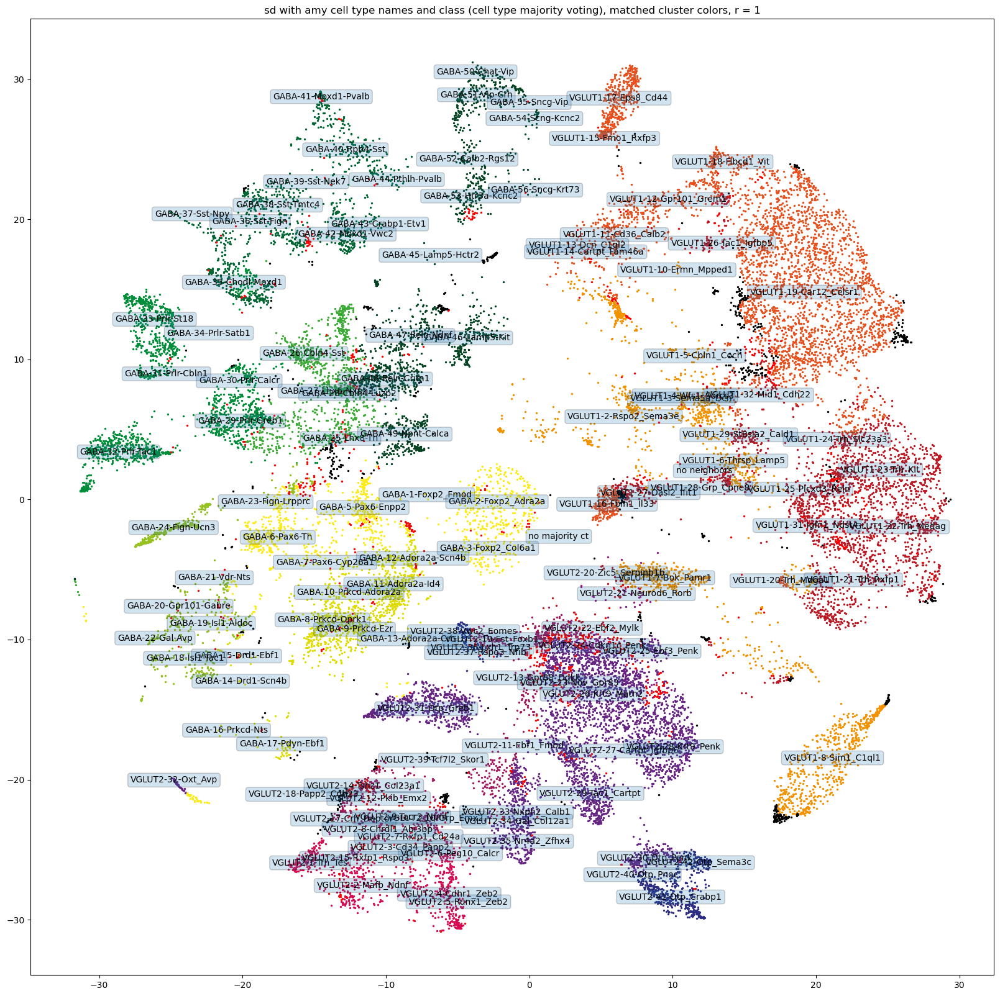

In [305]:
%matplotlib inline
distance_threshold = 1
#get sd cell type labels determined from majority voting using amy labels
sd_labels = list(np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name']))

#get class labels
sd_classes = list(np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_class']))

#get amy transferred hexacode colors
sd_hexacode = list(set(sd_metadata_df_subset_w_amc_hex.loc['hexacode']))

fig,ax = plt.subplots(figsize = (20,20))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
#ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=.25)
for hc in sd_hexacode:
    #print (hc)
    if hc != 'NA':
        ax.scatter(x_sd[sd_metadata_df_subset_w_amc_hex.T['hexacode']==hc],y_sd[sd_metadata_df_subset_w_amc_hex.T['hexacode']==hc], s = 2, c = '#' + hc)

#combine into 2D array
arr_xy_sd = np.vstack([x_sd,y_sd])
for sd_ct in sd_labels:
    #print (arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct])
    cluster_median = np.median(arr_xy_sd.T[sd_metadata_df_subset_w_amc_hex.T['amy_full_name']==sd_ct],axis = 0)
    ax.annotate(text = sd_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
#ax.set_xticks([])
#ax.set_yticks([])
ax.set_title('sd with amy cell type names and class (cell type majority voting), matched cluster colors, r = ' + str(distance_threshold))
#ax.legend(markerscale=2 )

plt.savefig(out_folder + 'ctype_cclass_sd_w_amy_names_r_1_clusters_full_name.pdf')
plt.show()

In [306]:
sd_metadata_df_subset_w_amc_hex

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,GABA,VGLUT2,VGLUT2,GABA
amy_markers,Prlr-St18,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,Chodl-Moxd1,...,Pax6-Th,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Oxt-Avp,Pax6-Th,Ebf3-Penk,Otp-Greb1,Pax6-Th
amy_full_name,GABA-33-Prlr-St18,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,GABA-35-Chodl-Moxd1,...,GABA-6-Pax6-Th,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,VGLUT2-32-Oxt_Avp,GABA-6-Pax6-Th,VGLUT2-25-Ebf3_Penk,VGLUT2-31-Otp_Greb1,GABA-6-Pax6-Th
hexacode,008D39,026634,026634,026634,026634,026634,026634,026634,026634,026634,...,FDEB19,662483,662483,662483,662483,662483,FDEB19,662483,662483,FDEB19


In [332]:

_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['cell_class',:]=='GABA'], return_index=True)
gaba_unique_hcodes = np.array(sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['cell_class',:]=='GABA'][np.sort(idx)])
gaba_unique_hcodes

/tmp/ipykernel_3116087/3964286585.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gaba_unique_hcodes = np.array(sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['cell_class',:]=='GABA'][np.sort(idx)])


array(['008D39', '026634', '000000', 'FF0000', '3CAA36', '064423',
       '95C121', 'DEDC03', '662483', 'FDEB19', 'f39200', 'a3195b',
       'be1823', '2d2e83'], dtype=object)

In [62]:
with open ('/bigdata/isaac/sd_amy_tsne_harmony_comp/sd_metadata_df_subset.json') as json_data:
    sd_metadata_df_subset = json.load(json_data)
sd_metadata_df_subset = pd.DataFrame.from_dict(sd_metadata_df_subset, orient='columns')

In [58]:
sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['amy_markers'] == 'no majority ct']

,GTTAGACGTTTAAGGA-1_10X38_1,TCCTCGAAGAGCACTG-1_10X37_2,TTCCAATGTTCGGACC-1_10X52_2,GTCTAGAGTTCAATCG-1_10X38_1,CCATAAGAGACGCCCT-1_10X35_2,GATGGAGCAGACCTAT-1_10X36_1,CTCAGAAGTGGCTAGA-1_10X52_3,GTGTTAGCACTCGATA-1_10X37_2,GTAACCAGTCGCGTTG-1_10X52_2,AGAAGCGAGGTTGGTG-1_10X52_1,...,ATTCCCGCACAGCCAC-1_10X38_2,TTGCCTGCATACCGTA-1_10X51_2,GTCATCCGTGTCCGTG-1_10X38_1,TCTTCCTCACCTGTCT-1_10X36_1,CTTCCTTCAGACCCGT-1_10X51_1,TCCACGTAGACATACA-1_10X51_2,GCCCGAAGTGCCGAAA-1_10X35_1,CGAAGGAGTGCGGATA-1_10X51_1,CCGTAGGCAATAGTAG-1_10X37_1,GTCATCCTCAAACTGC-1_10X52_2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Nonneuronal
markers,Chat-Isl1,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,...,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,OPC
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,...,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct
amy_class,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,...,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct
hexacode,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,...,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000


In [59]:
sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['amy_markers'] == 'no neighbors']

,AGAGCCCCAGTCAGTT-1_10X35_2,AGTGCCGCACTGAATC-1_10X35_2,TCATACTTCTCATGGA-1_10X52_2,GCTTTCGCATAGAGGC-1_10X36_2,GTGGTTACATTAGGCT-1_10X35_1,TCTACCGAGGCATGGT-1_10X35_2,CCTTGTGGTCAGTCTA-1_10X51_1,ATTCTACGTGGATACG-1_10X52_1,CTGTAGAAGCTAGATA-1_10X38_1,ATACTTCCAGCCCACA-1_10X51_2,...,AAGTGAAAGGCTGAAC-1_10X51_1,AGACAAACAGAATTCC-1_10X51_2,GACCAATTCAAACTGC-1_10X51_1,CTCCACACAGCTGAGA-1_10X51_2,CAGGCCAGTGGCGCTT-1_10X51_1,ATGGGTTGTCACCGCA-1_10X51_2,TTGCATTGTCGTGGAA-1_10X38_1,CACTTCGGTGAATGAT-1_10X52_2,AAGCCATGTGGATGAC-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Maf-Mafb,Maf-Mafb,...,OL_1,OL_1,OL_1,OL_1,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_class,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,...,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors
hexacode,000000,000000,000000,000000,000000,000000,000000,000000,000000,000000,...,000000,000000,000000,000000,000000,000000,000000,000000,000000,000000


In [68]:
sd_metadata_df_subset_w_amc_hex.shape

(6, 26778)

In [307]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['markers'], return_index=True)
sd_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['markers'][np.sort(idx)])

/tmp/ipykernel_3116087/2945933882.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['markers'][np.sort(idx)])


In [308]:
len(sd_markers)

63

In [313]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_markers'], return_index=True)
amy_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_markers'][np.sort(idx)])

/tmp/ipykernel_3116087/1368238258.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_markers'][np.sort(idx)])


In [314]:
len(amy_markers)

127

In [309]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['full_name'], return_index=True)
sd_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['full_name'][np.sort(idx)])

/tmp/ipykernel_3116087/193487750.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['full_name'][np.sort(idx)])


In [315]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'], return_index=True)
amy_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'][np.sort(idx)])

/tmp/ipykernel_3116087/965187987.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'][np.sort(idx)])


In [310]:
len(sd_fn)

63

In [316]:
len(amy_fn)

127

In [317]:
amy_fn_dd_order = _, idx = np.unique(amy_metadata_df_subset_gaba_glut.loc['full_name'], return_index=True)
amy_fn_dd_order = np.array(amy_metadata_df_subset_gaba_glut.loc['full_name'][np.sort(idx)])
amy_fn_dd_order

/tmp/ipykernel_3116087/784287714.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_fn_dd_order = np.array(amy_metadata_df_subset_gaba_glut.loc['full_name'][np.sort(idx)])


array(['GABA-1-Foxp2_Fmod', 'GABA-2-Foxp2_Adra2a', 'GABA-3-Foxp2_Col6a1',
       'GABA-4-Foxp2_Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [318]:
len(amy_fn_dd_order)

130

In [319]:
sd_in_amy_cts = np.full([len(sd_markers),len(amy_markers)],np.NaN)
sd_in_amy_cts.shape

(63, 127)

In [320]:
sd_in_amy_cts_dd_order = np.full([len(sd_markers),len(amy_fn_dd_order)],np.NaN)
sd_in_amy_cts_dd_order.shape

(63, 130)

In [321]:
sd_in_amy_cts_fn = np.full([len(sd_fn),len(amy_fn)],np.NaN)
sd_in_amy_cts_fn.shape

(63, 127)

In [132]:
tmp_amy_ct = sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['amy_markers']=='Sncg-Htr3a']

In [133]:
tmp_amy_ct.shape[1]

0

In [98]:
tmp_amy_ct.loc[:,tmp_amy_ct.loc['markers',:] == 'Chat-Isl1'].shape[1]

20

In [595]:
frac_df = pd.DataFrame(index=sd_markers, columns=amy_markers)
frac_df

,Chat-Vip,Lhx8-Th,Foxp2-Fmod,Sncg-Krt73,Sncg-Vip,no majority ct,Scng-Kcnc2,Htr3a-Kcnc2,Reln-Ndnf,Calb2-Rgs12,...,Vwc2-Eomes,Epend,microglia,OPC_cycling,OPC,Astro,Peri,EC,COP,OL
Chat-Isl1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sncg-Htr3a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Vip-Cbln2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Cpne4-Pde3a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Reln-Ndnf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VSM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OPC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Astro,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OL_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [596]:
for i,sd_m in enumerate(sd_markers):
    for j,amy_m in enumerate(amy_markers):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['markers']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_markers',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_df.loc[sd_m,amy_m] = frac
        #print (i,j)
        #sd_in_amy_cts[[i,j]] = frac
        #print (amy_m)
        #print (n_amy)
        
    #print (sd_m)

In [597]:
frac_df

,Chat-Vip,Lhx8-Th,Foxp2-Fmod,Sncg-Krt73,Sncg-Vip,no majority ct,Scng-Kcnc2,Htr3a-Kcnc2,Reln-Ndnf,Calb2-Rgs12,...,Vwc2-Eomes,Epend,microglia,OPC_cycling,OPC,Astro,Peri,EC,COP,OL
Chat-Isl1,0.54,0.38,0.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Sncg-Htr3a,0.0,0.0,0.0,0.24,0.03,0.03,0.24,0.29,0.15,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Vip-Cbln2,0.01,0.0,0.0,0.0,0.0,0.0,0.08,0.02,0.01,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Cpne4-Pde3a,0.0,0.0,0.04,0.0,0.0,0.08,0.0,0.0,0.46,0.04,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Reln-Ndnf,0.0,0.0,0.0,0.0,0.0,0.05,0.0,0.01,0.85,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VSM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
OPC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.97,0.0,0.0,0.0,0.02,0.0
Astro,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.98,0.0,0.0,0.0,0.0
OL_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.84


In [599]:
frac_df.sum(axis=1)

Chat-Isl1       1.0
Sncg-Htr3a     0.98
Vip-Cbln2       1.0
Cpne4-Pde3a    0.99
Reln-Ndnf      0.98
               ... 
VSM             1.0
OPC            0.99
Astro           1.0
OL_1            1.0
OL_2            1.0
Length: 103, dtype: object

In [575]:
len(amy_dd_order)

144

In [576]:
#use '-' consistently instead of occasional '_' in marker names
amy_dd_order = [x.replace("_", "-") for x in amy_dd_order]

In [577]:
amy_dd_order

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [578]:
[(i,x) for (i,x) in enumerate(amy_dd_order) if 'Papp' in x]

[(90, 'VGLUT2-3-Cd34-Papp2'), (105, 'VGLUT2-18-Papp2-Cdh23')]

In [579]:
#fix misspelled instances of 'Papp'
amy_dd_order[90] = 'VGLUT2-3-Cd34-Pappa2'
amy_dd_order[105] = 'VGLUT2-18-Pappa2-Cdh23'

In [580]:
amy_dd_order[90]

'VGLUT2-3-Cd34-Pappa2'

In [581]:
frac_df.columns

Index(['Chat-Vip', 'Lhx8-Th', 'Foxp2-Fmod', 'Sncg-Krt73', 'Sncg-Vip',
       'no majority ct', 'Scng-Kcnc2', 'Htr3a-Kcnc2', 'Reln-Ndnf',
       'Calb2-Rgs12',
       ...
       'Vwc2-Eomes', 'Epend', 'microglia', 'OPC_cycling', 'OPC', 'Astro',
       'Peri', 'EC', 'COP', 'OL'],
      dtype='object', length=122)

In [582]:
amy_dd_order[:-14]

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [ ]:
#amy_dd_order_markers = [x.split('-')[2:] for x in amy_dd_order[:-14]]

In [ ]:
#amy_dd_order_markers = ['-'.join(x) for x in amy_dd_order_markers]

In [121]:
type(frac_df.iloc[0,0])

float

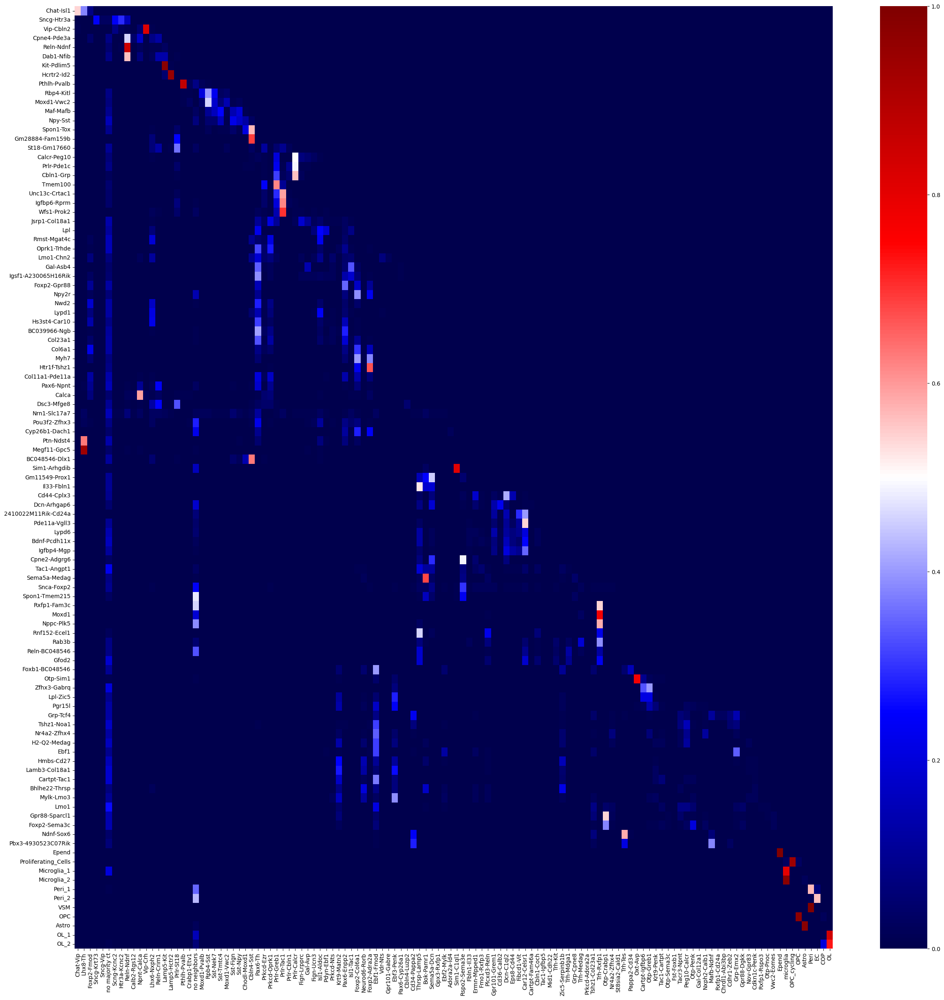

In [598]:
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_df.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 45)
#plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/frac_amy_cts_in_sd_cts_heatmap_full_names.pdf')
plt.show()

In [ ]:
#interactive version

In [600]:
heatmap2 = frac_df.hvplot.heatmap(title='Fraction of Amy cell types per SD Cell Types Post Cluster Label Transfer',  
                                                                                                cmap='seismic', width=1200, height=1000, colorbar=True)
heatmap2.opts(xrotation = 45, xlabel='Amy Cell Types',ylabel='SD Cell Types')
hvplot.show(heatmap2)
    
# Ensure output is displayed inline
hv.output(heatmap2, backend='bokeh')
hv.save(heatmap2, '/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/frac_amy_cts_in_sd_cts_heatmap_interactive.html', fmt='html')

Launching server at http://localhost:46523


:HeatMap   [columns,index]   (value)

In [322]:
### full name version
frac_df_fn = pd.DataFrame(index=sd_fn, columns=amy_fn)

for i,sd_m in enumerate(sd_fn):
    for j,amy_m in enumerate(amy_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_df_fn.loc[sd_m,amy_m] = frac

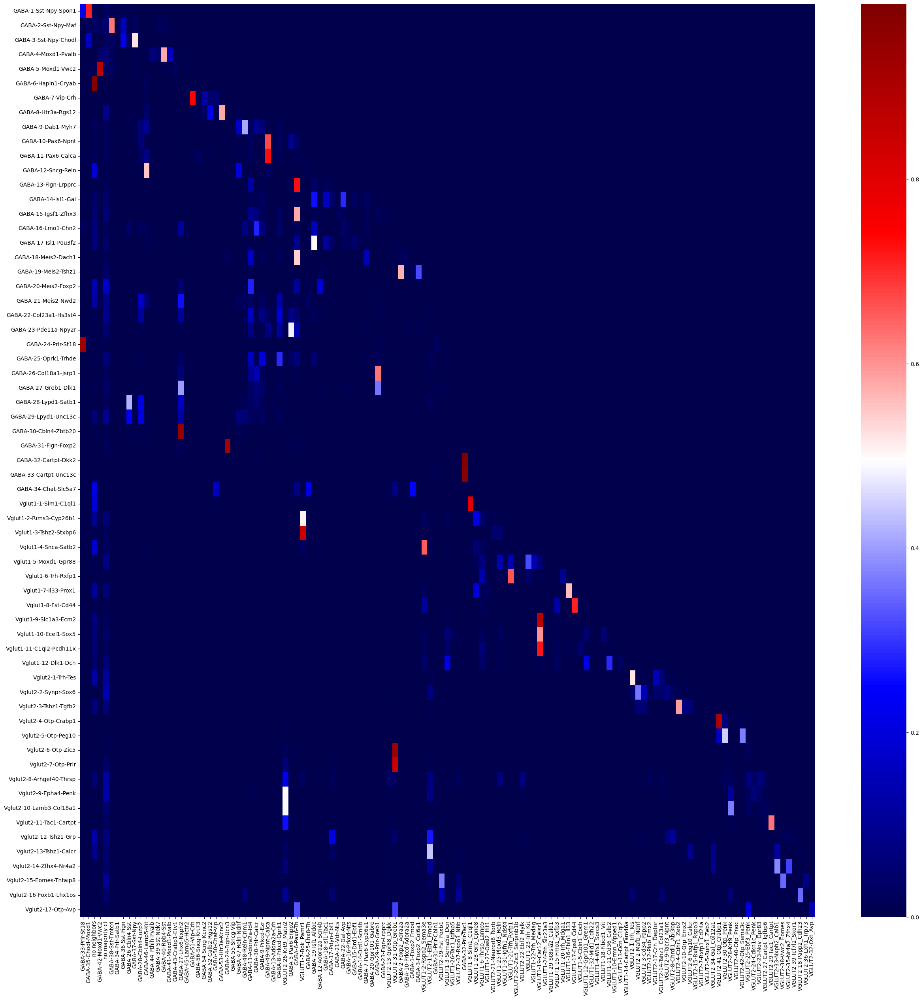

In [323]:
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_df_fn.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig(out_folder + 'frac_amy_cts_in_sd_cts_heatmap_full_names.pdf')
plt.show()

In [333]:
frac_df_fn

,GABA-33-Prlr-St18,GABA-35-Chodl-Moxd1,no neighbors,GABA-42-Moxd1-Vwc2,no majority ct,GABA-38-Sst-Tmtc4,GABA-34-Prlr-Satb1,GABA-36-Sst-Fign,GABA-26-Cbln4-Sst,GABA-37-Sst-Npy,...,VGLUT2-23-Nov_Gpr83,VGLUT2-27-Cartpt_Igfbp6,VGLUT2-29-Tac1_Cartpt,VGLUT2-33-Nxph2_Calb1,VGLUT2-38-Vwc2_Eomes,VGLUT2-35-Nr4a2_Zfhx4,VGLUT2-39-Tcf7l2_Skor1,VGLUT2-18-Papp2_Cdh23,VGLUT2-36-Lxh1_Trp73,VGLUT2-32-Oxt_Avp
GABA-1-Sst-Npy-Spon1,0.22,0.71,0.01,0.0,0.03,0.01,0.01,0.01,0.01,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-2-Sst-Npy-Maf,0.0,0.02,0.03,0.03,0.05,0.63,0.0,0.16,0.0,0.03,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-3-Sst-Npy-Chodl,0.0,0.17,0.0,0.0,0.03,0.03,0.0,0.22,0.03,0.52,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-4-Moxd1-Pvalb,0.0,0.0,0.0,0.04,0.06,0.02,0.0,0.0,0.0,0.01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-5-Moxd1-Vwc2,0.0,0.01,0.01,0.87,0.03,0.03,0.0,0.0,0.0,0.01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vglut2-13-Tshz1-Calcr,0.0,0.0,0.09,0.0,0.05,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.12,0.0,0.0,0.0,0.01,0.0,0.0
Vglut2-14-Zfhx4-Nr4a2,0.0,0.0,0.01,0.0,0.04,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.38,0.0,0.31,0.0,0.0,0.0,0.0
Vglut2-15-Eomes-Tnfaip8,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.35,0.01,0.0,0.0,0.08,0.0
Vglut2-16-Foxb1-Lhx1os,0.0,0.0,0.0,0.0,0.05,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.35,0.0,0.0


In [324]:
### full name version, dd ordered
frac_df_fn_dd_order = pd.DataFrame(index=sd_fn, columns=amy_fn_dd_order)

for i,sd_m in enumerate(sd_fn):
    for j,amy_m in enumerate(amy_fn_dd_order):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_df_fn_dd_order.loc[sd_m,amy_m] = frac

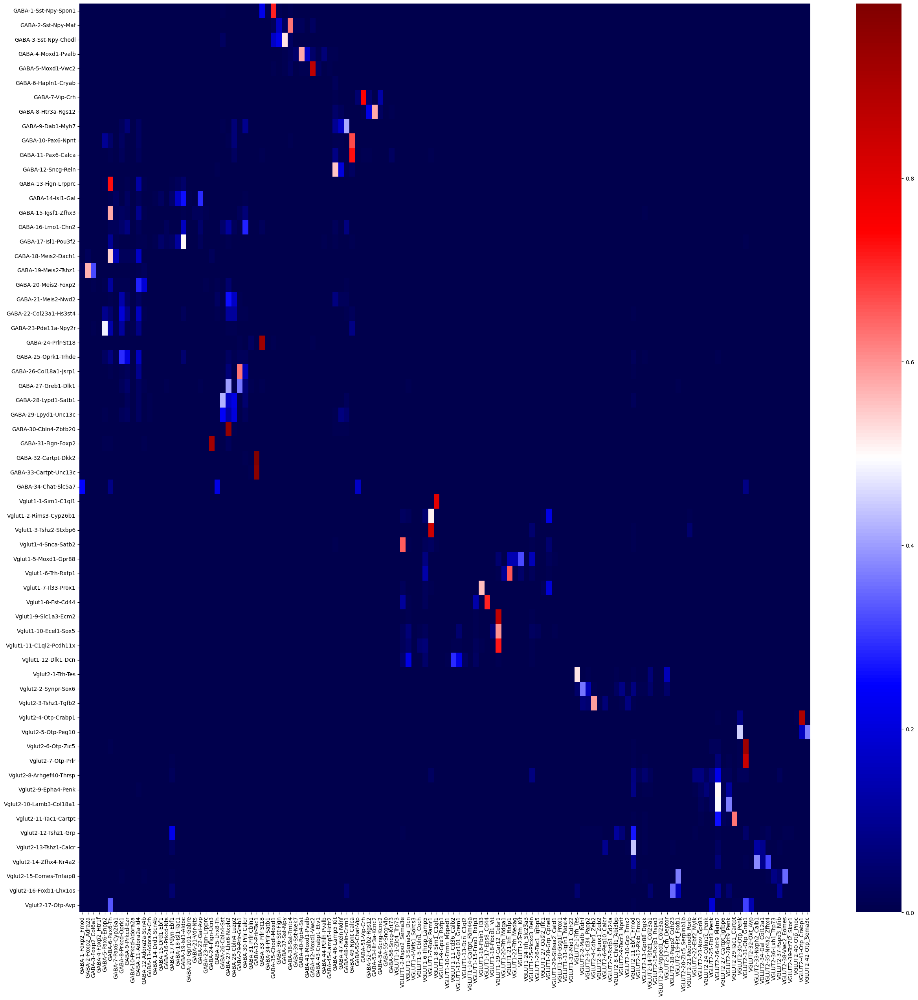

In [325]:
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_df_fn_dd_order.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig(out_folder + 'frac_amy_cts_in_sd_cts_heatmap_full_names_dd_order.pdf')
plt.show()

In [326]:
heatmap2 = frac_df_fn_dd_order.hvplot.heatmap(title='Fraction of Amy cell types per SD Cell Types Post Cluster Label Transfer',  
                                                                                                cmap='seismic', width=1200, height=1000, colorbar=True)
heatmap2.opts(xrotation = 45, xlabel='Amy Cell Types',ylabel='SD Cell Types')
hvplot.show(heatmap2)
    
# Ensure output is displayed inline
hv.output(heatmap2, backend='bokeh')
hv.save(heatmap2, out_folder + 'frac_amy_cts_in_sd_cts_heatmap_interactive_full_names_dd_order.html', fmt='html')

Launching server at http://localhost:40013


:HeatMap   [columns,index]   (value)

In [ ]:
#sort amy columns 

In [327]:
frac_df_fn

,GABA-33-Prlr-St18,GABA-35-Chodl-Moxd1,no neighbors,GABA-42-Moxd1-Vwc2,no majority ct,GABA-38-Sst-Tmtc4,GABA-34-Prlr-Satb1,GABA-36-Sst-Fign,GABA-26-Cbln4-Sst,GABA-37-Sst-Npy,...,VGLUT2-23-Nov_Gpr83,VGLUT2-27-Cartpt_Igfbp6,VGLUT2-29-Tac1_Cartpt,VGLUT2-33-Nxph2_Calb1,VGLUT2-38-Vwc2_Eomes,VGLUT2-35-Nr4a2_Zfhx4,VGLUT2-39-Tcf7l2_Skor1,VGLUT2-18-Papp2_Cdh23,VGLUT2-36-Lxh1_Trp73,VGLUT2-32-Oxt_Avp
GABA-1-Sst-Npy-Spon1,0.22,0.71,0.01,0.0,0.03,0.01,0.01,0.01,0.01,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-2-Sst-Npy-Maf,0.0,0.02,0.03,0.03,0.05,0.63,0.0,0.16,0.0,0.03,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-3-Sst-Npy-Chodl,0.0,0.17,0.0,0.0,0.03,0.03,0.0,0.22,0.03,0.52,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-4-Moxd1-Pvalb,0.0,0.0,0.0,0.04,0.06,0.02,0.0,0.0,0.0,0.01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-5-Moxd1-Vwc2,0.0,0.01,0.01,0.87,0.03,0.03,0.0,0.0,0.0,0.01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vglut2-13-Tshz1-Calcr,0.0,0.0,0.09,0.0,0.05,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.12,0.0,0.0,0.0,0.01,0.0,0.0
Vglut2-14-Zfhx4-Nr4a2,0.0,0.0,0.01,0.0,0.04,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.38,0.0,0.31,0.0,0.0,0.0,0.0
Vglut2-15-Eomes-Tnfaip8,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.35,0.01,0.0,0.0,0.08,0.0
Vglut2-16-Foxb1-Lhx1os,0.0,0.0,0.0,0.0,0.05,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.35,0.0,0.0


In [601]:
sd_metadata_df_subset_w_amc_hex

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,no neighbors,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
amy_markers,Chat-Vip,Lhx8-Th,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Foxp2-Fmod,Chat-Vip,Lhx8-Th,Lhx8-Th,...,OL,COP,COP,COP,OL,no neighbors,OL,OL,OL,OL
amy_full_name,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-1-Foxp2_Fmod,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-25-Lhx8-Th,...,Nonneuronal-7-OL,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-7-OL,no neighbors,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL
hexacode,064423,3CAA36,064423,064423,064423,064423,FDEB19,064423,3CAA36,3CAA36,...,0000FF,0000FF,0000FF,0000FF,0000FF,000000,0000FF,0000FF,0000FF,0000FF


# Try alternate approach, split each dataset by class, independent feature selection, combine, pca, harmony, tsne, assignment

In [613]:
amy_df.shape

(27874, 55514)

In [614]:
amy_df

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
Xkr4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC168977.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PISD,6,9,9,0,8,2,13,3,0,3,...,17,0,0,9,0,0,8,10,9,8
DHRSX,0,2,0,0,0,2,0,0,0,0,...,0,0,6,0,6,0,0,0,4,8
Vmn2r122,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [649]:
with open ('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset.json') as json_data:
    amy_metadata_df_subset = json.load(json_data)
amy_metadata_df_subset = pd.DataFrame.from_dict(amy_metadata_df_subset, orient='columns')

In [650]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [651]:
amy_gaba_md = amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['cell_class']=='GABA']
amy_gaba = amy_df.reindex(columns = amy_gaba_md.columns)

In [652]:
amy_gaba_md

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TTGAGTGAGACCTCCG-1_76-1,AGTCACAAGCCAGTAG-1_76-2,CCTAAGATCCGTGTAA-1_76-2,CTTCCGATCCTGTTAT-1_76-2,GTTACAGAGGTCGTCC-1_76-2,TACCGAATCTGCCTCA-1_76-2,TAGACTGTCGGACTTA-1_76-2,TCTTAGTAGCAAGTGC-1_76-2,TGCATCCTCTGTCCCA-1_76-2,TGGGATTCATCCGAAT-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [653]:
amy_gaba

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TTGAGTGAGACCTCCG-1_76-1,AGTCACAAGCCAGTAG-1_76-2,CCTAAGATCCGTGTAA-1_76-2,CTTCCGATCCTGTTAT-1_76-2,GTTACAGAGGTCGTCC-1_76-2,TACCGAATCTGCCTCA-1_76-2,TAGACTGTCGGACTTA-1_76-2,TCTTAGTAGCAAGTGC-1_76-2,TGCATCCTCTGTCCCA-1_76-2,TGGGATTCATCCGAAT-1_76-2
Xkr4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,2,0,1,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC168977.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PISD,6,9,9,0,8,2,13,3,0,3,...,1,0,0,1,0,0,0,0,1,2
DHRSX,0,2,0,0,0,2,0,0,0,0,...,0,0,2,0,0,0,0,0,1,1
Vmn2r122,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [654]:
sd_df

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Xkr4,0,0,2,1,1,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC168977.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PISD,1,1,4,3,0,5,1,3,0,3,...,1,0,0,0,0,0,0,0,1,0
DHRSX,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,2
Vmn2r122,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [655]:
sd_metadata_df_subset

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [656]:
sd_gaba_md = sd_metadata_df_subset.loc[:,sd_metadata_df_subset.loc['cell_class']=='GABA']
sd_gaba = sd_df.reindex(columns = sd_gaba_md.columns)

In [657]:
sd_gaba_md

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,TCGGGTGGTGGCTAGA-1_10X36_1,CAGGCCATCGCACGAC-1_10X35_1,CATCCACAGATCACCT-1_10X38_2,TTCACCGCAAGCGAGT-1_10X51_2,AGAAATGCAATCCTTT-1_10X52_1,TCAGCAACAGTTGAAA-1_10X52_4,GGGCTCAGTTCAGCTA-1_10X52_2,CTCCGATAGTCCCGGT-1_10X38_1,TTTCACAGTGATAGAT-1_10X35_2,TTCATTGTCCACACAA-1_10X38_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [658]:
sd_gaba

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,TCGGGTGGTGGCTAGA-1_10X36_1,CAGGCCATCGCACGAC-1_10X35_1,CATCCACAGATCACCT-1_10X38_2,TTCACCGCAAGCGAGT-1_10X51_2,AGAAATGCAATCCTTT-1_10X52_1,TCAGCAACAGTTGAAA-1_10X52_4,GGGCTCAGTTCAGCTA-1_10X52_2,CTCCGATAGTCCCGGT-1_10X38_1,TTTCACAGTGATAGAT-1_10X35_2,TTCATTGTCCACACAA-1_10X38_1
Xkr4,0,0,2,1,1,1,0,0,0,0,...,1,0,0,5,0,1,0,0,1,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC168977.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PISD,1,1,4,3,0,5,1,3,0,3,...,3,4,4,2,2,1,0,0,0,1
DHRSX,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Vmn2r122,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Total cells reduced from 13006 to 13006
Total genes reduced from 27874 to 14298


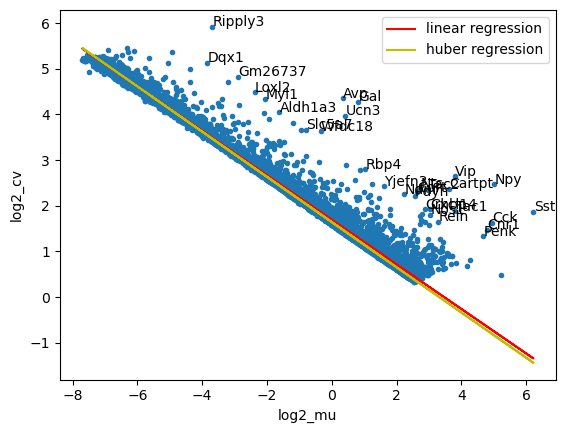

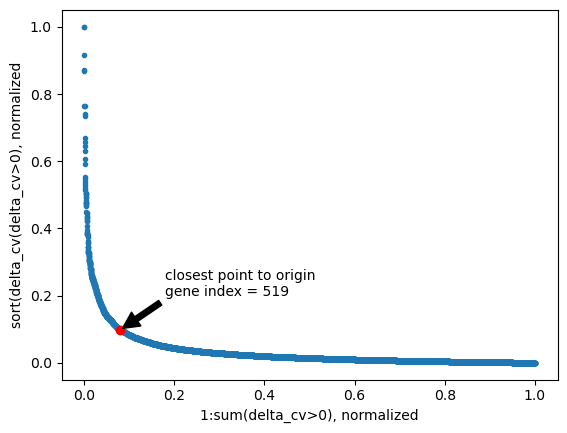

column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


In [659]:
amy_gaba = amy_gaba.astype('int')
#process using standard workflow/functions from dimorph_processing.py
amy_gaba_bool = amy_gaba.mask(amy_gaba>0, other = 1)
status_df = dp.intialize_status_df()
amy_gaba_ce, amy_gaba_bool, amy_gaba_md, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = amy_gaba_md,
                                                      df_bool = amy_gaba_bool,
                                                      df = amy_gaba,
                                                      status_df = status_df)
amy_gaba_ce_ge, amy_gaba_bool, amy_gaba_md, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=amy_gaba_bool,
                                                 df = amy_gaba_ce,
                                                 meta_data_df = amy_gaba_md,
                                                 status_df = status_df)

amy_gaba_cv_df = dp.analyze_cv(df = amy_gaba_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
amy_gene_index, amy_gaba_ce_ge_cv, status_df = dp.get_top_cv_genes(df = amy_gaba_ce_ge, cv_df=amy_gaba_cv_df, plot_flag=1, status_df=status_df)
amy_gaba_cv_ls_arr,status_df = dp.log_and_standerdize_df(amy_gaba_ce_ge_cv,status_df)
amy_gaba_ce_ge_cv_ls = pd.DataFrame(data=amy_gaba_cv_ls_arr.T, index=amy_gaba_ce_ge_cv.index, columns=amy_gaba_ce_ge_cv.columns)


Total cells reduced from 10014 to 10014
Total genes reduced from 27874 to 14207


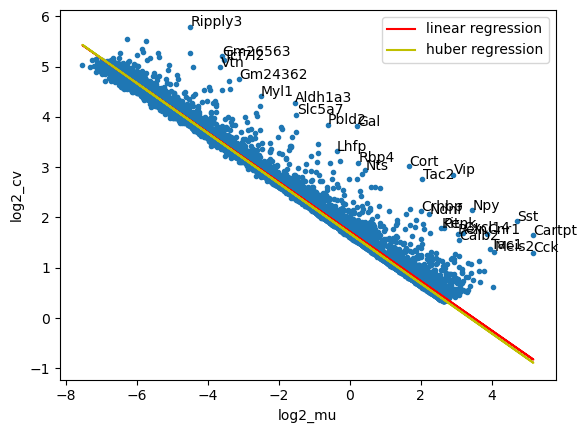

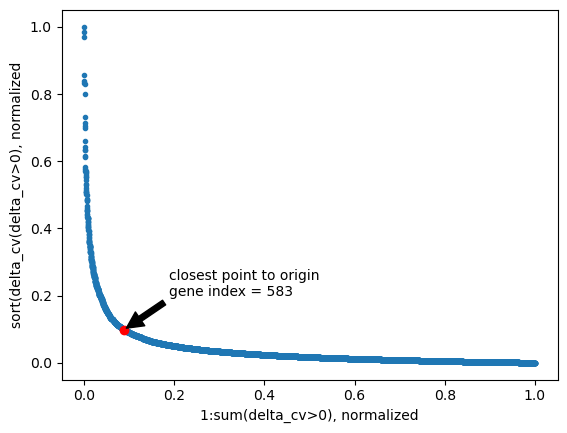

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


In [660]:
sd_gaba = sd_gaba.astype('int')
#process using standard workflow/functions from dimorph_processing.py
sd_gaba_bool = sd_gaba.mask(sd_gaba>0, other = 1)
status_df = dp.intialize_status_df()
sd_gaba_ce, sd_gaba_bool, sd_gaba_md, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = sd_gaba_md,
                                                      df_bool = sd_gaba_bool,
                                                      df = sd_gaba,
                                                      status_df = status_df)
sd_gaba_ce_ge, sd_gaba_bool, sd_gaba_md, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=sd_gaba_bool,
                                                 df = sd_gaba_ce,
                                                 meta_data_df = sd_gaba_md,
                                                 status_df = status_df)

sd_gaba_cv_df = dp.analyze_cv(df = sd_gaba_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
sd_gene_index, sd_gaba_ce_ge_cv, status_df = dp.get_top_cv_genes(df = sd_gaba_ce_ge, cv_df=sd_gaba_cv_df, plot_flag=1, status_df=status_df)
sd_gaba_cv_ls_arr,status_df = dp.log_and_standerdize_df(sd_gaba_ce_ge_cv,status_df)
sd_gaba_ce_ge_cv_ls = pd.DataFrame(data=sd_gaba_cv_ls_arr.T, index=sd_gaba_ce_ge_cv.index, columns=sd_gaba_ce_ge_cv.columns)


In [661]:
amy_gaba_ce_ge_cv_ls.shape

(519, 13006)

In [662]:
sd_gaba_ce_ge_cv_ls.shape

(583, 10014)

In [663]:
intersected_gene_ind_cv = amy_gaba_ce_ge_cv_ls.index.intersection(sd_gaba_ce_ge_cv_ls.index)

In [664]:
intersected_gene_ind_cv

Index(['Sst', 'Npy', 'Gal', 'Avp', 'Vip', 'Ucn3', 'Cartpt', 'Ripply3', 'Cck',
       'Cnr1',
       ...
       'Jsrp1', 'Sostdc1', 'Shisa6', 'Pdlim5', 'Fam19a2', 'Krt12', 'Ppargc1a',
       'Pld5', 'Kcnip4', 'Lhfp'],
      dtype='object', length=384)

In [665]:
amy_gaba_ce_ge_cv_ls = amy_gaba_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)
sd_gaba_ce_ge_cv_ls = sd_gaba_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)
amy_sd_gaba_ce_ge_cv_ls = pd.concat([amy_gaba_ce_ge_cv_ls,sd_gaba_ce_ge_cv_ls], axis = 1)

In [666]:
amy_sd_gaba_ce_ge_cv_ls.shape

(384, 23020)

In [667]:
amy_sd_md_gaba_ce_ge_cv_ls = pd.concat([amy_gaba_md,sd_gaba_md],axis=1)
amy_sd_md_gaba_ce_ge_cv_ls.shape

(4, 23020)

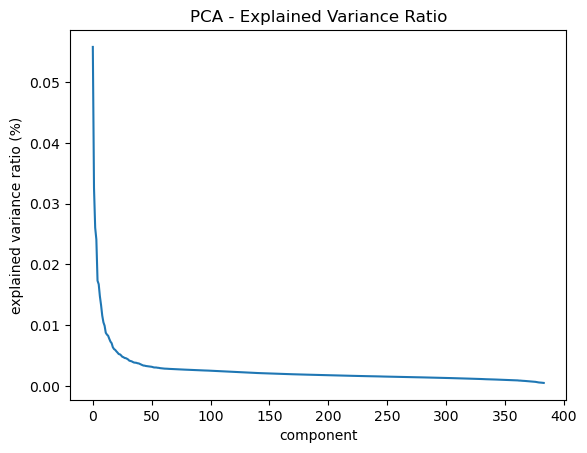

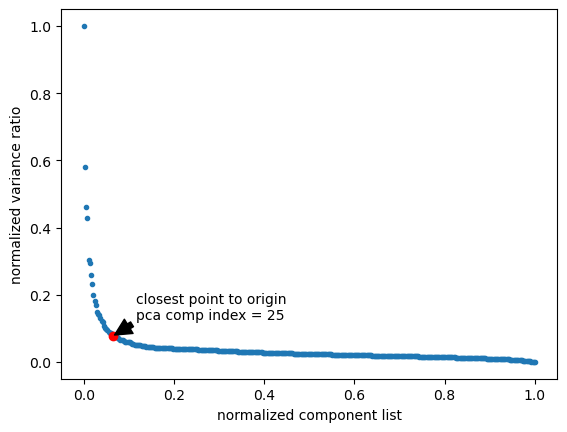

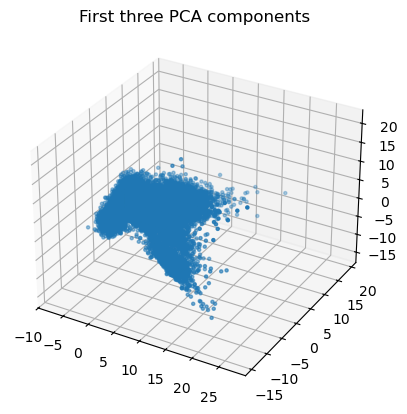

In [668]:
log_std_arr = amy_sd_gaba_ce_ge_cv_ls.values.T
pca_index, arr_pca, status_df = dp.analyze_pca(arr = log_std_arr, #log_std_arr
                                               n_components=log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

In [670]:
meta_data_df_pca = amy_sd_md_gaba_ce_ge_cv_ls.T.copy()
vars_use = ['dataset']
ho = hm.run_harmony(arr_pca,meta_data_df_pca,vars_use,max_iter_harmony=20)

2024-11-30 10:37:31,535 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-30 10:37:33,498 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-30 10:37:33,597 - harmonypy - INFO - Iteration 1 of 20
2024-11-30 10:37:40,650 - harmonypy - INFO - Iteration 2 of 20
2024-11-30 10:37:47,732 - harmonypy - INFO - Iteration 3 of 20
2024-11-30 10:37:54,788 - harmonypy - INFO - Iteration 4 of 20
2024-11-30 10:38:01,764 - harmonypy - INFO - Iteration 5 of 20
2024-11-30 10:38:08,660 - harmonypy - INFO - Iteration 6 of 20
2024-11-30 10:38:13,644 - harmonypy - INFO - Iteration 7 of 20
2024-11-30 10:38:17,644 - harmonypy - INFO - Iteration 8 of 20
2024-11-30 10:38:21,664 - harmonypy - INFO - Iteration 9 of 20
2024-11-30 10:38:25,315 - harmonypy - INFO - Iteration 10 of 20
2024-11-30 10:38:29,361 - harmonypy - INFO - Converged after 10 iterations


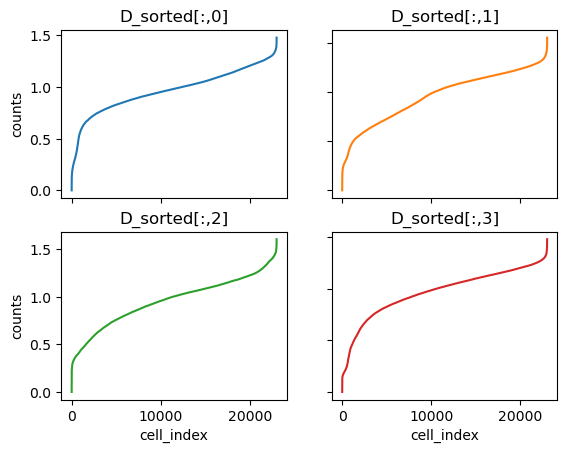

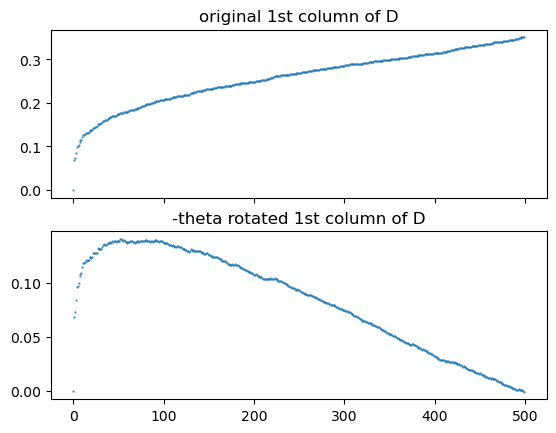

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 51.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


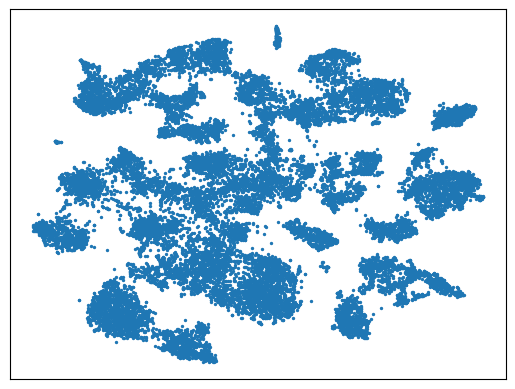

In [671]:
amy_sd_gaba_hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = amy_sd_gaba_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

amy_sd_gaba_arr_tsne,status_df = dp.do_tsne(arr = amy_sd_gaba_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

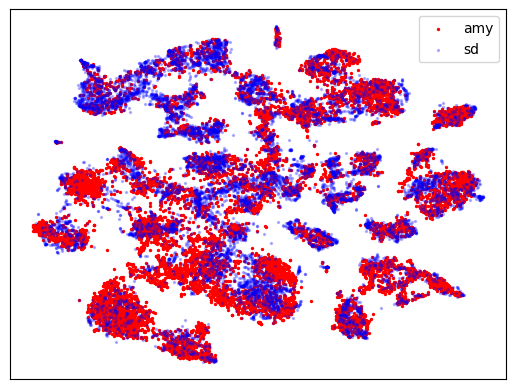

In [712]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_gaba_arr_tsne[:,0]
y = amy_sd_gaba_arr_tsne[:,1]
#ax.scatter(x,y,s=2)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=1)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=0.25)


ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/gaba/tsne_overlay_sd_on_amy.pdf')
plt.show()

In [675]:
x = amy_sd_gaba_arr_tsne[:,0]
y = amy_sd_gaba_arr_tsne[:,1]
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
#combine into 2D array
arr_xy_amy_gaba = np.vstack([x_amy,y_amy])

x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
arr_xy_sd_gaba = np.vstack([x_sd,y_sd])

In [680]:
arr_xy_amy_gaba.shape

(2, 13006)

In [681]:
arr_xy_sd_gaba.shape

(2, 10014)

In [685]:
#prepare label transferred version of sd_metadata_df
sd_gaba_md_w_amc = sd_gaba_md.copy()
amy_markers = pd.DataFrame(index = ['amy_markers'], columns = sd_gaba_md_w_amc.columns)
amy_class = pd.DataFrame(index = ['amy_class'], columns = sd_gaba_md_w_amc.columns)
amy_full_name = pd.DataFrame(index = ['amy_full_name'], columns = sd_gaba_md_w_amc.columns)

sd_gaba_md_w_amc = pd.concat([sd_gaba_md_w_amc,amy_class])
sd_gaba_md_w_amc = pd.concat([sd_gaba_md_w_amc,amy_markers])
sd_gaba_md_w_amc = pd.concat([sd_gaba_md_w_amc,amy_full_name])


sd_gaba_md_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,TCGGGTGGTGGCTAGA-1_10X36_1,CAGGCCATCGCACGAC-1_10X35_1,CATCCACAGATCACCT-1_10X38_2,TTCACCGCAAGCGAGT-1_10X51_2,AGAAATGCAATCCTTT-1_10X52_1,TCAGCAACAGTTGAAA-1_10X52_4,GGGCTCAGTTCAGCTA-1_10X52_2,CTCCGATAGTCCCGGT-1_10X38_1,TTTCACAGTGATAGAT-1_10X35_2,TTCATTGTCCACACAA-1_10X38_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_markers,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [676]:
amy_gaba_md

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TTGAGTGAGACCTCCG-1_76-1,AGTCACAAGCCAGTAG-1_76-2,CCTAAGATCCGTGTAA-1_76-2,CTTCCGATCCTGTTAT-1_76-2,GTTACAGAGGTCGTCC-1_76-2,TACCGAATCTGCCTCA-1_76-2,TAGACTGTCGGACTTA-1_76-2,TCTTAGTAGCAAGTGC-1_76-2,TGCATCCTCTGTCCCA-1_76-2,TGGGATTCATCCGAAT-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73,Sncg-Krt73
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73,GABA-56-Sncg-Krt73
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [686]:
sd_gaba_md_w_amc = cluster_transfer_majority_vote(arr_xy_sd_gaba,arr_xy_amy_gaba,distance_threshold,sd_gaba_md_w_amc,amy_gaba_md)
sd_gaba_md_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,TCGGGTGGTGGCTAGA-1_10X36_1,CAGGCCATCGCACGAC-1_10X35_1,CATCCACAGATCACCT-1_10X38_2,TTCACCGCAAGCGAGT-1_10X51_2,AGAAATGCAATCCTTT-1_10X52_1,TCAGCAACAGTTGAAA-1_10X52_4,GGGCTCAGTTCAGCTA-1_10X52_2,CTCCGATAGTCCCGGT-1_10X38_1,TTTCACAGTGATAGAT-1_10X35_2,TTCATTGTCCACACAA-1_10X38_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,no neighbors,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_markers,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Pax6-Th,Chat-Vip,Chat-Vip,Vip-Crh,...,Cbln4-Sst,no neighbors,Cbln4-Sst,Cbln4-Sst,Cbln4-Sst,Cbln4-Sst,Sst-Tmtc4,Cbln4-Sst,Sst-Tmtc4,Cbln4-Sst
amy_full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [689]:
def cluster_transfers_2_class_and_fn(sd_metadata_df_subset_w_amc, amy_metadata_df_subset):
    '''takes output of cluster_transfer_majority_vote and uses amy_metadata to map cluster 
    transferred labels to class and full name'''    
    _, idx = np.unique(amy_metadata_df_subset.loc['markers'], return_index=True)
    am = np.array(amy_metadata_df_subset.loc['markers'][np.sort(idx)])

    _, idx = np.unique(amy_metadata_df_subset.loc['full_name'], return_index=True)
    afn = np.array(amy_metadata_df_subset.loc['full_name'][np.sort(idx)])

    am_2_afn_dict = dict(zip(am,afn))

    #add case handeling for no majority or no neighbors (set full name to the same thing)
    am_2_afn_dict['no majority ct'] = 'no majority ct'
    am_2_afn_dict['no neighbors'] = 'no neighbors'

    fn_transferred = []
    for x in sd_metadata_df_subset_w_amc.loc['amy_markers']: 
        fn_transferred.append(am_2_afn_dict[x])

    sd_metadata_df_subset_w_amc.loc['amy_full_name'] = fn_transferred

    #and finally, fill amy_class row using first part of amy_full_name
    sd_metadata_df_subset_w_amc.loc['amy_class'] = [x.split('-')[0] for x in sd_metadata_df_subset_w_amc.loc['amy_full_name']]

    return sd_metadata_df_subset_w_amc



In [704]:
sd_gaba_md_w_amc = thc.cluster_transfers_2_class_and_fn(sd_gaba_md_w_amc,amy_gaba_md)

AttributeError: module 'sd_v_amy_tsne_harmony_comp' has no attribute 'cluster_transfers_2_class_and_fn'

In [691]:
sd_gaba_md_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,TCGGGTGGTGGCTAGA-1_10X36_1,CAGGCCATCGCACGAC-1_10X35_1,CATCCACAGATCACCT-1_10X38_2,TTCACCGCAAGCGAGT-1_10X51_2,AGAAATGCAATCCTTT-1_10X52_1,TCAGCAACAGTTGAAA-1_10X52_4,GGGCTCAGTTCAGCTA-1_10X52_2,CTCCGATAGTCCCGGT-1_10X38_1,TTTCACAGTGATAGAT-1_10X35_2,TTCATTGTCCACACAA-1_10X38_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1,BC048546-Dlx1
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1,GABA-50-BC048546-Dlx1
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,no neighbors,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
amy_markers,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Pax6-Th,Chat-Vip,Chat-Vip,Vip-Crh,...,Cbln4-Sst,no neighbors,Cbln4-Sst,Cbln4-Sst,Cbln4-Sst,Cbln4-Sst,Sst-Tmtc4,Cbln4-Sst,Sst-Tmtc4,Cbln4-Sst
amy_full_name,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-6-Pax6-Th,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-51-Vip-Crh,...,GABA-26-Cbln4-Sst,no neighbors,GABA-26-Cbln4-Sst,GABA-26-Cbln4-Sst,GABA-26-Cbln4-Sst,GABA-26-Cbln4-Sst,GABA-38-Sst-Tmtc4,GABA-26-Cbln4-Sst,GABA-38-Sst-Tmtc4,GABA-26-Cbln4-Sst


In [705]:
_, idx = np.unique(sd_gaba_md_w_amc.loc['full_name'], return_index=True)
sd_gaba_fn = np.array(sd_gaba_md_w_amc.loc['full_name'][np.sort(idx)])
_, idx = np.unique(sd_gaba_md_w_amc.loc['amy_full_name'], return_index=True)
amy_gaba_fn = np.array(sd_gaba_md_w_amc.loc['amy_full_name'][np.sort(idx)])

/tmp/ipykernel_2519638/2421502829.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_gaba_fn = np.array(sd_gaba_md_w_amc.loc['full_name'][np.sort(idx)])
/tmp/ipykernel_2519638/2421502829.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_gaba_fn = np.array(sd_gaba_md_w_amc.loc['amy_full_name'][np.sort(idx)])


In [706]:
sd_gaba_fn

array(['GABA-1-Chat-Isl1', 'GABA-2-Sncg-Htr3a', 'GABA-3-Vip-Cbln2',
       'GABA-4-Cpne4-Pde3a', 'GABA-5-Reln-Ndnf', 'GABA-6-Dab1-Nfib',
       'GABA-7-Kit-Pdlim5', 'GABA-8-Hcrtr2-Id2', 'GABA-9-Pthlh-Pvalb',
       'GABA-10-Rbp4-Kitl', 'GABA-11-Moxd1-Vwc2', 'GABA-12-Maf-Mafb',
       'GABA-13-Npy-Sst', 'GABA-14-Spon1-Tox', 'GABA-15-Gm28884-Fam159b',
       'GABA-16-St18-Gm17660', 'GABA-17-Calcr-Peg10',
       'GABA-18-Prlr-Pde1c', 'GABA-19-Cbln1-Grp', 'GABA-20-Tmem100',
       'GABA-21-Unc13c-Crtac1', 'GABA-22-Igfbp6-Rprm',
       'GABA-23-Wfs1-Prok2', 'GABA-24-Jsrp1-Col18a1', 'GABA-25-Lpl',
       'GABA-26-Rmst-Mgat4c', 'GABA-27-Oprk1-Trhde', 'GABA-28-Lmo1-Chn2',
       'GABA-29-Gal-Asb4', 'GABA-30-Igsf1-A230065H16Rik',
       'GABA-31-Foxp2-Gpr88', 'GABA-32-Npy2r', 'GABA-33-Nwd2',
       'GABA-34-Lypd1', 'GABA-35-Hs3st4-Car10', 'GABA-36-BC039966-Ngb',
       'GABA-37-Col23a1', 'GABA-38-Col6a1', 'GABA-39-Myh7',
       'GABA-40-Htr1f-Tshz1', 'GABA-41-Col11a1-Pde11a',
       'GABA-42-Pa

In [707]:
amy_gaba_fn

array(['GABA-50-Chat-Vip', 'GABA-6-Pax6-Th', 'GABA-51-Vip-Crh',
       'no neighbors', 'GABA-56-Sncg-Krt73', 'GABA-55-Sncg-Vip',
       'GABA-54-Scng-Kcnc2', 'GABA-53-Htr3a-Kcnc2', 'no majority ct',
       'GABA-47-Reln-Ndnf', 'GABA-52-Calb2-Rgs12', 'GABA-49-Npnt-Calca',
       'GABA-46-Lamp5-Kit', 'GABA-48-Reln-Crim1', 'GABA-45-Lamp5-Hctr2',
       'GABA-44-Pthlh-Pvalb', 'GABA-41-Moxd1-Pvalb', 'GABA-40-Rpb4-Sst',
       'GABA-39-Sst-Nek7', 'GABA-42-Moxd1-Vwc2', 'GABA-37-Sst-Npy',
       'GABA-43-Crabp1-Etv1', 'GABA-38-Sst-Tmtc4', 'GABA-35-Chodl-Moxd1',
       'GABA-36-Sst-Fign', 'GABA-34-Prlr-Satb1', 'GABA-33-Prlr-St18',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-9-Prkcd-Ezr', 'GABA-20-Gpr101-Gabre',
       'GABA-24-Fign-Ucn3', 'GABA-27-Lhx6-Nxph2', 'GABA-8-Prkcd-Oprk1',
       'GABA-12-Adora2a-Scn4b', 'GABA-23-Fign-Lrpprc',
       'GABA-19-Isl1-Aldoc', 'GABA-16-Prkcd-Nts', 'GABA-11-Adora2a-Id4',
       'GABA-17-Pdyn-Ebf1

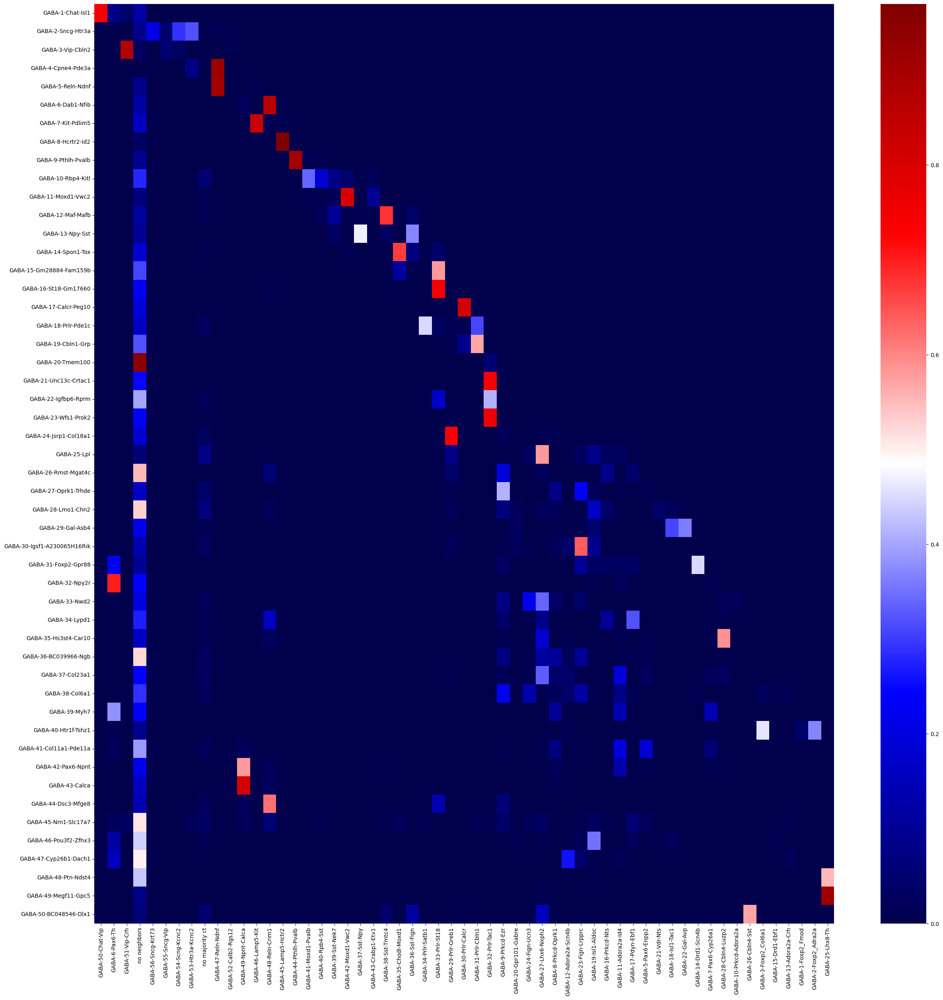

In [710]:
frac_gaba_fn = pd.DataFrame(index=sd_gaba_fn, columns=amy_gaba_fn)

for i,sd_m in enumerate(sd_gaba_fn):
    for j,amy_m in enumerate(amy_gaba_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_gaba_md_w_amc.loc[:,sd_gaba_md_w_amc.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_gaba_fn.loc[sd_m,amy_m] = frac
%matplotlib inline
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_gaba_fn.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/frac_gaba_amy_cts_in_sd_cts_heatmap_full_names.pdf')
plt.show()

In [715]:
frac_gaba_fn.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/gaba/frac_gaba_fn.feather')
sd_gaba_md_w_amc.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/gaba/sd_gaba_md_w_amc.json')
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/gaba/amy_sd_gaba_arr_tsne.npy',amy_sd_gaba_arr_tsne)
meta_data_df_pca.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/gaba/meta_data_df_pca.feather')

## Repeat for vglut1

running FS...
Total cells reduced from 11947 to 11947
Total genes reduced from 27874 to 13757


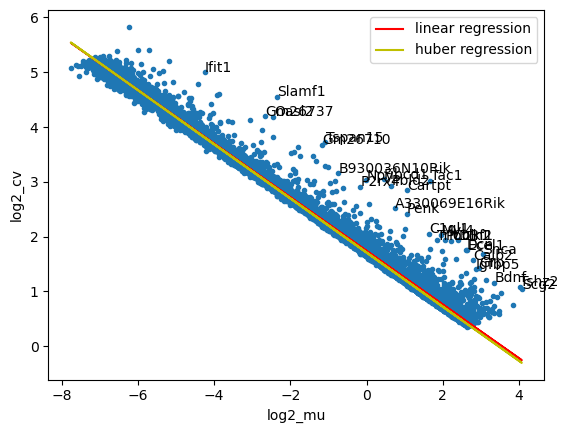

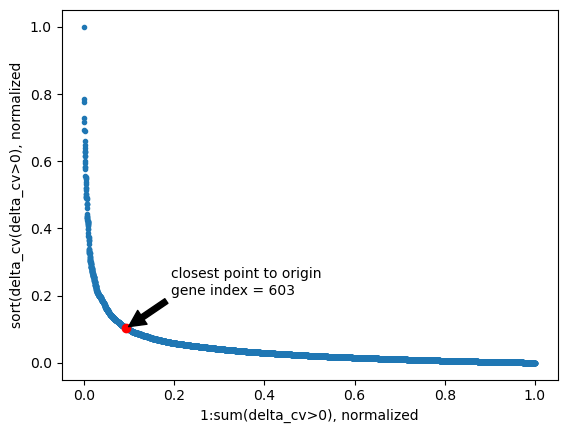

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Total cells reduced from 9537 to 9537
Total genes reduced from 27874 to 13928


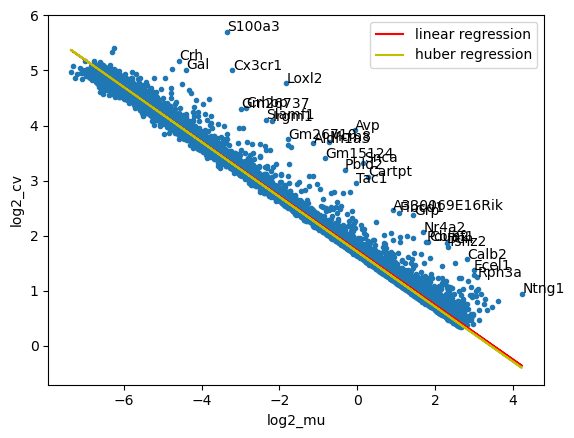

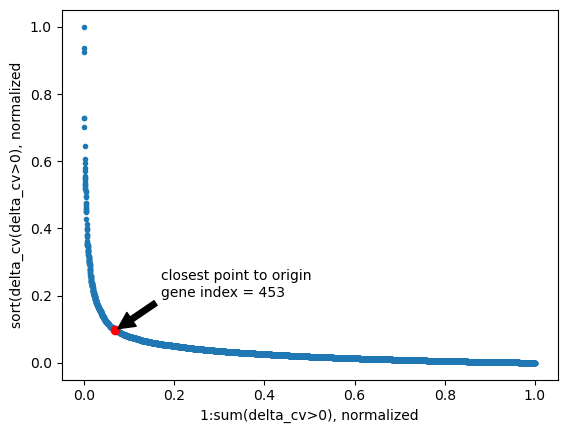

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
running PCA..


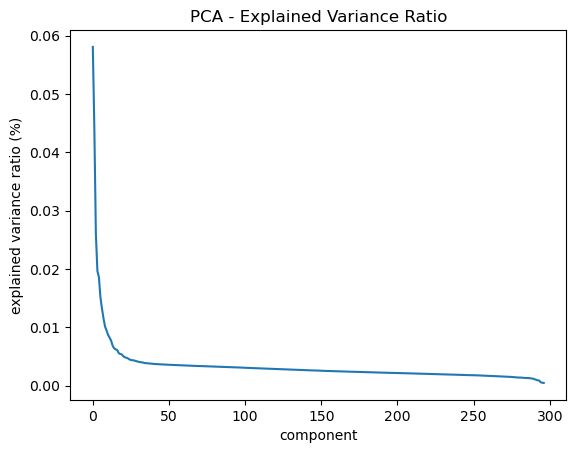

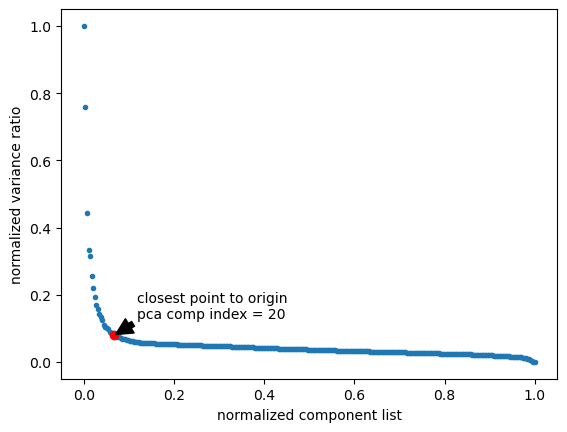

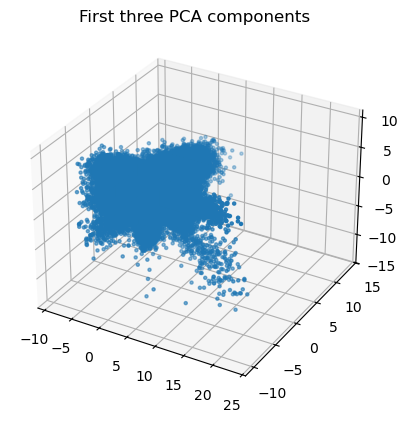

2024-11-30 14:39:42,815 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


running harmony..


2024-11-30 14:39:44,640 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-30 14:39:44,733 - harmonypy - INFO - Iteration 1 of 20
2024-11-30 14:39:49,971 - harmonypy - INFO - Iteration 2 of 20
2024-11-30 14:39:55,175 - harmonypy - INFO - Iteration 3 of 20
2024-11-30 14:40:00,399 - harmonypy - INFO - Iteration 4 of 20
2024-11-30 14:40:05,750 - harmonypy - INFO - Iteration 5 of 20
2024-11-30 14:40:12,222 - harmonypy - INFO - Iteration 6 of 20
2024-11-30 14:40:15,963 - harmonypy - INFO - Iteration 7 of 20
2024-11-30 14:40:21,028 - harmonypy - INFO - Iteration 8 of 20
2024-11-30 14:40:25,909 - harmonypy - INFO - Iteration 9 of 20
2024-11-30 14:40:29,582 - harmonypy - INFO - Iteration 10 of 20
2024-11-30 14:40:32,378 - harmonypy - INFO - Iteration 11 of 20
2024-11-30 14:40:35,385 - harmonypy - INFO - Iteration 12 of 20
2024-11-30 14:40:38,191 - harmonypy - INFO - Converged after 12 iterations


running tsne..


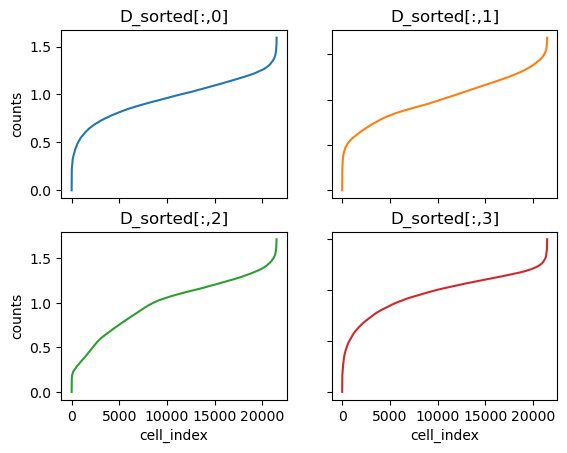

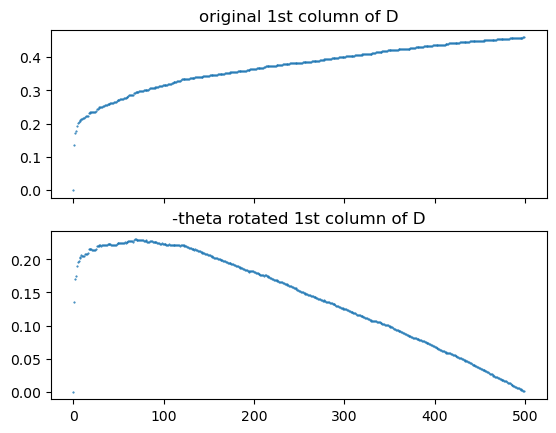

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 57.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


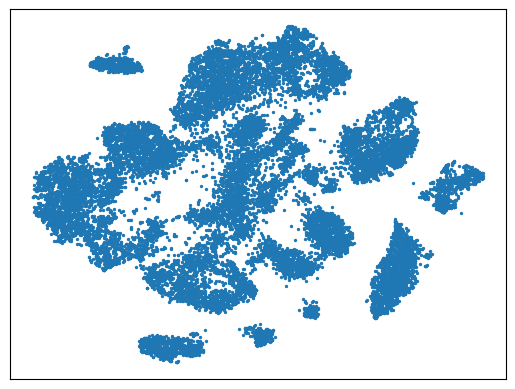

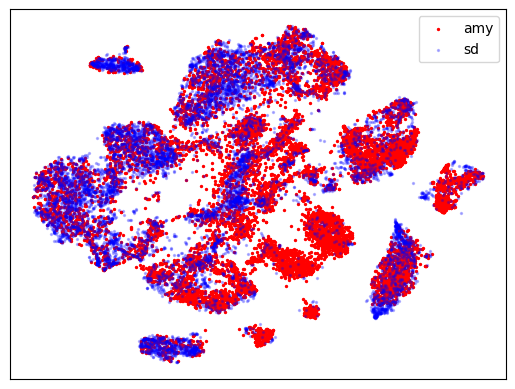

running label transfer..


/tmp/ipykernel_2519638/2675756911.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  am = np.array(amy_metadata_df_subset.loc['markers'][np.sort(idx)])
/tmp/ipykernel_2519638/2675756911.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  afn = np.array(amy_metadata_df_subset.loc['full_name'][np.sort(idx)])
/tmp/ipykernel_2519638/27259181.py:155: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_vglut1_fn = np.array(sd_vglut1_md_w_am

running corr results from laber transfer..


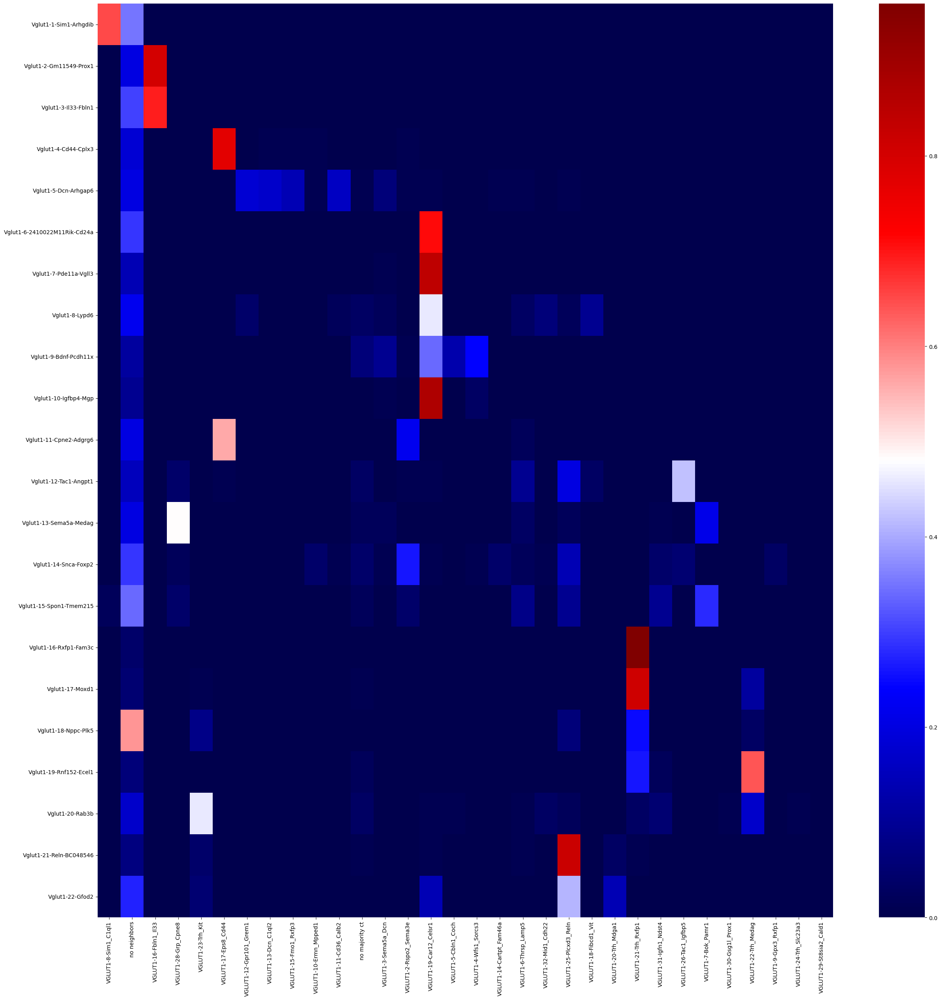

saving files..


In [719]:
%matplotlib inline

with open ('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset.json') as json_data:
    amy_metadata_df_subset = json.load(json_data)
amy_metadata_df_subset = pd.DataFrame.from_dict(amy_metadata_df_subset, orient='columns')

amy_vglut1_md = amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['cell_class']=='VGLUT1']
amy_vglut1 = amy_df.reindex(columns = amy_vglut1_md.columns)

sd_vglut1_md = sd_metadata_df_subset.loc[:,sd_metadata_df_subset.loc['cell_class']=='Vglut1']
sd_vglut1 = sd_df.reindex(columns = sd_vglut1_md.columns)

amy_vglut1 = amy_vglut1.astype('int')

print ('running FS...')
#process using standard workflow/functions from dimorph_processing.py
amy_vglut1_bool = amy_vglut1.mask(amy_vglut1>0, other = 1)
status_df = dp.intialize_status_df()
amy_vglut1_ce, amy_vglut1_bool, amy_vglut1_md, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = amy_vglut1_md,
                                                      df_bool = amy_vglut1_bool,
                                                      df = amy_vglut1,
                                                      status_df = status_df)
amy_vglut1_ce_ge, amy_vglut1_bool, amy_vglut1_md, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=amy_vglut1_bool,
                                                 df = amy_vglut1_ce,
                                                 meta_data_df = amy_vglut1_md,
                                                 status_df = status_df)

amy_vglut1_cv_df = dp.analyze_cv(df = amy_vglut1_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
amy_gene_index, amy_vglut1_ce_ge_cv, status_df = dp.get_top_cv_genes(df = amy_vglut1_ce_ge, cv_df=amy_vglut1_cv_df, plot_flag=1, status_df=status_df)
amy_vglut1_cv_ls_arr,status_df = dp.log_and_standerdize_df(amy_vglut1_ce_ge_cv,status_df)
amy_vglut1_ce_ge_cv_ls = pd.DataFrame(data=amy_vglut1_cv_ls_arr.T, index=amy_vglut1_ce_ge_cv.index, columns=amy_vglut1_ce_ge_cv.columns)

sd_vglut1 = sd_vglut1.astype('int')
#process using standard workflow/functions from dimorph_processing.py
sd_vglut1_bool = sd_vglut1.mask(sd_vglut1>0, other = 1)
status_df = dp.intialize_status_df()
sd_vglut1_ce, sd_vglut1_bool, sd_vglut1_md, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = sd_vglut1_md,
                                                      df_bool = sd_vglut1_bool,
                                                      df = sd_vglut1,
                                                      status_df = status_df)
sd_vglut1_ce_ge, sd_vglut1_bool, sd_vglut1_md, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=sd_vglut1_bool,
                                                 df = sd_vglut1_ce,
                                                 meta_data_df = sd_vglut1_md,
                                                 status_df = status_df)

sd_vglut1_cv_df = dp.analyze_cv(df = sd_vglut1_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
sd_gene_index, sd_vglut1_ce_ge_cv, status_df = dp.get_top_cv_genes(df = sd_vglut1_ce_ge, cv_df=sd_vglut1_cv_df, plot_flag=1, status_df=status_df)
sd_vglut1_cv_ls_arr,status_df = dp.log_and_standerdize_df(sd_vglut1_ce_ge_cv,status_df)
sd_vglut1_ce_ge_cv_ls = pd.DataFrame(data=sd_vglut1_cv_ls_arr.T, index=sd_vglut1_ce_ge_cv.index, columns=sd_vglut1_ce_ge_cv.columns)

#get intersection and concat
intersected_gene_ind_cv = amy_vglut1_ce_ge_cv_ls.index.intersection(sd_vglut1_ce_ge_cv_ls.index)
amy_vglut1_ce_ge_cv_ls = amy_vglut1_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)
sd_vglut1_ce_ge_cv_ls = sd_vglut1_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)
amy_sd_vglut1_ce_ge_cv_ls = pd.concat([amy_vglut1_ce_ge_cv_ls,sd_vglut1_ce_ge_cv_ls], axis = 1)

amy_sd_md_vglut1_ce_ge_cv_ls = pd.concat([amy_vglut1_md,sd_vglut1_md],axis=1)

print ('running PCA..')
#run pca
log_std_arr = amy_sd_vglut1_ce_ge_cv_ls.values.T
pca_index, arr_pca, status_df = dp.analyze_pca(arr = log_std_arr, #log_std_arr
                                               n_components=log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

meta_data_df_pca = amy_sd_md_vglut1_ce_ge_cv_ls.T.copy()


print ('running harmony..')
#run harmony
vars_use = ['dataset']
ho = hm.run_harmony(arr_pca,meta_data_df_pca,vars_use,max_iter_harmony=20)

print ('running tsne..')
#run tsne
amy_sd_vglut1_hm_arr = ho.Z_corr.T
perplexity,status_df = dp.get_perplexity(pca_arr = amy_sd_vglut1_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)
amy_sd_vglut1_arr_tsne,status_df = dp.do_tsne(arr = amy_sd_vglut1_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

fig,ax = plt.subplots()
#all pts
x = amy_sd_vglut1_arr_tsne[:,0]
y = amy_sd_vglut1_arr_tsne[:,1]
#ax.scatter(x,y,s=2)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=1)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=0.25)


ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut1/tsne_overlay_sd_on_amy.pdf')
plt.show()

x = amy_sd_vglut1_arr_tsne[:,0]
y = amy_sd_vglut1_arr_tsne[:,1]
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
#combine into 2D array
arr_xy_amy_vglut1 = np.vstack([x_amy,y_amy])

x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
arr_xy_sd_vglut1 = np.vstack([x_sd,y_sd])

#prepare label transferred version of sd_metadata_df
sd_vglut1_md_w_amc = sd_vglut1_md.copy()
amy_markers = pd.DataFrame(index = ['amy_markers'], columns = sd_vglut1_md_w_amc.columns)
amy_class = pd.DataFrame(index = ['amy_class'], columns = sd_vglut1_md_w_amc.columns)
amy_full_name = pd.DataFrame(index = ['amy_full_name'], columns = sd_vglut1_md_w_amc.columns)

sd_vglut1_md_w_amc = pd.concat([sd_vglut1_md_w_amc,amy_class])
sd_vglut1_md_w_amc = pd.concat([sd_vglut1_md_w_amc,amy_markers])
sd_vglut1_md_w_amc = pd.concat([sd_vglut1_md_w_amc,amy_full_name])

print ('running label transfer..')
sd_vglut1_md_w_amc = cluster_transfer_majority_vote(arr_xy_sd_vglut1,arr_xy_amy_vglut1,distance_threshold,sd_vglut1_md_w_amc,amy_vglut1_md)
sd_vglut1_md_w_amc = cluster_transfers_2_class_and_fn(sd_vglut1_md_w_amc,amy_vglut1_md)

_, idx = np.unique(sd_vglut1_md_w_amc.loc['full_name'], return_index=True)
sd_vglut1_fn = np.array(sd_vglut1_md_w_amc.loc['full_name'][np.sort(idx)])
_, idx = np.unique(sd_vglut1_md_w_amc.loc['amy_full_name'], return_index=True)
amy_vglut1_fn = np.array(sd_vglut1_md_w_amc.loc['amy_full_name'][np.sort(idx)])

frac_vglut1_fn = pd.DataFrame(index=sd_vglut1_fn, columns=amy_vglut1_fn)

print ('running corr results from laber transfer..')
for i,sd_m in enumerate(sd_vglut1_fn):
    for j,amy_m in enumerate(amy_vglut1_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_vglut1_md_w_amc.loc[:,sd_vglut1_md_w_amc.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_vglut1_fn.loc[sd_m,amy_m] = frac
%matplotlib inline
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_vglut1_fn.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut1/frac_vglut1_amy_cts_in_sd_cts_heatmap_full_names.pdf')
plt.show()

print ('saving files..')
frac_vglut1_fn.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut1/frac_vglut1_fn.feather')
sd_vglut1_md_w_amc.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut1/sd_vglut1_md_w_amc.json')
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut1/amy_sd_vglut1_arr_tsne.npy',amy_sd_vglut1_arr_tsne)
meta_data_df_pca.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut1/meta_data_df_pca.feather')


In [836]:
list(np.unique(amy_metadata_df_subset.loc['cell_class']))

['GABA', 'Nonneuronal', 'Pappa2-Cd34', 'VGLUT1', 'VGLUT2']

In [833]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [ ]:
amy_metadata_df_dd_order.loc[:,amy_metadata_df_dd_order.loc[:,'celltype']=='VGLUT2-Cd']

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,


running FS...
Total cells reduced from 5231 to 5231
Total genes reduced from 27874 to 12720


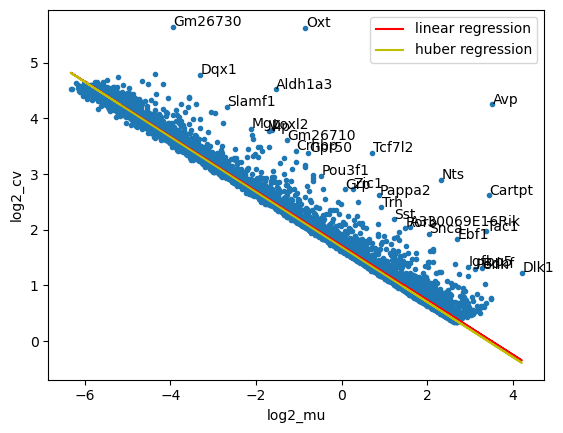

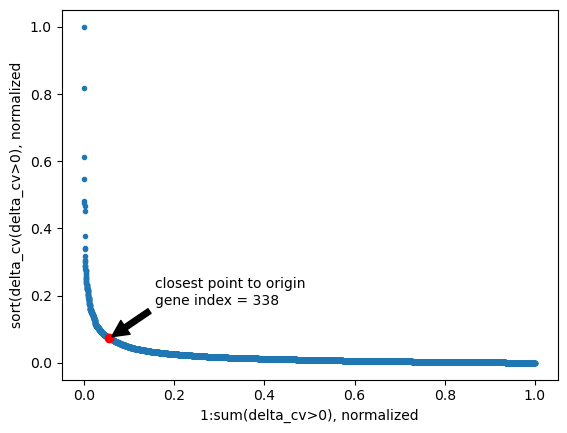

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Total cells reduced from 5274 to 5274
Total genes reduced from 27874 to 12936


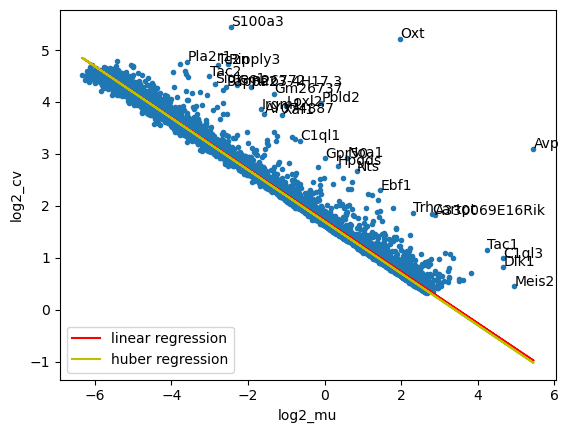

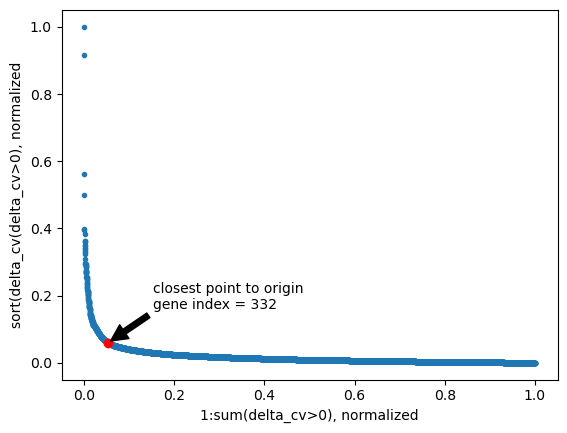

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
running PCA..


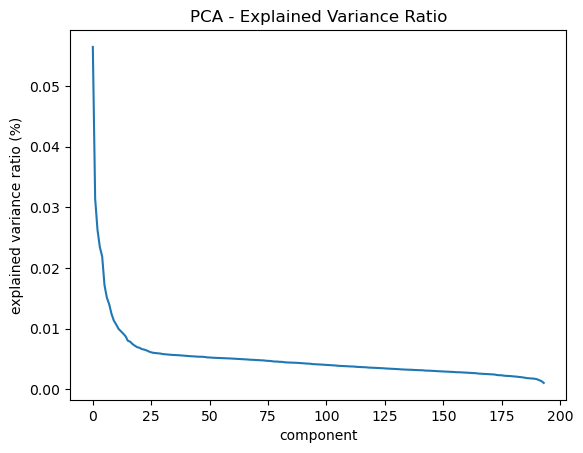

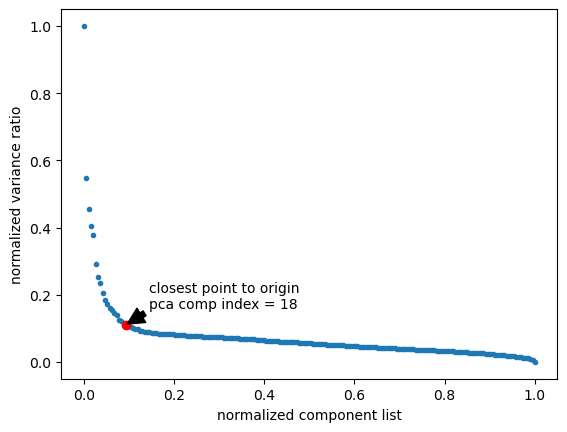

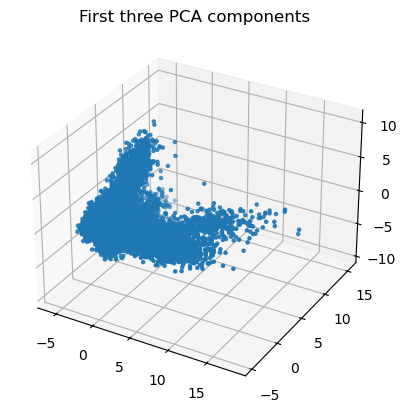

2024-12-01 14:48:01,825 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


running harmony..


2024-12-01 14:48:02,977 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-01 14:48:03,016 - harmonypy - INFO - Iteration 1 of 20
2024-12-01 14:48:05,245 - harmonypy - INFO - Iteration 2 of 20
2024-12-01 14:48:07,485 - harmonypy - INFO - Iteration 3 of 20
2024-12-01 14:48:09,732 - harmonypy - INFO - Iteration 4 of 20
2024-12-01 14:48:11,562 - harmonypy - INFO - Iteration 5 of 20
2024-12-01 14:48:12,754 - harmonypy - INFO - Iteration 6 of 20
2024-12-01 14:48:14,343 - harmonypy - INFO - Iteration 7 of 20
2024-12-01 14:48:15,331 - harmonypy - INFO - Iteration 8 of 20
2024-12-01 14:48:16,274 - harmonypy - INFO - Iteration 9 of 20
2024-12-01 14:48:17,263 - harmonypy - INFO - Converged after 9 iterations


running tsne..


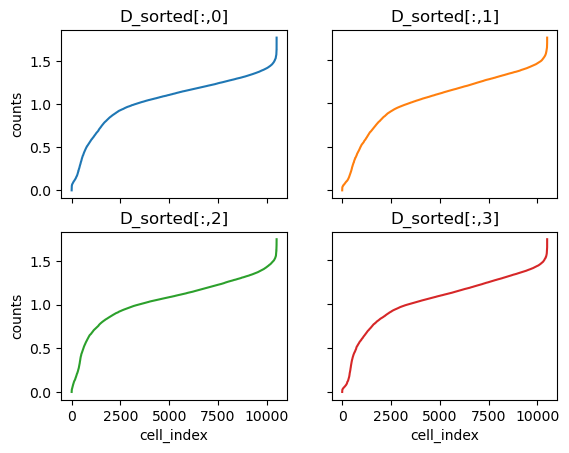

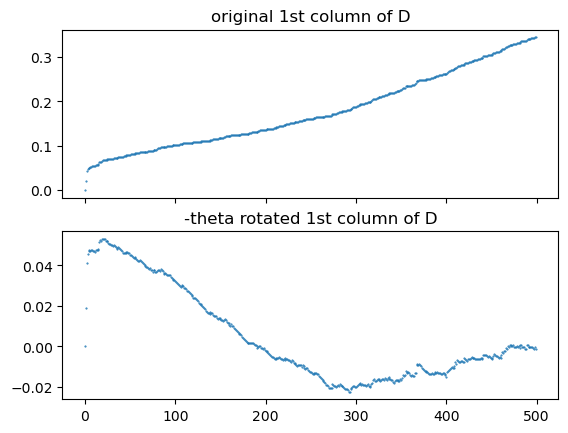

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 56.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


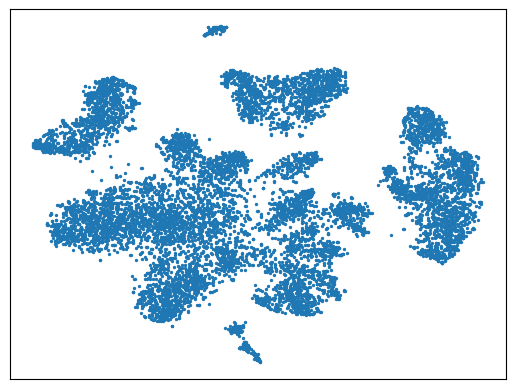

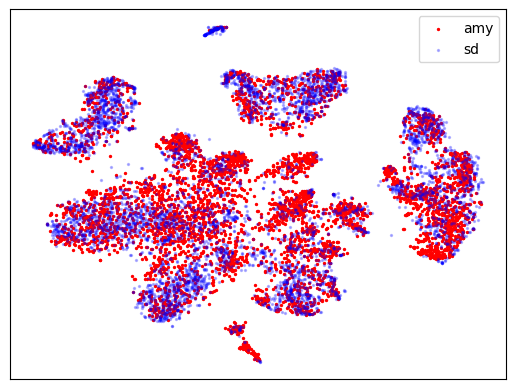

running label transfer..


/tmp/ipykernel_2519638/2675756911.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  am = np.array(amy_metadata_df_subset.loc['markers'][np.sort(idx)])
/tmp/ipykernel_2519638/2675756911.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  afn = np.array(amy_metadata_df_subset.loc['full_name'][np.sort(idx)])
/tmp/ipykernel_2519638/1267016512.py:155: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_vglut2_fn = np.array(sd_vglut2_md_w_

running corr results from laber transfer..


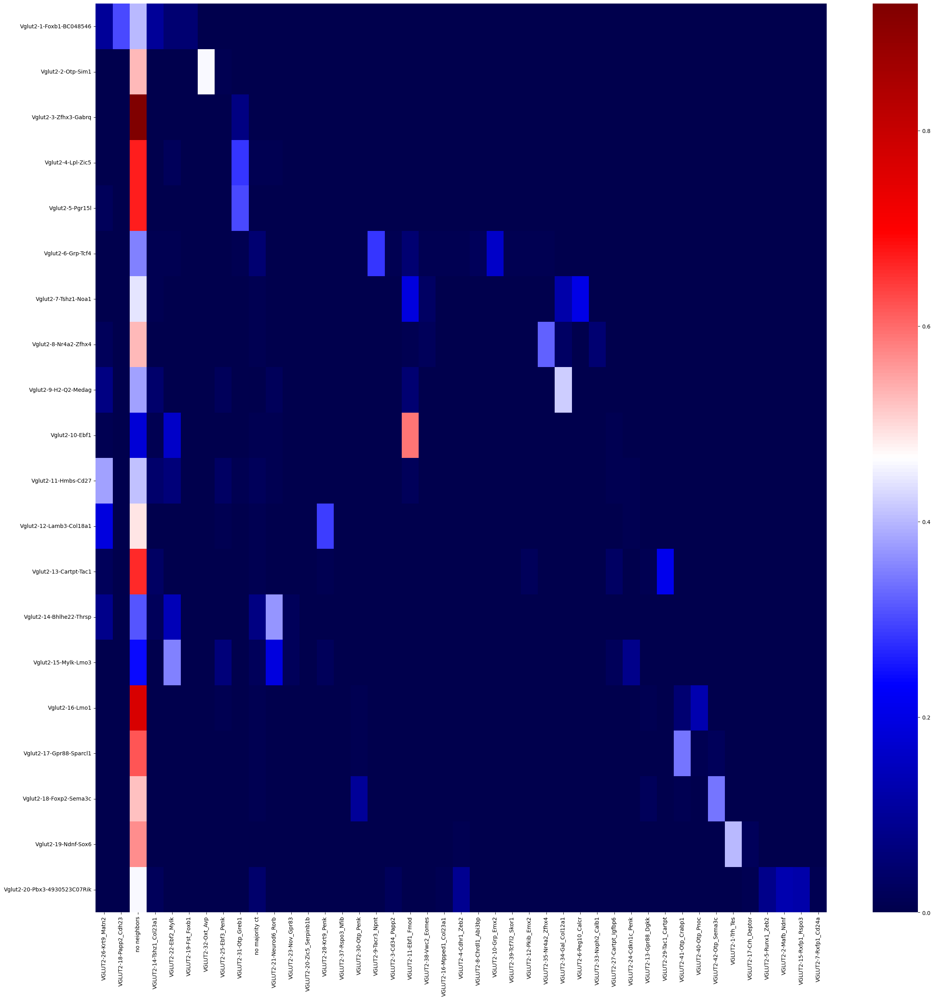

saving files..


In [861]:
%matplotlib inline

with open ('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset.json') as json_data:
    amy_metadata_df_subset = json.load(json_data)
amy_metadata_df_subset = pd.DataFrame.from_dict(amy_metadata_df_subset, orient='columns')

amy_vglut2_md = amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['cell_class']=='VGLUT2']
amy_vglut2 = amy_df.reindex(columns = amy_vglut2_md.columns)

sd_vglut2_md = sd_metadata_df_subset.loc[:,sd_metadata_df_subset.loc['cell_class']=='Vglut2']
sd_vglut2 = sd_df.reindex(columns = sd_vglut2_md.columns)

amy_vglut2 = amy_vglut2.astype('int')

print ('running FS...')
#process using standard workflow/functions from dimorph_processing.py
amy_vglut2_bool = amy_vglut2.mask(amy_vglut2>0, other = 1)
status_df = dp.intialize_status_df()
amy_vglut2_ce, amy_vglut2_bool, amy_vglut2_md, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = amy_vglut2_md,
                                                      df_bool = amy_vglut2_bool,
                                                      df = amy_vglut2,
                                                      status_df = status_df)
amy_vglut2_ce_ge, amy_vglut2_bool, amy_vglut2_md, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=amy_vglut2_bool,
                                                 df = amy_vglut2_ce,
                                                 meta_data_df = amy_vglut2_md,
                                                 status_df = status_df)

amy_vglut2_cv_df = dp.analyze_cv(df = amy_vglut2_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
amy_gene_index, amy_vglut2_ce_ge_cv, status_df = dp.get_top_cv_genes(df = amy_vglut2_ce_ge, cv_df=amy_vglut2_cv_df, plot_flag=1, status_df=status_df)
amy_vglut2_cv_ls_arr,status_df = dp.log_and_standerdize_df(amy_vglut2_ce_ge_cv,status_df)
amy_vglut2_ce_ge_cv_ls = pd.DataFrame(data=amy_vglut2_cv_ls_arr.T, index=amy_vglut2_ce_ge_cv.index, columns=amy_vglut2_ce_ge_cv.columns)

sd_vglut2 = sd_vglut2.astype('int')
#process using standard workflow/functions from dimorph_processing.py
sd_vglut2_bool = sd_vglut2.mask(sd_vglut2>0, other = 1)
status_df = dp.intialize_status_df()
sd_vglut2_ce, sd_vglut2_bool, sd_vglut2_md, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = sd_vglut2_md,
                                                      df_bool = sd_vglut2_bool,
                                                      df = sd_vglut2,
                                                      status_df = status_df)
sd_vglut2_ce_ge, sd_vglut2_bool, sd_vglut2_md, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=sd_vglut2_bool,
                                                 df = sd_vglut2_ce,
                                                 meta_data_df = sd_vglut2_md,
                                                 status_df = status_df)

sd_vglut2_cv_df = dp.analyze_cv(df = sd_vglut2_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
sd_gene_index, sd_vglut2_ce_ge_cv, status_df = dp.get_top_cv_genes(df = sd_vglut2_ce_ge, cv_df=sd_vglut2_cv_df, plot_flag=1, status_df=status_df)
sd_vglut2_cv_ls_arr,status_df = dp.log_and_standerdize_df(sd_vglut2_ce_ge_cv,status_df)
sd_vglut2_ce_ge_cv_ls = pd.DataFrame(data=sd_vglut2_cv_ls_arr.T, index=sd_vglut2_ce_ge_cv.index, columns=sd_vglut2_ce_ge_cv.columns)

#get intersection and concat
intersected_gene_ind_cv = amy_vglut2_ce_ge_cv_ls.index.intersection(sd_vglut2_ce_ge_cv_ls.index)
amy_vglut2_ce_ge_cv_ls = amy_vglut2_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)
sd_vglut2_ce_ge_cv_ls = sd_vglut2_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)
amy_sd_vglut2_ce_ge_cv_ls = pd.concat([amy_vglut2_ce_ge_cv_ls,sd_vglut2_ce_ge_cv_ls], axis = 1)

amy_sd_md_vglut2_ce_ge_cv_ls = pd.concat([amy_vglut2_md,sd_vglut2_md],axis=1)

print ('running PCA..')
#run pca
log_std_arr = amy_sd_vglut2_ce_ge_cv_ls.values.T
pca_index, arr_pca, status_df = dp.analyze_pca(arr = log_std_arr, #log_std_arr
                                               n_components=log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

meta_data_df_pca = amy_sd_md_vglut2_ce_ge_cv_ls.T.copy()


print ('running harmony..')
#run harmony
vars_use = ['dataset']
ho = hm.run_harmony(arr_pca,meta_data_df_pca,vars_use,max_iter_harmony=20)

print ('running tsne..')
#run tsne
amy_sd_vglut2_hm_arr = ho.Z_corr.T
perplexity,status_df = dp.get_perplexity(pca_arr = amy_sd_vglut2_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)
amy_sd_vglut2_arr_tsne,status_df = dp.do_tsne(arr = amy_sd_vglut2_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

fig,ax = plt.subplots()
#all pts
x = amy_sd_vglut2_arr_tsne[:,0]
y = amy_sd_vglut2_arr_tsne[:,1]
#ax.scatter(x,y,s=2)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=1)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=0.25)


ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut2/tsne_overlay_sd_on_amy.pdf')
plt.show()

x = amy_sd_vglut2_arr_tsne[:,0]
y = amy_sd_vglut2_arr_tsne[:,1]
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
#combine into 2D array
arr_xy_amy_vglut2 = np.vstack([x_amy,y_amy])

x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
arr_xy_sd_vglut2 = np.vstack([x_sd,y_sd])

#prepare label transferred version of sd_metadata_df
sd_vglut2_md_w_amc = sd_vglut2_md.copy()
amy_markers = pd.DataFrame(index = ['amy_markers'], columns = sd_vglut2_md_w_amc.columns)
amy_class = pd.DataFrame(index = ['amy_class'], columns = sd_vglut2_md_w_amc.columns)
amy_full_name = pd.DataFrame(index = ['amy_full_name'], columns = sd_vglut2_md_w_amc.columns)

sd_vglut2_md_w_amc = pd.concat([sd_vglut2_md_w_amc,amy_class])
sd_vglut2_md_w_amc = pd.concat([sd_vglut2_md_w_amc,amy_markers])
sd_vglut2_md_w_amc = pd.concat([sd_vglut2_md_w_amc,amy_full_name])

print ('running label transfer..')
sd_vglut2_md_w_amc = cluster_transfer_majority_vote(arr_xy_sd_vglut2,arr_xy_amy_vglut2,distance_threshold,sd_vglut2_md_w_amc,amy_vglut2_md)
sd_vglut2_md_w_amc = cluster_transfers_2_class_and_fn(sd_vglut2_md_w_amc,amy_vglut2_md)

_, idx = np.unique(sd_vglut2_md_w_amc.loc['full_name'], return_index=True)
sd_vglut2_fn = np.array(sd_vglut2_md_w_amc.loc['full_name'][np.sort(idx)])
_, idx = np.unique(sd_vglut2_md_w_amc.loc['amy_full_name'], return_index=True)
amy_vglut2_fn = np.array(sd_vglut2_md_w_amc.loc['amy_full_name'][np.sort(idx)])

frac_vglut2_fn = pd.DataFrame(index=sd_vglut2_fn, columns=amy_vglut2_fn)

print ('running corr results from laber transfer..')
for i,sd_m in enumerate(sd_vglut2_fn):
    for j,amy_m in enumerate(amy_vglut2_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_vglut2_md_w_amc.loc[:,sd_vglut2_md_w_amc.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_vglut2_fn.loc[sd_m,amy_m] = frac
%matplotlib inline
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_vglut2_fn.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut2/frac_vglut2_amy_cts_in_sd_cts_heatmap_full_names.pdf')
plt.show()

print ('saving files..')
frac_vglut2_fn.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut2/frac_vglut2_fn.feather')
sd_vglut2_md_w_amc.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut2/sd_vglut2_md_w_amc.json')
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut2/amy_sd_vglut2_arr_tsne.npy',amy_sd_vglut2_arr_tsne)
meta_data_df_pca.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut2/meta_data_df_pca.feather')


In [727]:
sd_vglut2_md_w_amc

,TGCGATATCAAGTGTC-1_10X51_4,GGAACCCAGGGCTGAT-1_10X52_4,AAGCATCAGCAATTAG-1_10X52_3,ACGGAAGAGTATTGCC-1_10X52_2,GAATCACCAGCCGTTG-1_10X51_2,TAAGTCGTCAATGCAC-1_10X51_4,TCGGGTGTCGTTCAGA-1_10X51_3,TGTGGCGTCCGTGGCA-1_10X35_2,GCGTTTCGTGGTACAG-1_10X36_1,GGTAATCAGGACTATA-1_10X51_1,...,AGGAAATTCACCTGTC-1_10X51_1,AGCGCTGAGCGGTAAC-1_10X35_2,TCCGGGAGTGTTCAGT-1_10X51_1,GATCATGTCACCGGTG-1_10X37_2,GAGTCATTCGACATTG-1_10X51_1,CACTGTCGTGACGTCC-1_10X38_1,CGAGGAAGTGTCTAAC-1_10X35_1,AGCCAATGTGTGTGGA-1_10X35_2,GCTGCAGTCGTAATGC-1_10X37_2,ATTCTTGAGTAGCCAG-1_10X36_1
cell_class,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Foxb1-BC048546,Foxb1-BC048546,Foxb1-BC048546,Foxb1-BC048546,Foxb1-BC048546,Foxb1-BC048546,Foxb1-BC048546,Foxb1-BC048546,Foxb1-BC048546,Foxb1-BC048546,...,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik
full_name,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,...,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,VGLUT2,VGLUT2,no neighbors,no neighbors,VGLUT2,no neighbors,VGLUT2,no neighbors,no neighbors,VGLUT2,...,VGLUT2,VGLUT2,no neighbors,no neighbors,no neighbors,no neighbors,VGLUT2,VGLUT2,VGLUT2,no neighbors
amy_markers,Krt9-Matn2,Zic5-Serpinb1b,no neighbors,no neighbors,Krt9-Matn2,no neighbors,Fst-Foxb1,no neighbors,no neighbors,Lxh1-Trp73,...,Mafb-Ndnf,Mafb-Ndnf,no neighbors,no neighbors,no neighbors,no neighbors,Mafb-Ndnf,Mafb-Ndnf,Rxfp1-Cd24a,no neighbors
amy_full_name,VGLUT2-26-Krt9_Matn2,VGLUT2-20-Zic5_Serpinb1b,no neighbors,no neighbors,VGLUT2-26-Krt9_Matn2,no neighbors,VGLUT2-19-Fst_Foxb1,no neighbors,no neighbors,VGLUT2-36-Lxh1_Trp73,...,VGLUT2-2-Mafb_Ndnf,VGLUT2-2-Mafb_Ndnf,no neighbors,no neighbors,no neighbors,no neighbors,VGLUT2-2-Mafb_Ndnf,VGLUT2-2-Mafb_Ndnf,VGLUT2-7-Rxfp1_Cd24a,no neighbors


In [728]:
amy_vglut2_md

,AAAGAACTCGCCTATC-1_08-1,AACGTCACAGCTGTGC-1_08-1,AAGTTCGAGACTGTTC-1_08-1,AGAAGTATCGGCATAT-1_08-1,AGATAGATCGTGAGAG-1_08-1,AGGACGAGTAATTAGG-1_08-1,AGGGTGAAGGTAAGAG-1_08-1,ATCCGTCCATTGTCGA-1_08-1,CACAGATAGGGTTGCA-1_08-1,CACTTCGCAGCTGCCA-1_08-1,...,ACTATTCTCAAGAGTA-1_76-2,AGTAACCGTAAGTTGA-1_76-2,ATTTACCGTTTCCAAG-1_76-2,GAAGTAAGTTCACCGG-1_76-2,GGTTAACCACAGAAGC-1_76-2,GTGATGTAGGTTTACC-1_76-2,TCATTCAGTGTTAAAG-1_76-2,TCCACGTCACTTCATT-1_76-2,TTACCGCGTCACAATC-1_76-2,TTTATGCCAGTATTCG-1_76-2
cell_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,...,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c
full_name,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,...,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


/tmp/ipykernel_2519638/1650848437.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_vglut2_fn = np.array(amy_vglut2_md.loc['full_name'][np.sort(idx)])


array(['VGLUT2-1-Trh_Tes', 'VGLUT2-2-Mafb_Ndnf', 'VGLUT2-4-Cdhr1_Zeb2',
       'VGLUT2-5-Runx1_Zeb2', 'VGLUT2-6-Peg10_Calcr',
       'VGLUT2-7-Rxfp1_Cd24a', 'VGLUT2-8-Chrdl1_Abi3bp',
       'VGLUT2-9-Tacr3_Npnt', 'VGLUT2-10-Grp_Emx2', 'VGLUT2-11-Ebf1_Fmod',
       'VGLUT2-12-Pkib_Emx2', 'VGLUT2-13-Gpr88_Dgkk',
       'VGLUT2-14-Tshz1_Col23a1', 'VGLUT2-15-Rxfp1_Rspo3',
       'VGLUT2-16-Mpped1_Col23a1', 'VGLUT2-17-Crh_Deptor',
       'VGLUT2-19-Fst_Foxb1', 'VGLUT2-20-Zic5_Serpinb1b',
       'VGLUT2-21-Neurod6_Rorb', 'VGLUT2-22-Ebf2_Mylk',
       'VGLUT2-23-Nov_Gpr83', 'VGLUT2-24-Cdkn1c_Penk',
       'VGLUT2-25-Ebf3_Penk', 'VGLUT2-26-Krt9_Matn2',
       'VGLUT2-27-Cartpt_Igfbp6', 'VGLUT2-28-Krt9_Penk',
       'VGLUT2-29-Tac1_Cartpt', 'VGLUT2-30-Otp_Penk',
       'VGLUT2-31-Otp_Greb1', 'VGLUT2-32-Oxt_Avp',
       'VGLUT2-33-Nxph2_Calb1', 'VGLUT2-34-Gal_Col12a1',
       'VGLUT2-35-Nr4a2_Zfhx4', 'VGLUT2-36-Lxh1_Trp73',
       'VGLUT2-37-Rspo3_Nfib', 'VGLUT2-38-Vwc2_Eomes',
       'VGLUT2-39

In [858]:
amy_vglut2_md = amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['cell_class']=='VGLUT2']

/tmp/ipykernel_2519638/147973186.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_vglut2_fn = np.array(amy_vglut2_md.loc['full_name'][np.sort(idx)])
/tmp/ipykernel_2519638/147973186.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_vglut2_fn = np.array(sd_vglut2_md_w_amc.loc['full_name'][np.sort(idx)])


running corr results from laber transfer..


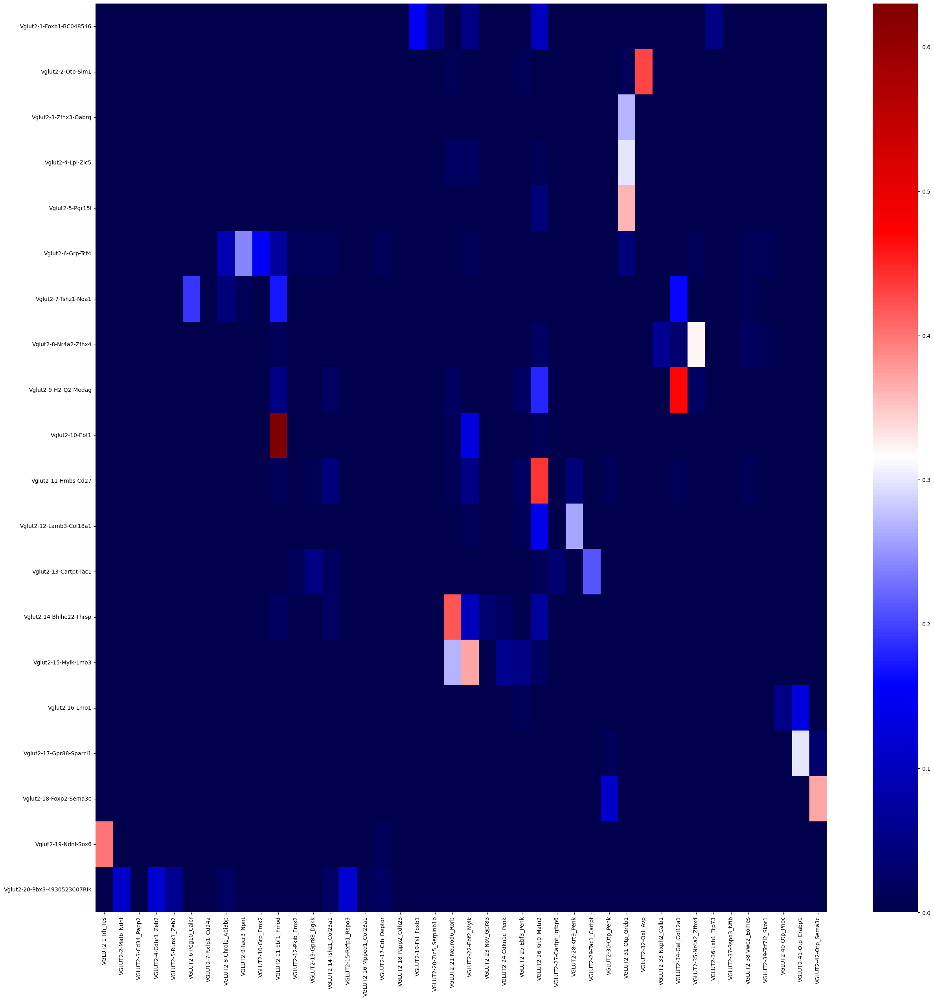

In [860]:
_, idx = np.unique(amy_vglut2_md.loc['full_name'], return_index=True)
amy_vglut2_fn = np.array(amy_vglut2_md.loc['full_name'][np.sort(idx)])

#note vglut2 #3 missing using code above
#amy_metadata_df_dd_order_vglut2 = amy_metadata_df_dd_order.loc[:,amy_metadata_df_dd_order.loc['cell_class',:]=='VGLUT2']
#_, idx = np.unique(amy_metadata_df_dd_order_vglut2.loc['celltype'], return_index=True)
#amy_vglut2_fn = np.array(amy_metadata_df_dd_order_vglut2.loc['celltype'][np.sort(idx)])

_, idx = np.unique(sd_vglut2_md_w_amc.loc['full_name'], return_index=True)
sd_vglut2_fn = np.array(sd_vglut2_md_w_amc.loc['full_name'][np.sort(idx)])

frac_vglut2_fn = pd.DataFrame(index=sd_vglut2_fn, columns=amy_vglut2_fn)

print ('running corr results from laber transfer..')
for i,sd_m in enumerate(sd_vglut2_fn):
    for j,amy_m in enumerate(amy_vglut2_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_vglut2_md_w_amc.loc[:,sd_vglut2_md_w_amc.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_vglut2_fn.loc[sd_m,amy_m] = frac
%matplotlib inline
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_vglut2_fn.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut2/frac_vglut2_amy_cts_in_sd_cts_heatmap_full_names_amy_dd.pdf')
plt.show()

/tmp/ipykernel_2519638/309949173.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_vglut1_fn = np.array(amy_vglut1_md.loc['full_name'][np.sort(idx)])
/tmp/ipykernel_2519638/309949173.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_vglut1_fn = np.array(sd_vglut1_md_w_amc.loc['full_name'][np.sort(idx)])


running corr results from laber transfer..


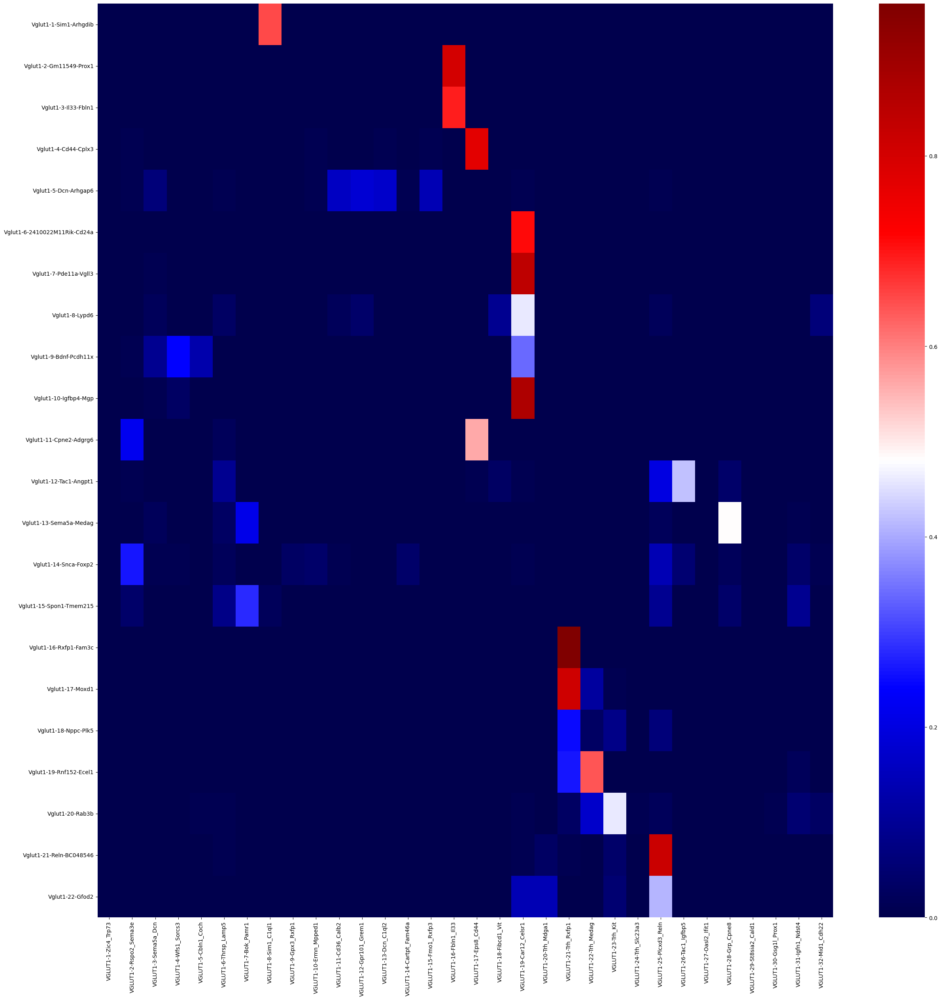

In [753]:
_, idx = np.unique(amy_vglut1_md.loc['full_name'], return_index=True)
amy_vglut1_fn = np.array(amy_vglut1_md.loc['full_name'][np.sort(idx)])

_, idx = np.unique(sd_vglut1_md_w_amc.loc['full_name'], return_index=True)
sd_vglut1_fn = np.array(sd_vglut1_md_w_amc.loc['full_name'][np.sort(idx)])

frac_vglut1_fn = pd.DataFrame(index=sd_vglut1_fn, columns=amy_vglut1_fn)

print ('running corr results from laber transfer..')
for i,sd_m in enumerate(sd_vglut1_fn):
    for j,amy_m in enumerate(amy_vglut1_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_vglut1_md_w_amc.loc[:,sd_vglut1_md_w_amc.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_vglut1_fn.loc[sd_m,amy_m] = frac
%matplotlib inline
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_vglut1_fn.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/vglut1/frac_vglut1_amy_cts_in_sd_cts_heatmap_full_names_amy_dd.pdf')
plt.show()

/tmp/ipykernel_2519638/3746936625.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_gaba_fn = np.array(amy_gaba_md.loc['full_name'][np.sort(idx)])
/tmp/ipykernel_2519638/3746936625.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_gaba_fn = np.array(sd_gaba_md_w_amc.loc['full_name'][np.sort(idx)])


running corr results from laber transfer..


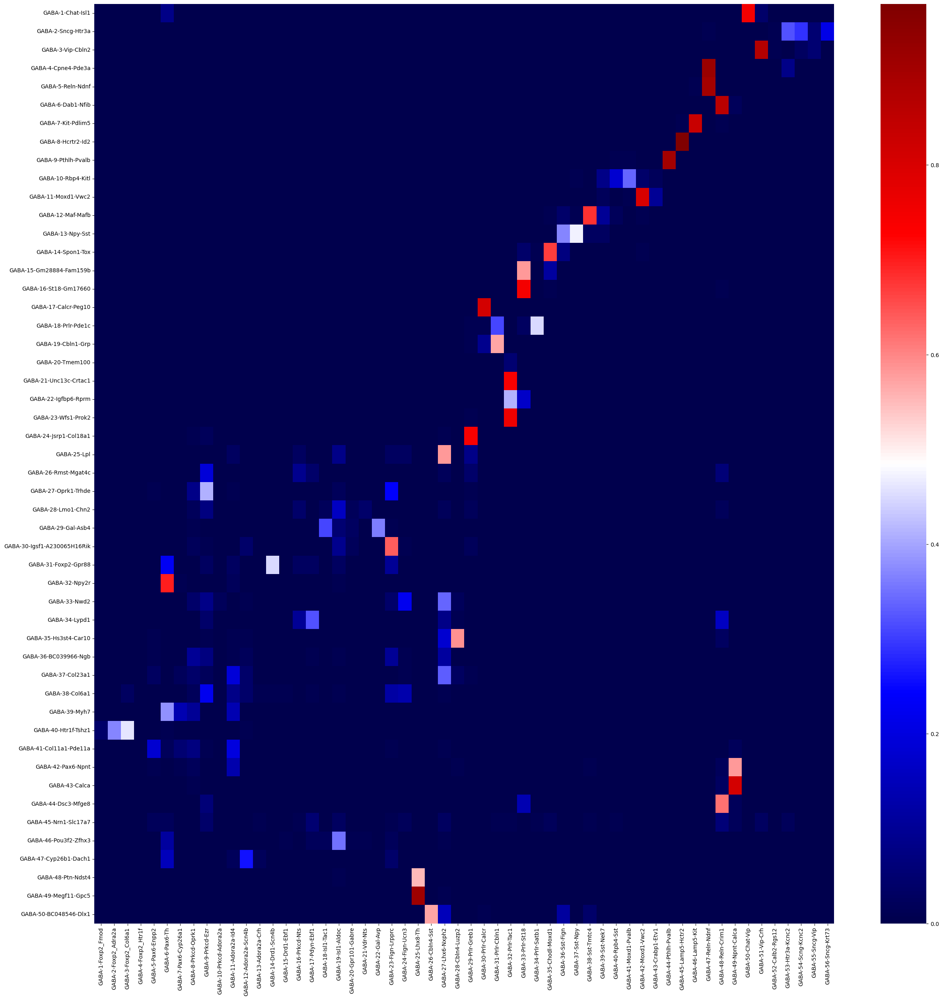

In [754]:
_, idx = np.unique(amy_gaba_md.loc['full_name'], return_index=True)
amy_gaba_fn = np.array(amy_gaba_md.loc['full_name'][np.sort(idx)])

_, idx = np.unique(sd_gaba_md_w_amc.loc['full_name'], return_index=True)
sd_gaba_fn = np.array(sd_gaba_md_w_amc.loc['full_name'][np.sort(idx)])

frac_gaba_fn = pd.DataFrame(index=sd_gaba_fn, columns=amy_gaba_fn)

print ('running corr results from laber transfer..')
for i,sd_m in enumerate(sd_gaba_fn):
    for j,amy_m in enumerate(amy_gaba_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_gaba_md_w_amc.loc[:,sd_gaba_md_w_amc.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_gaba_fn.loc[sd_m,amy_m] = frac
%matplotlib inline
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_gaba_fn.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/gaba/frac_gaba_amy_cts_in_sd_cts_heatmap_full_names_amy_dd.pdf')
plt.show()

In [749]:
with open ('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_dd_order.json') as json_data:
    amy_metadata_df_dd_order = json.load(json_data)
amy_metadata_df_dd_order = pd.DataFrame.from_dict(amy_metadata_df_dd_order, orient='columns')
amy_metadata_df_dd_order

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,


In [750]:
amy_metadata_df_dd_order_vglut2 = amy_metadata_df_dd_order.loc[:,amy_metadata_df_dd_order.loc['cell_class',:]=='VGLUT2']
_, idx = np.unique(amy_metadata_df_dd_order_vglut2.loc['celltype'], return_index=True)
vglut2_fn = np.array(amy_metadata_df_dd_order_vglut2.loc['celltype'][np.sort(idx)])
vglut2_fn

/tmp/ipykernel_2519638/3527973152.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  vglut2_fn = np.array(amy_metadata_df_dd_order_vglut2.loc['celltype'][np.sort(idx)])


array(['VGLUT2-1-Trh_Tes', 'VGLUT2-2-Mafb_Ndnf', 'VGLUT2-3-Cd34_Papp2',
       'VGLUT2-4-Cdhr1_Zeb2', 'VGLUT2-5-Runx1_Zeb2',
       'VGLUT2-6-Peg10_Calcr', 'VGLUT2-7-Rxfp1_Cd24a',
       'VGLUT2-8-Chrdl1_Abi3bp', 'VGLUT2-9-Tacr3_Npnt',
       'VGLUT2-10-Grp_Emx2', 'VGLUT2-11-Ebf1_Fmod', 'VGLUT2-12-Pkib_Emx2',
       'VGLUT2-13-Gpr88_Dgkk', 'VGLUT2-14-Tshz1_Col23a1',
       'VGLUT2-15-Rxfp1_Rspo3', 'VGLUT2-16-Mpped1_Col23a1',
       'VGLUT2-17-Crh_Deptor', 'VGLUT2-18-Papp2_Cdh23',
       'VGLUT2-19-Fst_Foxb1', 'VGLUT2-20-Zic5_Serpinb1b',
       'VGLUT2-21-Neurod6_Rorb', 'VGLUT2-22-Ebf2_Mylk',
       'VGLUT2-23-Nov_Gpr83', 'VGLUT2-24-Cdkn1c_Penk',
       'VGLUT2-25-Ebf3_Penk', 'VGLUT2-26-Krt9_Matn2',
       'VGLUT2-27-Cartpt_Igfbp6', 'VGLUT2-28-Krt9_Penk',
       'VGLUT2-29-Tac1_Cartpt', 'VGLUT2-30-Otp_Penk',
       'VGLUT2-31-Otp_Greb1', 'VGLUT2-32-Oxt_Avp',
       'VGLUT2-33-Nxph2_Calb1', 'VGLUT2-34-Gal_Col12a1',
       'VGLUT2-35-Nr4a2_Zfhx4', 'VGLUT2-36-Lxh1_Trp73',
       'VGLUT2-37

In [747]:
amy_metadata_df_dd_order_vglut2

,AAAGAACTCGCCTATC-1_08-1,AACGTCACAGCTGTGC-1_08-1,AAGTTCGAGACTGTTC-1_08-1,AGAAGTATCGGCATAT-1_08-1,AGATAGATCGTGAGAG-1_08-1,AGGACGAGTAATTAGG-1_08-1,AGGGTGAAGGTAAGAG-1_08-1,ATCCGTCCATTGTCGA-1_08-1,CACAGATAGGGTTGCA-1_08-1,CACTTCGCAGCTGCCA-1_08-1,...,ACTATTCTCAAGAGTA-1_76-2,AGTAACCGTAAGTTGA-1_76-2,ATTTACCGTTTCCAAG-1_76-2,GAAGTAAGTTCACCGG-1_76-2,GGTTAACCACAGAAGC-1_76-2,GTGATGTAGGTTTACC-1_76-2,TCATTCAGTGTTAAAG-1_76-2,TCCACGTCACTTCATT-1_76-2,TTACCGCGTCACAATC-1_76-2,TTTATGCCAGTATTCG-1_76-2
celltype,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,VGLUT2-1-Trh_Tes,...,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c
sample,08-1,08-1,08-1,08-1,08-1,08-1,08-1,08-1,08-1,08-1,...,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,0,0,0,0,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,2,2,2,2,2,2,2,2,2,2
cell_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,Trh-Tes,...,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c


In [755]:
amy_vglut2_ce_ge_cv_ls.shape

(205, 4976)

In [825]:
len(vglut2_fn)

42

/tmp/ipykernel_2519638/2381903679.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), rotation = 90)


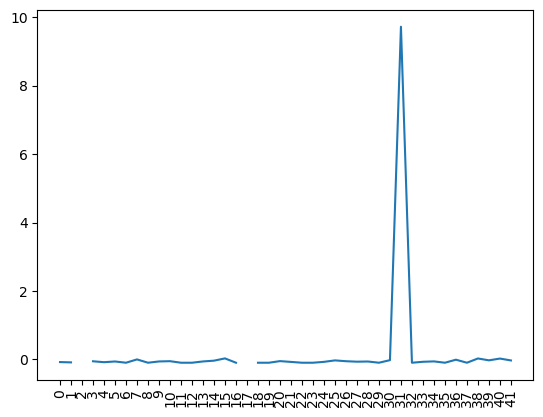

In [817]:
%matplotlib inline
gene = 'Avp'
amy_vglut2_avg_df = pd.DataFrame(index=amy_vglut2_ce_ge_cv_ls.index, columns = vglut2_fn)
lbs = vglut2_fn
for label in lbs:
    #for each cluster label, store mean expr vector
    amy_vglut2_avg_df.loc[:,label] = amy_vglut2_ce_ge_cv_ls.loc[:,amy_vglut2_md.loc['full_name']==label].mean(axis=1)
#amy_vglut2_avg_df
fig,ax = plt.subplots()
plt.plot(amy_vglut2_avg_df.loc[gene,:])
#ax.set_xticks(np.arange(1,len(vglut2_fn)+1))
ax.set_xticklabels(ax.get_xticks(), rotation = 90)
plt.show()

In [830]:
len(list(np.unique(amy_vglut2_md.loc["full_name",:])))

40

/tmp/ipykernel_2519638/2248392088.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), rotation = 90)


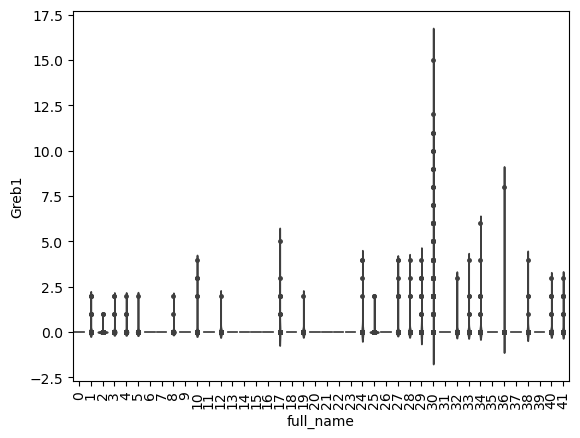

In [878]:
gene = 'Greb1'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(ax.get_xticks(), rotation = 90)
plt.show()


/tmp/ipykernel_2519638/619109404.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), rotation = 90)


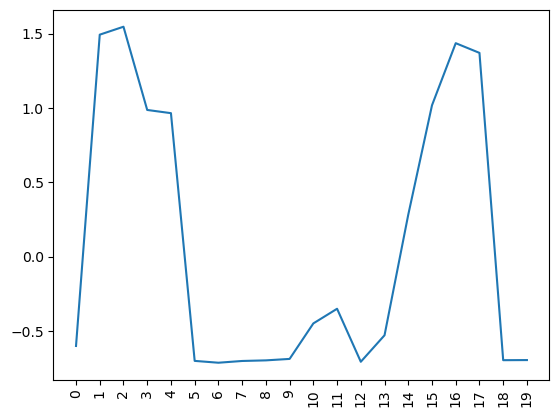

In [801]:
%matplotlib inline
gene = 'Otp'
sd_vglut2_avg_df = pd.DataFrame(index=sd_vglut2_ce_ge_cv_ls.index, columns = sd_vglut2_fn)
lbs = sd_vglut2_fn
for label in lbs:
    #for each cluster label, store mean expr vector
    sd_vglut2_avg_df.loc[:,label] = sd_vglut2_ce_ge_cv_ls.loc[:,sd_vglut2_md.loc['full_name']==label].mean(axis=1)
#sd_vglut2_avg_df
fig,ax = plt.subplots()
plt.plot(sd_vglut2_avg_df.loc[gene,:])
#ax.set_xticks(np.arange(1,len(vglut2_fn)+1))
ax.set_xticklabels(ax.get_xticks(), rotation = 90)
plt.show()

/tmp/ipykernel_2519638/236854024.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), rotation = 90)


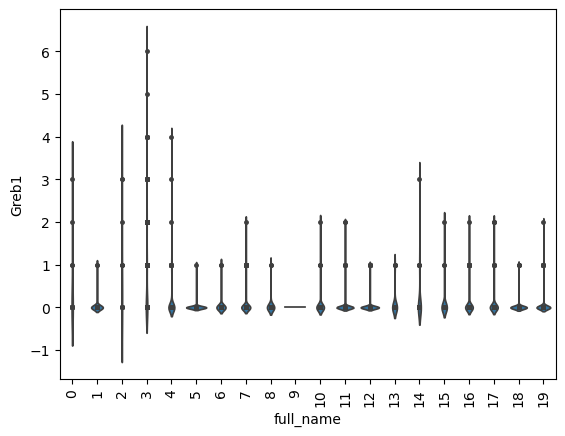

In [876]:
gene = 'Greb1'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=sd_vglut2_md.T['full_name'], y=sd_vglut2_ce_ge_cv.T[gene], inner = 'point')
#sns.stripplot(x=sd_vglut2_md.T['full_name'], y=sd_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(ax.get_xticks(), rotation = 90)
plt.show()

In [831]:
amy_metadata_df_dd_order

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,
